In [1]:
%matplotlib inline
import numpy as np
import fitting_lib_1_3 as mk
import os
import imp
import scipy.optimize as opt
import ipdb
import matplotlib.pyplot as plt
import pandas as pd
import pickle
from scipy import stats
import matplotlib.cm as cm
from IPython.display import display, Markdown
import sympy
new_rc_params = {'text.usetex': False,
"svg.fonttype": 'none'
}
plt.rcParams.update(new_rc_params)

plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25) 
plt.rcParams.update({'font.size': 25})



In [2]:
### USER PARAMETERS ###
master_name = "output_MOUSE_igg_spatial_tolerance"

mono_data_source = "Dig_Mouse_0nm_repeat1_Ab"

run_list_biv = np.array([    
    ['Dig_Mouse_3nm_repeat2', 'bivalent_close', 3.6],
    ['Dig_Mouse_7nm_repeat1', 'bivalent_close', 7.2],
    ['Dig_Mouse_7nm_repeat2', 'bivalent_close', 7.2],
    ['Dig_Mouse_14nm_repeat1', 'bivalent_close', 14.3],
    ['Dig_Mouse_14nm_repeat2', 'bivalent_close', 16.0],
    ['Dig_Mouse_16nm_repeat2', 'bivalent_close', 16.0],
    ['Dig_Mouse_17nm_repeat1', 'bivalent_close', 17.4],
    ['Dig_Mouse_17nm_repeat2', 'bivalent_close', 17.4],
    ['Dig_Mouse_21nm_repeat1', 'bivalent_close', 21],
    ['Dig_Mouse_21nm_repeat2', 'bivalent_close', 21],
#     ['Dig_Mouse_28nm_repeat1', 'bivalent_close', 28.6],
#     ['Dig_Mouse_28nm_repeat2', 'bivalent_close', 28.6],
])
conservative_error = np.max([1.2,1.3,1.4,1.7])
dist_errors = np.array([
    1.2,
    1.2,
    1.2,
    1.2,
    1.3,
    1.3,
    1.3,
    1.3,
    conservative_error,
    conservative_error,
#     1.4,
#     1.4,
])
bivalent_data_source = run_list_biv[3]

RstrRmax_slope = 0.0276 # RUab/RUstr MOUSE = 0.0276
RstrRmax_interc = 0 # RU

In [3]:
def apparent_KD(concentration, KD1, KD2):
    K_Dapp = (-1*KD2*(concentration**2-KD1**2))/(2*concentration*KD2 + KD1 + 2*KD1*KD2)
    return K_Dapp

In [4]:
### get R_struct and suggested Rmax for each item ###

In [5]:
def normalize_mono_data(run_name,struct_name):
    scaling_constant = mk.get_Rmax(struct_file_path = 'data_directory/mouseIgG_dig_MONO/'+struct_name+".txt", 
                            RstrRmax_slope=RstrRmax_slope, 
                            RstrRmax_interc=RstrRmax_interc)
    run_data_raw = mk.fetch_data_raw('data_directory/mouseIgG_dig_MONO/' + run_name+".txt")
    ### normalize here now with the Rstruct value Rmax relationship measured preivously
    run_data_mono = run_data_raw /  scaling_constant
    return run_data_mono

## progressive fitting for IgG1 dig - basic case

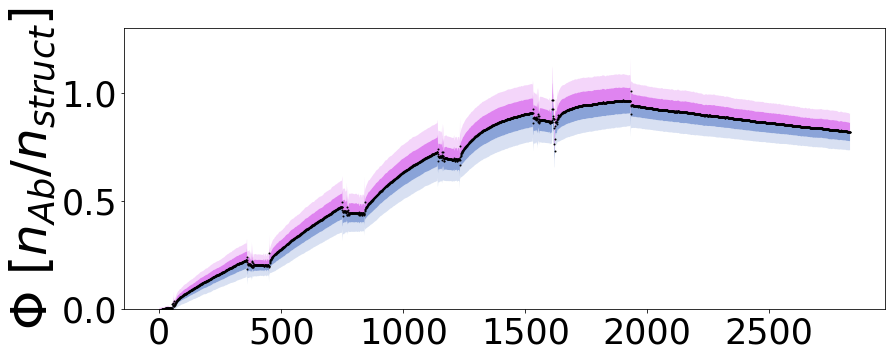

In [6]:
### revisions ####
# investigating parameterization using monovalent run replicates to get confidence intervals for the input data
output_directory = master_name+"/OUTPUT_rawsprplots"  # save spr plots into a raw spr plot directory
if not os.path.exists(output_directory):
            os.makedirs(output_directory)
plt.rc('xtick', labelsize=35) 
plt.rc('ytick', labelsize=35) 
plt.rcParams.update({'font.size': 50})

plt.figure(figsize=(30,30))

plt.subplot(521)
set_of_runs = []
set_of_runs += [normalize_mono_data("Dig_Mouse_0nm_repeat1_Ab", "Dig_Mouse_0nm_repeat1_struct")]
set_of_runs += [normalize_mono_data("Dig_Mouse_0nm_repeat2_Ab", "Dig_Mouse_0nm_repeat2_struct")]
set_of_runs += [normalize_mono_data("Dig_Mouse_21nm_repeat1_Ab_div2", "Dig_Mouse_21nm_repeat1_struct")]
set_of_runs += [normalize_mono_data("Dig_Mouse_21nm_repeat2_Ab_div2", "Dig_Mouse_21nm_repeat2_struct")]
set_of_runs += [normalize_mono_data("Dig_Mouse_28nm_repeat1_Ab_div2", "Dig_Mouse_28nm_repeat1_struct")]
set_of_runs += [normalize_mono_data("Dig_Mouse_28nm_repeat2_Ab_div2", "Dig_Mouse_28nm_repeat2_struct")]
plt.ylabel("$\\Phi$ $[n_{Ab}/n_{struct}]$")
plt.ylim(0,1.3)



run_length = np.min([len(i) for i in set_of_runs])
average_run = np.zeros(run_length)
lower_68_run = np.zeros(run_length)
upper_68_run = np.zeros(run_length)
lower_95_run = np.zeros(run_length)
upper_95_run = np.zeros(run_length)
N = len(set_of_runs)
t = range(0, len(average_run))
for i in range(0,run_length):
    sum_i = 0
    for run in set_of_runs:
        sum_i += run[i]
    average_run[i] = sum_i/N        
    diff_i = 0
    for run in set_of_runs:
        diff_i += (run[i] - average_run[i])**2
    var_i = diff_i/(N-1)
    stdev_i = (var_i**.5)/N**.5
    
    lower_68_run[i] = average_run[i]-stdev_i
    upper_68_run[i] = average_run[i]+stdev_i
    lower_95_run[i] = average_run[i]-stdev_i*2
    upper_95_run[i] = average_run[i]+stdev_i*2
    
plt.fill_between(t, 0, lower_95_run, facecolor="white", alpha=1)
plt.fill_between(t, lower_95_run, lower_68_run, facecolor="#3d66bf", alpha=.2)
plt.fill_between(t, lower_68_run, average_run, facecolor="#3d66bf", alpha=.6)
plt.fill_between(t, average_run, upper_68_run, facecolor="#cb32e6", alpha=.6)
plt.fill_between(t,  upper_68_run, upper_95_run, facecolor="#cb32e6", alpha=.2)


# for run in set_of_runs:
#     plt.scatter(range(0,len(run)), run, alpha = .33, s = .1, c = "black")
plt.scatter(t, average_run, alpha = 1, s = 1, c = "black")
plt.savefig(output_directory+"/ raw_"+master_name+"_monoplot_multiple_struct_normalized.svg")
plt.show()

### let's save a text file with the upper and lower results
with open(os.getcwd()+"/data_directory/mouseIgG_dig_MONO/OUTPUT_rawsprplots_upper_68.txt", 'w') as f:
    for s in upper_68_run:
        f.write(str(s) + '\n')
with open(os.getcwd()+"/data_directory/mouseIgG_dig_MONO/OUTPUT_rawsprplots_lower_68.txt", 'w') as f:
    for s in lower_68_run:
        f.write(str(s) + '\n')     
with open(os.getcwd()+"/data_directory/mouseIgG_dig_MONO/OUTPUT_rawsprplots_upper_95.txt", 'w') as f:
    for s in upper_95_run:
        f.write(str(s) + '\n')
with open(os.getcwd()+"/data_directory/mouseIgG_dig_MONO/OUTPUT_rawsprplots_lower_95.txt", 'w') as f:
    for s in lower_95_run:
        f.write(str(s) + '\n')             
with open(os.getcwd()+"/data_directory/mouseIgG_dig_MONO/OUTPUT_rawsprplots_mean.txt", 'w') as f:
    for s in average_run:
        f.write(str(s) + '\n')         

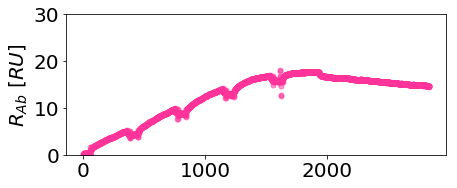

<Figure size 432x288 with 0 Axes>

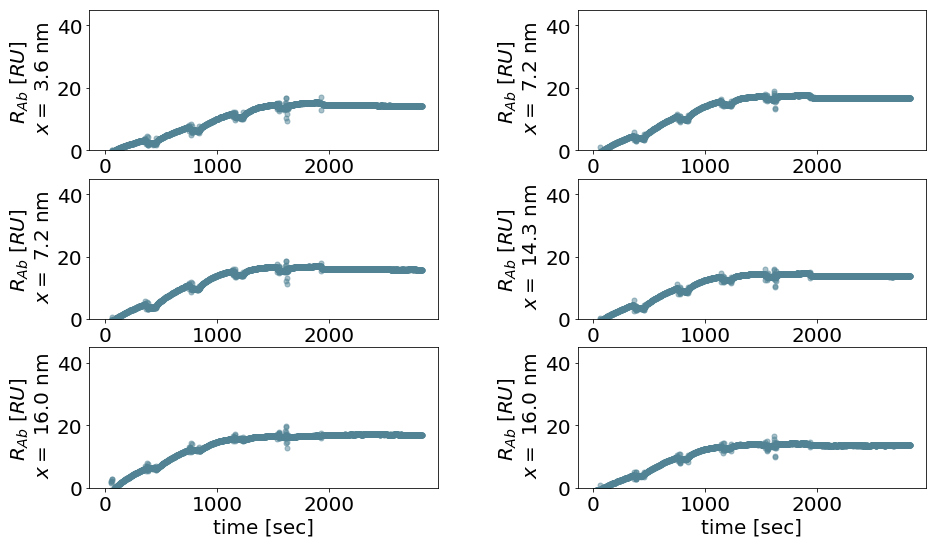

IndexError: index 10 is out of bounds for axis 0 with size 10

<Figure size 432x288 with 0 Axes>

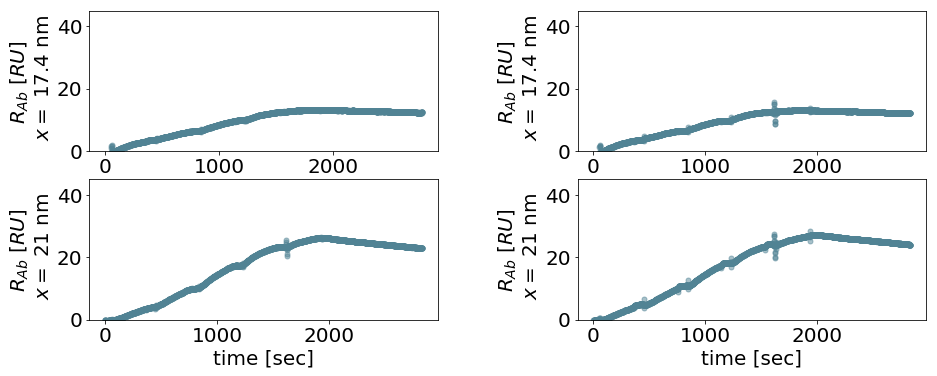

In [7]:
output_directory = master_name+"/OUTPUT_rawsprplots"  # save spr plots into a raw spr plot directory
if not os.path.exists(output_directory):
            os.makedirs(output_directory)

plt.rc('xtick', labelsize=20) 
plt.rc('ytick', labelsize=20) 
plt.rcParams.update({'font.size': 20})        
        
plt.figure(figsize=(15,15))
mono_run = list(pd.read_csv('data_directory/mouseIgG_dig_MONO/'+mono_data_source+".txt", sep="\t", header=None)[0])
plt.subplot(521)
plt.scatter(range(0, len(mono_run)), mono_run, alpha = 0.5, s = 25, c = "#ff3399")
plt.ylabel("$R_{Ab}$ $[RU]$")
plt.ylim(0,30)
plt.savefig(output_directory+"/ raw_"+master_name+"_monoplot.svg")
plt.show()

plt.tight_layout()
plt.figure(figsize=(15,15))
left = 0.9  # the left side of the subplots of the figure
right = 0.9   # the right side of the subplots of the figure
bottom = 0.1  # the bottom of the subplots of the figure
top = 0.0     # the top of the subplots of the figure
wspace =10  # the amount of width reserved for space between subplots,
hspace = 0.2

### save plots of the bivalent runs of different distances ###
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=.4, hspace=None)
for i in range(0,6):
    run_data = list(pd.read_csv('data_directory/Dig_distances_Mouse/'+run_list_biv[i][0]+'.txt', sep="\t", header=None)[0])
    plotnum = 521+i
    plt.subplot(plotnum)
    plt.scatter(range(0, len(run_data)), run_data, alpha = 0.5, s = 25, c = "#518394")
    plt.ylabel("$R_{Ab}$ $[RU]$ \n $x = $ %s"% run_list_biv[i][2] + " nm")
    plt.xlabel("time [sec]")
    plt.ylim(0,45)

plt.savefig(output_directory+"/ raw_"+master_name+"_distanceplots1.svg")
plt.show()
plt.close()

plt.tight_layout()
plt.figure(figsize=(15,15))
left = 0.9  # the left side of the subplots of the figure
right = 0.9   # the right side of the subplots of the figure
bottom = 0.1  # the bottom of the subplots of the figure
top = 0.0     # the top of the subplots of the figure
wspace =10  # the amount of width reserved for space between subplots,
hspace = 0.2

### save plots of the bivalent runs of different distances ###
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=.4, hspace=None)
for i in range(6,12):
    run_data = list(pd.read_csv('data_directory/Dig_distances_Mouse/'+run_list_biv[i][0]+'.txt', sep="\t", header=None)[0])
    plotnum = 521+i-6
    plt.subplot(plotnum)
    plt.scatter(range(0, len(run_data)), run_data, alpha = 0.5, s = 25, c = "#518394")
    plt.ylabel("$R_{Ab}$ $[RU]$ \n $x = $ %s"% run_list_biv[i][2] + " nm")
    plt.xlabel("time [sec]")
    plt.ylim(0,45)

plt.savefig(output_directory+"/ raw_"+master_name+"_distanceplots2.svg")
plt.show()
plt.close()
plt.tight_layout()
plt.figure(figsize=(15,15))
left = 0.9  # the left side of the subplots of the figure
right = 0.9   # the right side of the subplots of the figure
bottom = 0.1  # the bottom of the subplots of the figure
top = 0.0     # the top of the subplots of the figure
wspace =10  # the amount of width reserved for space between subplots,
hspace = 0.2
### save plots of the bivalent runs of different distances ###
plt.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=.4, hspace=None)
for i in range(12,len(run_list_biv)):
    run_data = list(pd.read_csv('data_directory/Dig_distances_Mouse/'+run_list_biv[i][0]+'.txt', sep="\t", header=None)[0])
    plotnum = 521+i-12
    plt.subplot(plotnum)
    plt.scatter(range(0, len(run_data)), run_data, alpha = 0.5, s = 25, c = "#518394")
    plt.ylabel("$R_{Ab}$ $[RU]$ \n $x = $ %s"% run_list_biv[i][2] + " nm")
    plt.xlabel("time [sec]")
    plt.ylim(0,45)

plt.savefig(output_directory+"/ raw_"+master_name+"_distanceplots2.svg")
plt.show()
plt.close()

### estimating monovalent rates (lower 95% confidence interval bound on input data)

/home/ian/miniconda3/envs/stenv2/lib/python2.7/site-packages/scipy/optimize/minpack.py:787: OptimizeWarning: Covariance of the parameters could not be estimated
  category=OptimizeWarning)


('K_D1_guess = ', -1.0106416777554937e-14)


<Figure size 432x288 with 0 Axes>

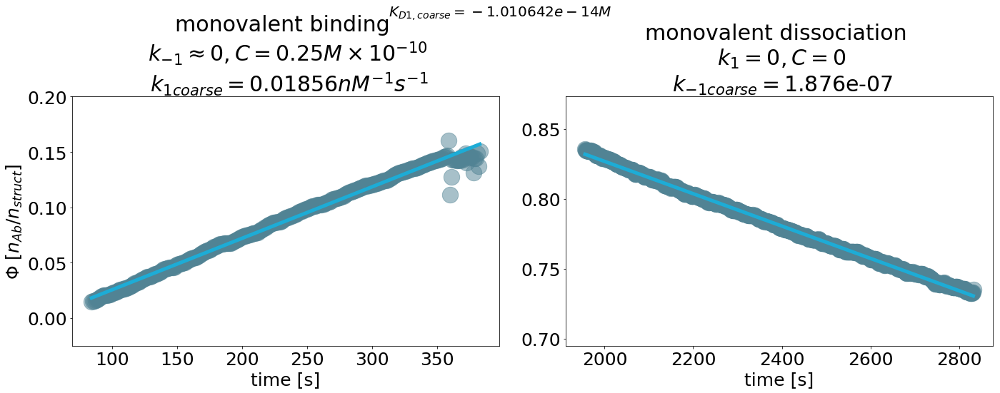

$${\huge K_{D1,coarse}=-1.0106416777554937e-14M \huge}$$

In [8]:
imp.reload(mk)
output_directory = master_name+"/OUTPUT_monovalent_coarse_fitting"
if not os.path.exists(output_directory):
            os.makedirs(output_directory)
if not os.path.exists(master_name+"/pickle_directory"):
            os.makedirs(master_name+"/pickle_directory")
        
time_points = np.array([0, 84, 384, 475, 775, 866, 1166, 1257, 1557, 1656, 1956])
concentrations = np.array([0, 0.025, 0, 0.05, 0, 0.1, 0, .25, 0, .5, 0]) # nM e-9

##########################
run_data_mono = lower_95_run
##########################


t1 = np.arange(time_points[1], time_points[2])
t2 = np.arange(time_points[-1], len(run_data_mono))


run_data1 = run_data_mono[time_points[1]:time_points[2]]
run_data2 = run_data_mono[time_points[-1]:]


k_on_glower95, k_off_glower95 = mk.avg_slope_guess(time_points, concentrations,run_data_mono)
k1, intercept1, r_value1, p_value1, std_err1 = stats.linregress(t1[0:300], run_data1[0:300])
# import pdb; pdb.set_trace()
popt, pcov = opt.curve_fit(mk.exponential_decay_fit, t2, run_data2,p0=(1, 1e-6, 1), maxfev=100000)
KD1_guesslower95 = k_off_glower95 / (k_on_glower95*10**9)
print("K_D1_guess = ", KD1_guesslower95)

plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25) 
plt.rcParams.update({'font.size': 25})

plt.tight_layout()

plt.figure(figsize=(20,8))

plt.subplots_adjust(left=None, bottom=None, right=None, top=0.78, wspace=.1, hspace=None)
plt.subplot(121)
plt.scatter(t1,run_data1, alpha = 0.5, s = 500, c = "#518394")
plt.plot(t1,t1*k1+intercept1,c="#1DACD6", linewidth=5)
plt.title("monovalent binding \n $k_{-1} \\approx 0, C = 0.25 M \\times 10 ^{-10}$ \n $k_{1 coarse} = $"+str(np.round(k_on_glower95,5))+"$nM^{-1}s^{-1}$")
plt.ylabel("$\\Phi$ $[n_{Ab}/n_{struct}]$")
plt.xlabel("time [s]")
plt.subplot(122)
plt.scatter(t2,run_data2, alpha = 0.5, s = 500, c = "#518394")
plt.plot(t2,mk.exponential_decay_fit(t2,popt[0],popt[1],popt[2]),c="#1DACD6", linewidth=5)
plt.title("monovalent dissociation \n $k_{1} = 0, C = 0$ \n $k_{-1 coarse} = $"+str(np.round(np.abs(k_off_glower95),10)))
plt.xlabel("time [s]")
plt.suptitle("${K_{D1,coarse}=%.6e M}$"%KD1_guesslower95, fontsize=20)
plt.savefig(output_directory+"/monovalent_guesslower95.svg")

plt.tight_layout()
plt.show()
plt.close()

display(Markdown("$${\huge K_{D1,coarse}="+str(KD1_guesslower95)+"M \huge}$$"))




### estimating monovalent rates (lower 68% confidence interval bound on input data)

fitting_lib_1_3.py:43: RuntimeWarning: invalid value encountered in sqrt
  r_off_err = np.sqrt(np.diag(pcov))[1]


('K_D1_guess = ', -6.0011238044067885e-15)


<Figure size 432x288 with 0 Axes>

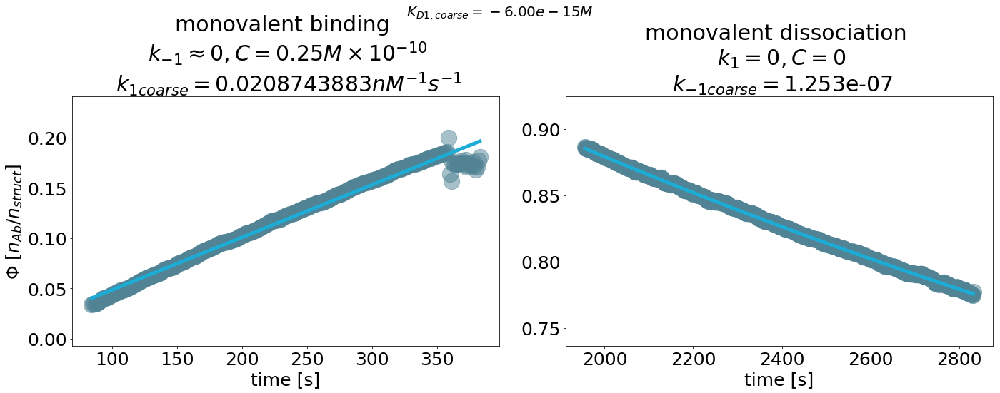

$${\huge K_{D1,coarse}=-6.0011238044067885e-15M \huge}$$

In [9]:
imp.reload(mk)
output_directory = master_name+"/OUTPUT_monovalent_coarse_fitting"
if not os.path.exists(output_directory):
            os.makedirs(output_directory)
if not os.path.exists(master_name+"/pickle_directory"):
            os.makedirs(master_name+"/pickle_directory")
        
time_points = np.array([0, 84, 384, 475, 775, 866, 1166, 1257, 1557, 1656, 1956])
concentrations = np.array([0, 0.025, 0, 0.05, 0, 0.1, 0, .25, 0, .5, 0]) # nM e-9

##########################
run_data_mono = lower_68_run
##########################


t1 = np.arange(time_points[1], time_points[2])
t2 = np.arange(time_points[-1], len(run_data_mono))


run_data1 = run_data_mono[time_points[1]:time_points[2]]
run_data2 = run_data_mono[time_points[-1]:]


k_on_glower68, k_off_glower68 = mk.avg_slope_guess(time_points, concentrations,run_data_mono)
k1, intercept1, r_value1, p_value1, std_err1 = stats.linregress(t1[0:300], run_data1[0:300])
# import pdb; pdb.set_trace()
popt, pcov = opt.curve_fit(mk.exponential_decay_fit, t2, run_data2,p0=(1, 1e-6, 1), maxfev=1000000)
KD1_guesslower68 = k_off_glower68 / (k_on_glower68*10**9)
print("K_D1_guess = ", KD1_guesslower68)

plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25) 
plt.rcParams.update({'font.size': 25})

plt.tight_layout()

plt.figure(figsize=(20,8))

plt.subplots_adjust(left=None, bottom=None, right=None, top=0.78, wspace=.1, hspace=None)
plt.subplot(121)
plt.scatter(t1,run_data1, alpha = 0.5, s = 500, c = "#518394")
plt.plot(t1,t1*k1+intercept1,c="#1DACD6", linewidth=5)
plt.title("monovalent binding \n $k_{-1} \\approx 0, C = 0.25 M \\times 10 ^{-10}$ \n $k_{1 coarse} = $"+str(np.round(k_on_glower68,10))+"$nM^{-1}s^{-1}$")
plt.ylabel("$\\Phi$ $[n_{Ab}/n_{struct}]$")
plt.xlabel("time [s]")
plt.subplot(122)
plt.scatter(t2,run_data2, alpha = 0.5, s = 500, c = "#518394")
plt.plot(t2,mk.exponential_decay_fit(t2,popt[0],popt[1],popt[2]),c="#1DACD6", linewidth=5)
plt.title("monovalent dissociation \n $k_{1} = 0, C = 0$ \n $k_{-1 coarse} = $"+str(np.round(np.abs(k_off_glower68),10)))
plt.xlabel("time [s]")
plt.suptitle("${K_{D1,coarse}=%.2e M}$"%KD1_guesslower68, fontsize=20)
plt.savefig(output_directory+"/monovalent_guesslower68.svg")

plt.tight_layout()
plt.show()
plt.close()

# plt.figure(figsize=(20,5))
# plt.scatter(range(0,len(run_data_mono)), run_data_mono, alpha = 0.5, s = 100, c = "#518394")
# plt.ylim(0,1)

# plt.ylabel("$R_{Ab}$ $[RU]$")
# plt.xlabel("time [s]")
# plt.savefig(output_directory+"/monovalent_spr_curve_lower68.svg")
# plt.show()
# plt.close()

# import pickle as pkl
# pkl.dump([scaling_constant, time_points,  concentrations, run_data_mono, run_list_biv,
#           t1, t2, run_data1,run_data2,
#           k_on_glower68, k_off_glower68,k1, intercept1, r_value1, p_value1, std_err1,popt, pcov,KD1_guesslower68          
#          ], open(master_name+'/pickle_directory/guess_on_rateslower68.pickle', 'wb'))

display(Markdown("$${\huge K_{D1,coarse}="+str(KD1_guesslower68)+"M \huge}$$"))




### estimating monovalent rates (upper 95% confidence interval bound on input data)

('K_D1_guess = ', 6.224068714814934e-12)


<Figure size 432x288 with 0 Axes>

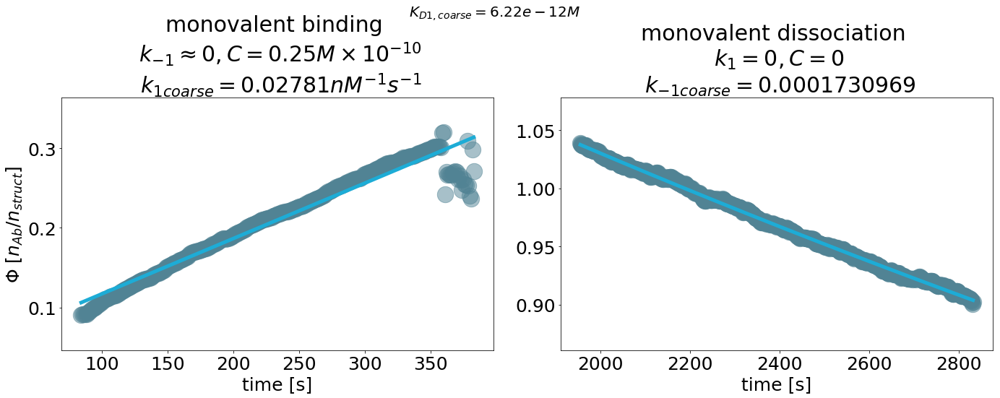

$${\huge K_{D1,coarse}=6.224068714814934e-12M \huge}$$

In [10]:

##########################
run_data_mono = upper_95_run
##########################


t1 = np.arange(time_points[1], time_points[2])
t2 = np.arange(time_points[-1], len(run_data_mono))


run_data1 = run_data_mono[time_points[1]:time_points[2]]
run_data2 = run_data_mono[time_points[-1]:]


k_on_gupper95, k_off_gupper95 = mk.avg_slope_guess(time_points, concentrations,run_data_mono)
k1, intercept1, r_value1, p_value1, std_err1 = stats.linregress(t1[0:300], run_data1[0:300])
# import pdb; pdb.set_trace()
popt, pcov = opt.curve_fit(mk.exponential_decay_fit, t2, run_data2,p0=(1, 1e-6, 1), maxfev=1000000)
KD1_guessupper95 = k_off_gupper95 / (k_on_gupper95*10**9)
print("K_D1_guess = ", KD1_guessupper95)

plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25) 
plt.rcParams.update({'font.size': 25})

plt.tight_layout()

plt.figure(figsize=(20,8))

plt.subplots_adjust(left=None, bottom=None, right=None, top=0.78, wspace=.1, hspace=None)
plt.subplot(121)
plt.scatter(t1,run_data1, alpha = 0.5, s = 500, c = "#518394")
plt.plot(t1,t1*k1+intercept1,c="#1DACD6", linewidth=5)
plt.title("monovalent binding \n $k_{-1} \\approx 0, C = 0.25 M \\times 10 ^{-10}$ \n $k_{1 coarse} = $"+str(np.round(k_on_gupper95,5))+"$nM^{-1}s^{-1}$")
plt.ylabel("$\\Phi$ $[n_{Ab}/n_{struct}]$")
plt.xlabel("time [s]")
plt.subplot(122)
plt.scatter(t2,run_data2, alpha = 0.5, s = 500, c = "#518394")
plt.plot(t2,mk.exponential_decay_fit(t2,popt[0],popt[1],popt[2]),c="#1DACD6", linewidth=5)
plt.title("monovalent dissociation \n $k_{1} = 0, C = 0$ \n $k_{-1 coarse} = $"+str(np.round(np.abs(k_off_gupper95),10)))
plt.xlabel("time [s]")
plt.suptitle("${K_{D1,coarse}=%.2e M}$"%KD1_guessupper95, fontsize=20)
plt.savefig(output_directory+"/monovalent_guessupper95.svg")

plt.tight_layout()
plt.show()
plt.close()

display(Markdown("$${\huge K_{D1,coarse}="+str(KD1_guessupper95)+"M \huge}$$"))

### estimating monovalent rates (upper 68% confidence interval bound on input data)

('K_D1_guess = ', -6.3153683870857934e-15)


<Figure size 432x288 with 0 Axes>

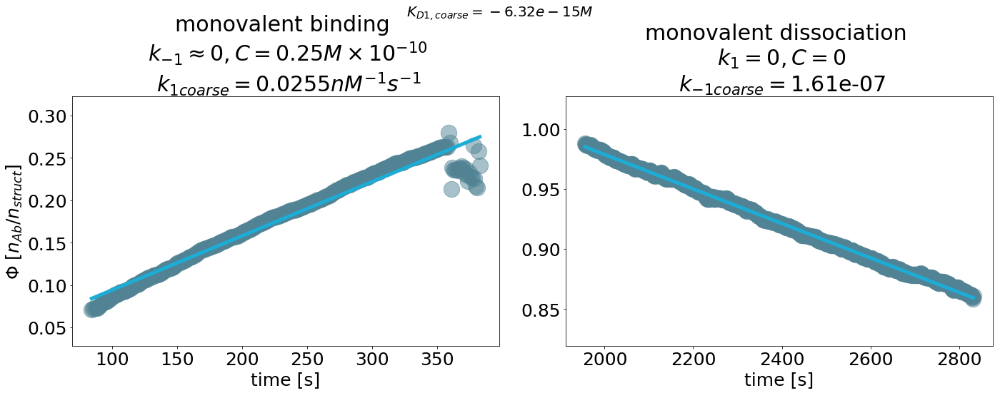

$${\huge K_{D1,coarse}=-6.3153683870857934e-15M \huge}$$

In [11]:

##########################
run_data_mono = upper_68_run
##########################


t1 = np.arange(time_points[1], time_points[2])
t2 = np.arange(time_points[-1], len(run_data_mono))


run_data1 = run_data_mono[time_points[1]:time_points[2]]
run_data2 = run_data_mono[time_points[-1]:]


k_on_gupper68, k_off_gupper68 = mk.avg_slope_guess(time_points, concentrations,run_data_mono)
k1, intercept1, r_value1, p_value1, std_err1 = stats.linregress(t1[0:300], run_data1[0:300])
# import pdb; pdb.set_trace()
popt, pcov = opt.curve_fit(mk.exponential_decay_fit, t2, run_data2,p0=(1, 1e-6, 1), maxfev=1000000)
KD1_guessupper68 = k_off_gupper68 / (k_on_gupper68*10**9)
print("K_D1_guess = ", KD1_guessupper68)

plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25) 
plt.rcParams.update({'font.size': 25})

plt.tight_layout()

plt.figure(figsize=(20,8))

plt.subplots_adjust(left=None, bottom=None, right=None, top=0.78, wspace=.1, hspace=None)
plt.subplot(121)
plt.scatter(t1,run_data1, alpha = 0.5, s = 500, c = "#518394")
plt.plot(t1,t1*k1+intercept1,c="#1DACD6", linewidth=5)
plt.title("monovalent binding \n $k_{-1} \\approx 0, C = 0.25 M \\times 10 ^{-10}$ \n $k_{1 coarse} = $"+str(np.round(k_on_gupper68,5))+"$nM^{-1}s^{-1}$")
plt.ylabel("$\\Phi$ $[n_{Ab}/n_{struct}]$")
plt.xlabel("time [s]")
plt.subplot(122)
plt.scatter(t2,run_data2, alpha = 0.5, s = 500, c = "#518394")
plt.plot(t2,mk.exponential_decay_fit(t2,popt[0],popt[1],popt[2]),c="#1DACD6", linewidth=5)
plt.title("monovalent dissociation \n $k_{1} = 0, C = 0$ \n $k_{-1 coarse} = $"+str(np.round(np.abs(k_off_gupper68),10)))
plt.xlabel("time [s]")
plt.suptitle("${K_{D1,coarse}=%.2e M}$"%KD1_guessupper68, fontsize=20)
plt.savefig(output_directory+"/monovalent_guessupper68.svg")

plt.tight_layout()
plt.show()
plt.close()

# plt.figure(figsize=(20,5))
# plt.scatter(range(0,len(run_data_mono)), run_data_mono, alpha = 0.5, s = 100, c = "#518394")
# plt.ylim(0,1)

# plt.ylabel("$R_{Ab}$ $[RU]$")
# plt.xlabel("time [s]")
# plt.savefig(output_directory+"/monovalent_spr_curve_.svg")
# plt.show()
# plt.close()

# import pickle as pkl
# pkl.dump([scaling_constant, time_points,  concentrations, run_data_mono, run_list_biv,
#           t1, t2, run_data1,run_data2,
#           k_on_gupper68, k_off_gupper68,k1, intercept1, r_value1, p_value1, std_err1,popt, pcov,KD1_guessupper68          
#          ], open(master_name+'/pickle_directory/guess_on_rates.pickle', 'wb'))

display(Markdown("$${\huge K_{D1,coarse}="+str(KD1_guessupper68)+"M \huge}$$"))

### estimating monovalent rates (mean confidence interval on input data)

('K_D1_guess = ', -5.919160103106015e-15)


<Figure size 432x288 with 0 Axes>

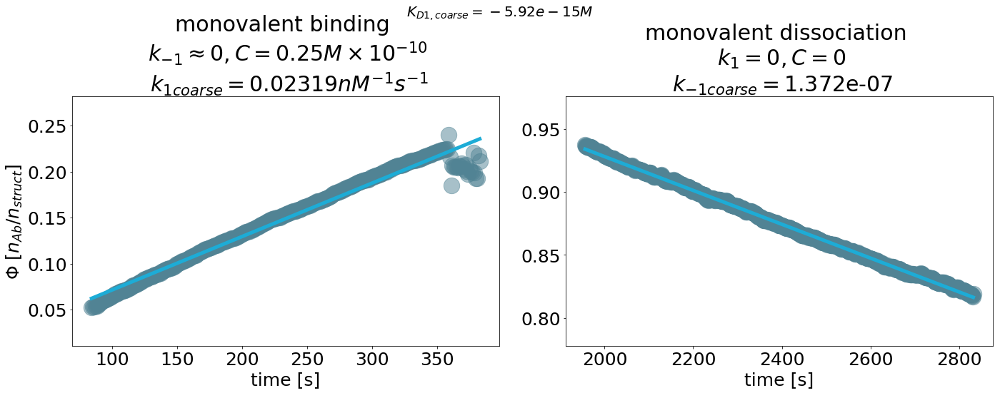

$${\huge K_{D1,coarse}=-5.919160103106015e-15M \huge}$$

In [12]:

##########################
run_data_mono = average_run
##########################


t1 = np.arange(time_points[1], time_points[2])
t2 = np.arange(time_points[-1], len(run_data_mono))


run_data1 = run_data_mono[time_points[1]:time_points[2]]
run_data2 = run_data_mono[time_points[-1]:]


k_on_gmean, k_off_gmean = mk.avg_slope_guess(time_points, concentrations,run_data_mono)
k1, intercept1, r_value1, p_value1, std_err1 = stats.linregress(t1[0:300], run_data1[0:300])
# import pdb; pdb.set_trace()
popt, pcov = opt.curve_fit(mk.exponential_decay_fit, t2, run_data2,p0=(1, 1e-6, 1), maxfev=1000000)
KD1_guessmean = k_off_gmean / (k_on_gmean*10**9)
print("K_D1_guess = ", KD1_guessmean)

plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25) 
plt.rcParams.update({'font.size': 25})

plt.tight_layout()

plt.figure(figsize=(20,8))

plt.subplots_adjust(left=None, bottom=None, right=None, top=0.78, wspace=.1, hspace=None)
plt.subplot(121)
plt.scatter(t1,run_data1, alpha = 0.5, s = 500, c = "#518394")
plt.plot(t1,t1*k1+intercept1,c="#1DACD6", linewidth=5)
plt.title("monovalent binding \n $k_{-1} \\approx 0, C = 0.25 M \\times 10 ^{-10}$ \n $k_{1 coarse} = $"+str(np.round(k_on_gmean,5))+"$nM^{-1}s^{-1}$")
plt.ylabel("$\\Phi$ $[n_{Ab}/n_{struct}]$")
plt.xlabel("time [s]")
plt.subplot(122)
plt.scatter(t2,run_data2, alpha = 0.5, s = 500, c = "#518394")
plt.plot(t2,mk.exponential_decay_fit(t2,popt[0],popt[1],popt[2]),c="#1DACD6", linewidth=5)
plt.title("monovalent dissociation \n $k_{1} = 0, C = 0$ \n $k_{-1 coarse} = $"+str(np.round(np.abs(k_off_gmean),10)))
plt.xlabel("time [s]")
plt.suptitle("${K_{D1,coarse}=%.2e M}$"%KD1_guessmean, fontsize=20)
plt.savefig(output_directory+"/monovalent_guessmean.svg")

plt.tight_layout()
plt.show()
plt.close()

# plt.figure(figsize=(20,5))
# plt.scatter(range(0,len(run_data_mono)), run_data_mono, alpha = 0.5, s = 100, c = "#518394")
# plt.ylim(0,1)

# plt.ylabel("$R_{Ab}$ $[RU]$")
# plt.xlabel("time [s]")
# plt.savefig(output_directory+"/monovalent_spr_curve_.svg")
# plt.show()
# plt.close()

# import pickle as pkl
# pkl.dump([scaling_constant, time_points,  concentrations, run_data_mono, run_list_biv,
#           t1, t2, run_data1,run_data2,
#           k_on_gmean, k_off_gmean,k1, intercept1, r_value1, p_value1, std_err1,popt, pcov,KD1_guessmean          
#          ], open(master_name+'/pickle_directory/guess_on_rates.pickle', 'wb'))

display(Markdown("$${\huge K_{D1,coarse}="+str(KD1_guessmean)+"M \huge}$$"))

In [13]:
# import pickle as pkl
# scaling_constant, time_points,  concentrations, \
# run_data_mono,run_list_biv, t1, t2, run_data1,run_data2,k_on_g, \
# k_off_g,k1, intercept1, r_value1, p_value1, std_err1,popt, pcov,KD1_guess = \
#     pkl.load(open(master_name+'/pickle_directory/guess_on_rates.pickle', 'rb'))

## monovalent fine fit - simulated annealing mean run



('(fit_annealing) variable parameter: ', array([2.31865551e-02, 1.37244932e-07, 1.00000000e+00]), 'log10 variable parameter: ', array([-1.63476377, -6.86250368,  0.        ]))
basinhopping step 0: f 35.0707
basinhopping step 1: f 35.0707 trial_f 35.0707 accepted 1  lowest_f 35.0707
found new global minimum on step 1 with function value 35.0707
('OUTPUT_rawsprplots_mean', [-1.4745617088406335, -3.7779567542860084, -0.023288901557807197])


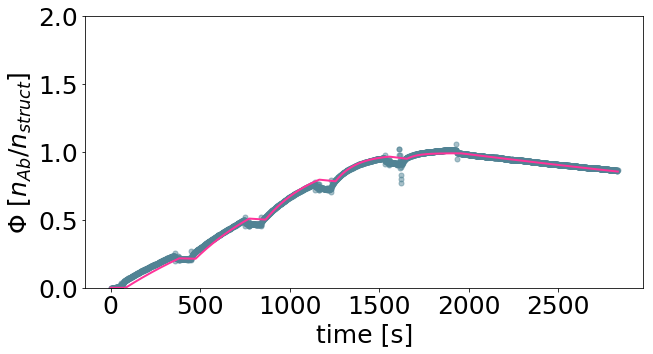

[3.35303658e-02 1.66741324e-04 9.47787766e-01]


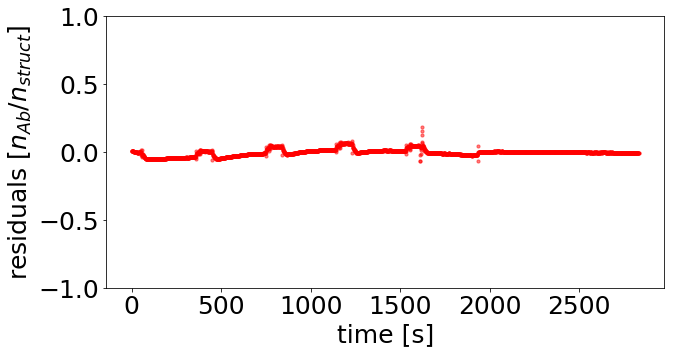

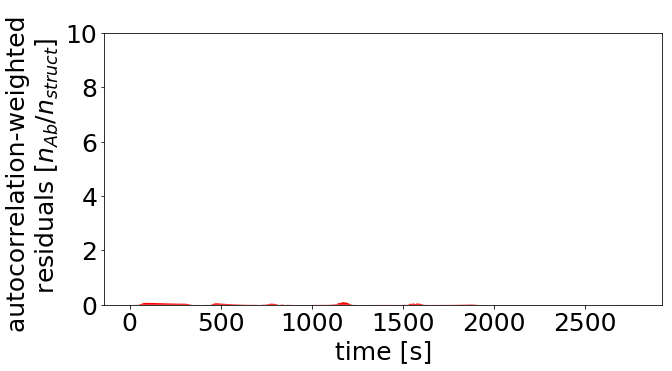

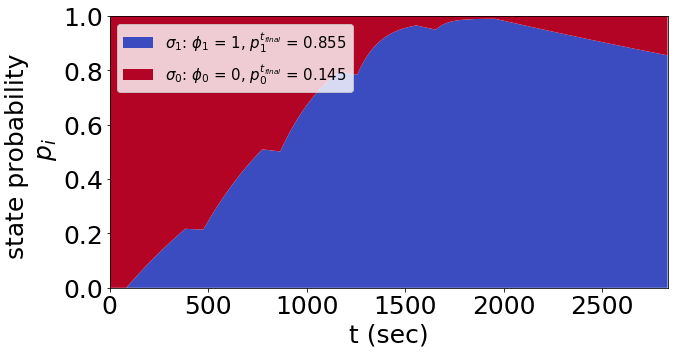

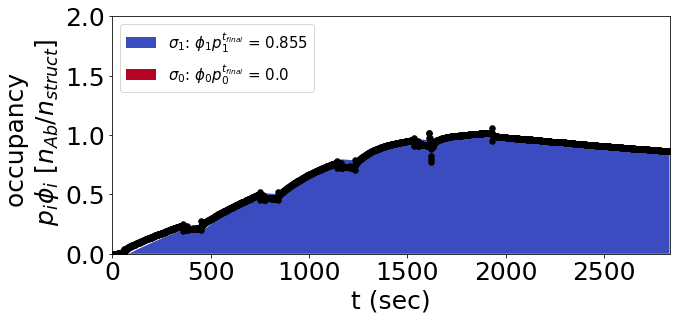

[array([-1.47456171, -3.77795675, -0.0232889 ])]


<Figure size 360x144 with 0 Axes>

$${\huge K_{D1,fine}=4.97284536364071e-12M \huge}$$

('kon, koff:', 33530365.78169497, 0.00016674132401867895)


In [13]:
# change to the fine fitting routine - 2021
# input run is now already in antibody per structure units, taken from the average curves computed above
# already been through normalization process, no input structure data required
imp.reload(mk)
mono_data_source = "OUTPUT_rawsprplots_mean"
output_dir = master_name+"/output_monovalent_fine_fitting_mean"
k_on_g, k_off_g = np.abs(k_on_gmean), np.abs(k_off_gmean)
origami_1 = mk.Fitting(run_list = np.array([[mono_data_source,"monovalent"]]), 
                       run_type = "mono",
                       mono_rates = np.array([k_on_g, k_off_g]),
                       KD_biv = None,
                       concentrations = concentrations,
                       time_points = time_points, 
                       scaling_constant = 1,
                      output_dir = output_dir,
                      struct_params = ['data_directory/mouseIgG_dig_MONO/',RstrRmax_slope, RstrRmax_interc],
                      data_dir ='data_directory/mouseIgG_dig_MONO/' )
origami_1.set_bounds(((-12,2),(-12,2),(np.log10(.8),np.log10(1.2))))
origami_1.print_graph = False
xopt_compilation = np.power(10,origami_1.fit_annealing())
k_on_mean, k_off_mean, norm1 = xopt_compilation[0][0], xopt_compilation[0][1], xopt_compilation[0][2]

KD1_mean = k_off_mean /(k_on_mean*10**9) # M
# pkl.dump([xopt_compilation, 
#           k_on, k_off, norm1,origami_1 ,KD1         
#          ], open(master_name+'/pickle_directory/monovalent_fine_fitting_result.pickle', 'wb'))
plt.figure(figsize=(5,2))
plt.suptitle("${K_{D1,fine}=%.2e M}$"%KD1_mean, fontsize=34)
plt.savefig(output_dir+"/KD1_value_fine.svg")
plt.show()
plt.close()
display(Markdown("$${\huge K_{D1,fine}="+str(KD1_mean)+"M \huge}$$"))
print("kon, koff:",k_on_mean*10**9, k_off_mean)

## mono fine upper95 run

('(fit_annealing) variable parameter: ', array([3.45138126e-02, 1.06176979e-04, 1.00000000e+00]), 'log10 variable parameter: ', array([-1.46200706, -3.97396964,  0.        ]))
basinhopping step 0: f 133.742
basinhopping step 1: f 133.742 trial_f 133.742 accepted 1  lowest_f 133.742
('OUTPUT_rawsprplots_upper_95', [-1.2987907211663487, -3.7422620275565075, 0.07918124604762482])


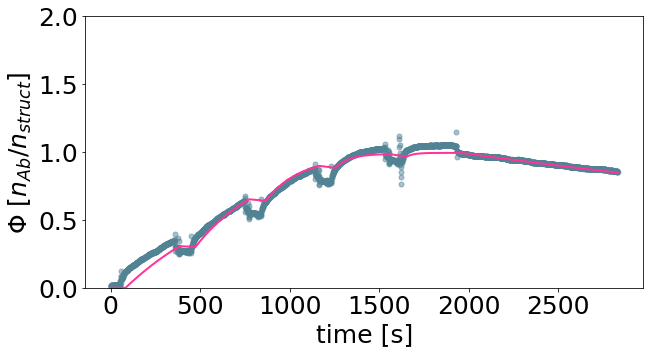

[5.02584718e-02 1.81024757e-04 1.20000000e+00]


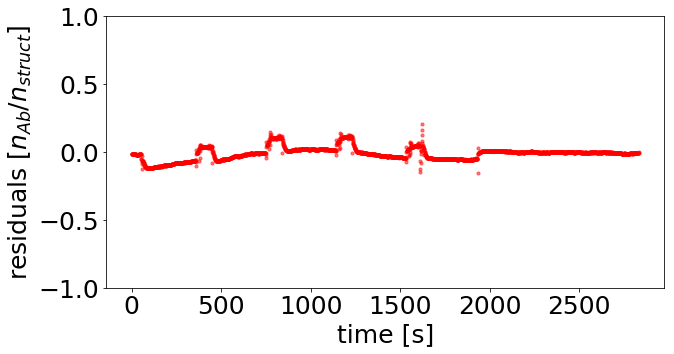

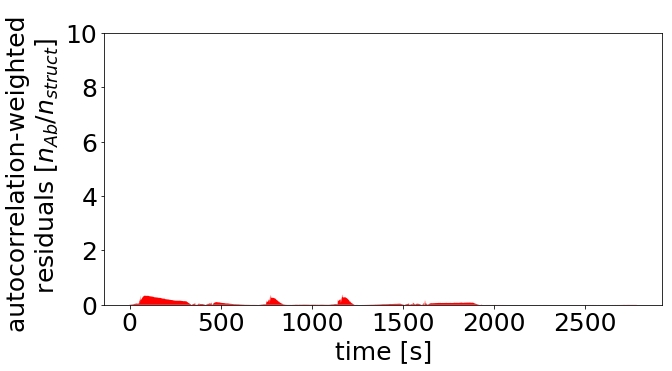

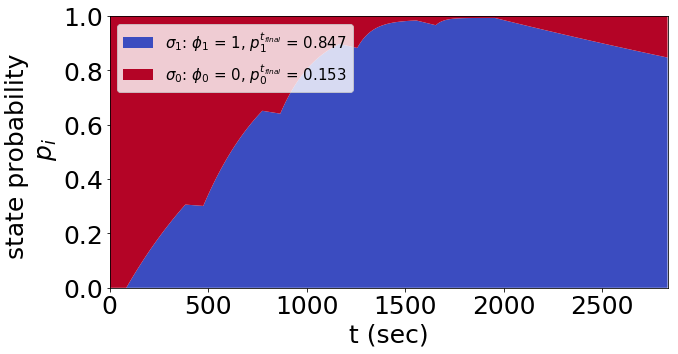

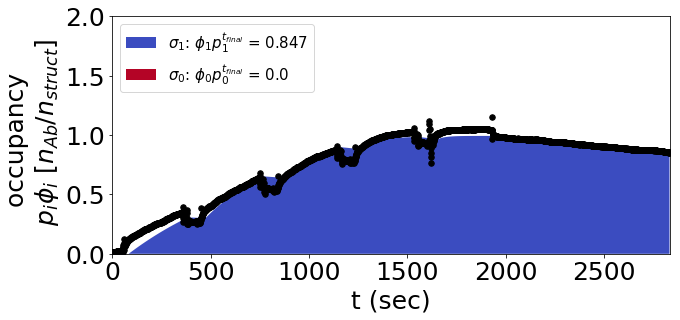

[array([-1.29879072, -3.74226203,  0.07918125])]


<Figure size 360x144 with 0 Axes>

$${\huge K_{D1,fine}=3.601875470119196e-12M \huge}$$

('kon, koff:', 50258471.787018925, 0.00018102475669534113)


In [15]:
# change to the fine fitting routine - 2021
# input run is now already in antibody per structure units, taken from the average curves computed above
# already been through normalization process, no input structure data required
imp.reload(mk)
mono_data_source = "OUTPUT_rawsprplots_upper_95"
output_dir = master_name+"/output_monovalent_fine_fitting_upper95"
k_on_g, k_off_g = np.abs(k_on_gupper95), np.abs(k_off_gupper95)
origami_1 = mk.Fitting(run_list = np.array([[mono_data_source,"monovalent"]]), 
                       run_type = "mono",
                       mono_rates = np.array([k_on_g, k_off_g]),
                       KD_biv = None,
                       concentrations = concentrations,
                       time_points = time_points, 
                       scaling_constant = 1,
                      output_dir = output_dir,
                      struct_params = ['data_directory/mouseIgG_dig_MONO/',RstrRmax_slope, RstrRmax_interc],
                      data_dir ='data_directory/mouseIgG_dig_MONO/' )
origami_1.set_bounds(((-12,2),(-12,2),(np.log10(.8),np.log10(1.2))))
origami_1.print_graph = False
xopt_compilation = np.power(10,origami_1.fit_annealing())
k_on_upper95, k_off_upper95, norm1 = xopt_compilation[0][0], xopt_compilation[0][1], xopt_compilation[0][2]

KD1_upper95 = k_off_upper95 /(k_on_upper95*10**9) # M
# pkl.dump([xopt_compilation, 
#           k_on, k_off, norm1,origami_1 ,KD1         
#          ], open(master_name+'/pickle_directory/monovalent_fine_fitting_result.pickle', 'wb'))
plt.figure(figsize=(5,2))
plt.suptitle("${K_{D1,fine}=%.2e M}$"%KD1_upper95, fontsize=34)
plt.savefig(output_dir+"/KD1_value_fine.svg")
plt.show()
plt.close()
display(Markdown("$${\huge K_{D1,fine}="+str(KD1_upper95)+"M \huge}$$"))
print("kon, koff:",k_on_upper95*10**9, k_off_upper95)

## mono fine upper68 run

('(fit_annealing) variable parameter: ', array([2.88501838e-02, 1.61055825e-04, 1.00000000e+00]), 'log10 variable parameter: ', array([-1.53985141, -3.79302356,  0.        ]))
basinhopping step 0: f 80.0422
basinhopping step 1: f 80.0422 trial_f 80.0422 accepted 1  lowest_f 80.0422
found new global minimum on step 1 with function value 80.0422
('OUTPUT_rawsprplots_upper_68', [-1.387660497234015, -3.689734570219793, 0.037670251612046915])


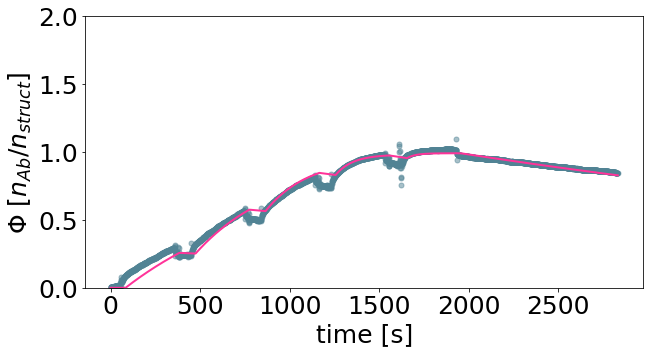

[4.09580718e-02 2.04298618e-04 1.09061195e+00]


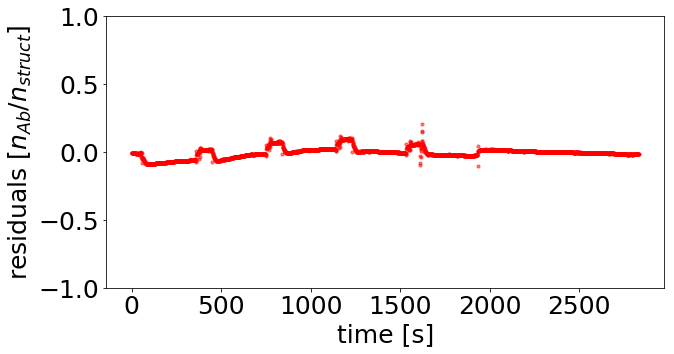

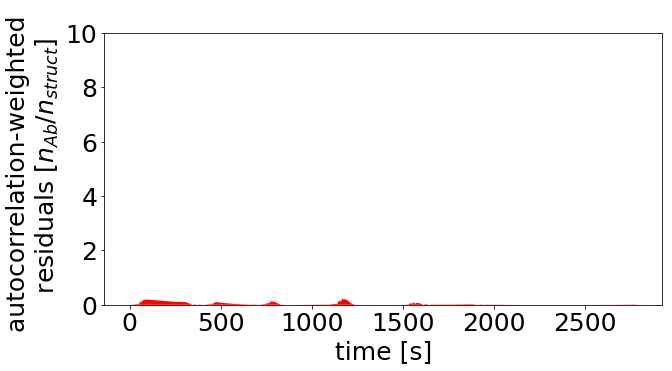

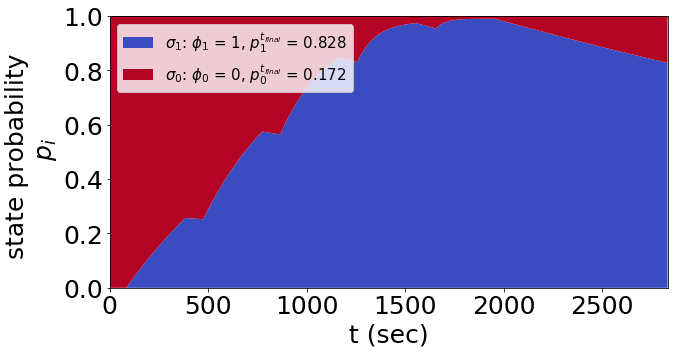

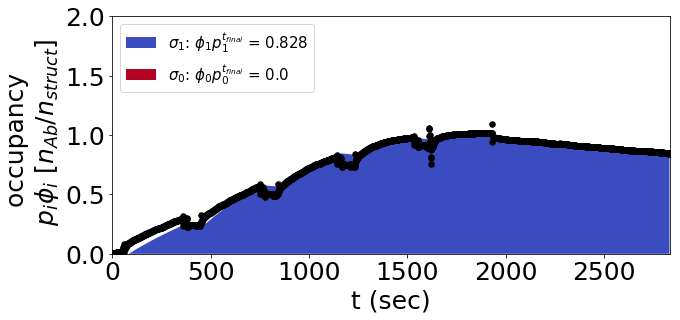

[array([-1.3876605 , -3.68973457,  0.03767025])]


<Figure size 360x144 with 0 Axes>

$${\huge K_{D1,fine}=4.987994053006717e-12M \huge}$$

('kon, koff:', 40958071.778968886, 0.00020429861845611903)


In [16]:
# change to the fine fitting routine - 2021
# input run is now already in antibody per structure units, taken from the average curves computed above
# already been through normalization process, no input structure data required
imp.reload(mk)
mono_data_source = "OUTPUT_rawsprplots_upper_68"
output_dir = master_name+"/output_monovalent_fine_fitting_upper68"
k_on_g, k_off_g = np.abs(k_on_gupper68), np.abs(k_off_gupper68)
origami_1 = mk.Fitting(run_list = np.array([[mono_data_source,"monovalent"]]), 
                       run_type = "mono",
                       mono_rates = np.array([k_on_g, k_off_g]),
                       KD_biv = None,
                       concentrations = concentrations,
                       time_points = time_points, 
                       scaling_constant = 1,
                      output_dir = output_dir,
                      struct_params = ['data_directory/mouseIgG_dig_MONO/',RstrRmax_slope, RstrRmax_interc],
                      data_dir ='data_directory/mouseIgG_dig_MONO/' )
origami_1.set_bounds(((-12,2),(-12,2),(np.log10(.8),np.log10(1.2))))
origami_1.print_graph = False
xopt_compilation = np.power(10,origami_1.fit_annealing())
k_on_upper68, k_off_upper68, norm1 = xopt_compilation[0][0], xopt_compilation[0][1], xopt_compilation[0][2]

KD1_upper68 = k_off_upper68 /(k_on_upper68*10**9) # M
# pkl.dump([xopt_compilation, 
#           k_on, k_off, norm1,origami_1 ,KD1         
#          ], open(master_name+'/pickle_directory/monovalent_fine_fitting_result.pickle', 'wb'))
plt.figure(figsize=(5,2))
plt.suptitle("${K_{D1,fine}=%.2e M}$"%KD1_upper68, fontsize=34)
plt.savefig(output_dir+"/KD1_value_fine.svg")
plt.show()
plt.close()
display(Markdown("$${\huge K_{D1,fine}="+str(KD1_upper68)+"M \huge}$$"))
print("kon, koff:",k_on_upper68*10**9, k_off_upper68)

## mono fine lower 95 run

('(fit_annealing) variable parameter: ', array([1.18592976e-02, 1.63521369e-07, 1.00000000e+00]), 'log10 variable parameter: ', array([-1.92594103, -6.78642548,  0.        ]))
basinhopping step 0: f 133.823
basinhopping step 1: f 133.823 trial_f 133.823 accepted 1  lowest_f 133.823
('OUTPUT_rawsprplots_lower_95', [-1.8398163797452407, -3.4907407370402734, -0.09691001300805639])


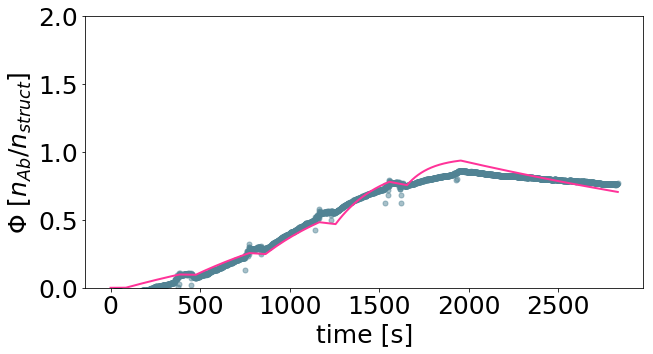

[1.44605103e-02 3.23042203e-04 8.00000000e-01]


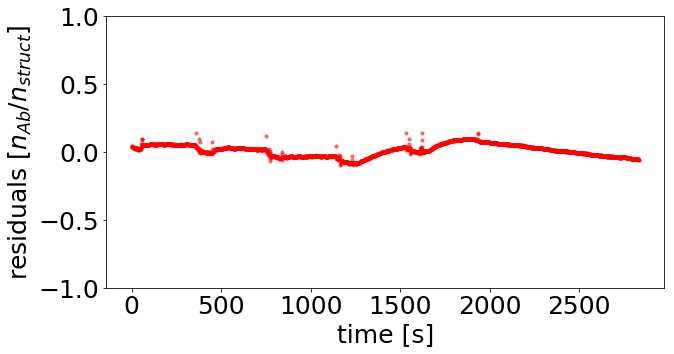

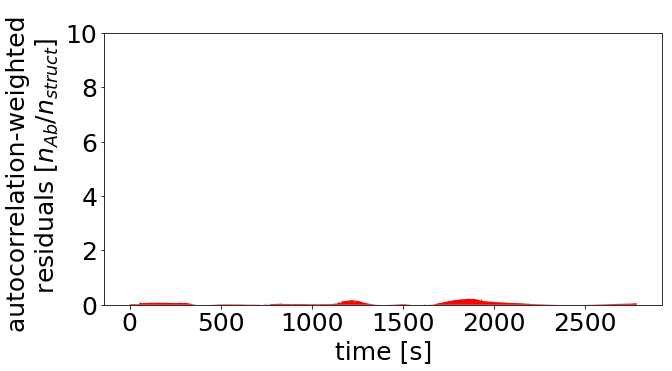

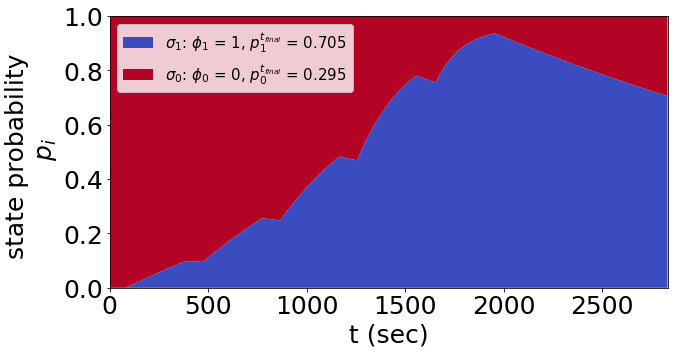

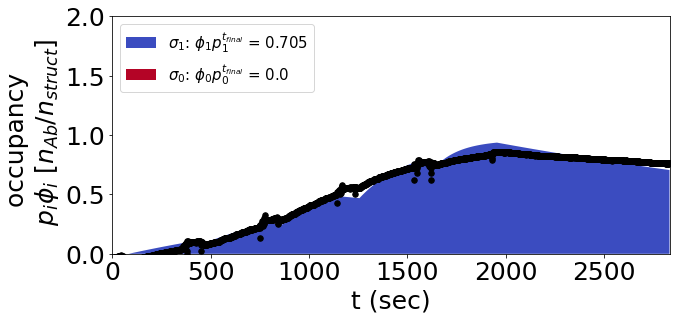

[array([-1.83981638, -3.49074074, -0.09691001])]


<Figure size 360x144 with 0 Axes>

$${\huge K_{D1,fine}=2.2339612863949992e-11M \huge}$$

('kon, koff:', 14460510.337165201, 0.00032304220274741754)


In [17]:
# change to the fine fitting routine - 2021
# input run is now already in antibody per structure units, taken from the average curves computed above
# already been through normalization process, no input structure data required
imp.reload(mk)
mono_data_source = "OUTPUT_rawsprplots_lower_95"
output_dir = master_name+"/output_monovalent_fine_fitting_lower95"
k_on_g, k_off_g = np.abs(k_on_glower95), np.abs(k_off_glower95)
origami_1 = mk.Fitting(run_list = np.array([[mono_data_source,"monovalent"]]), 
                       run_type = "mono",
                       mono_rates = np.array([k_on_g, k_off_g]),
                       KD_biv = None,
                       concentrations = concentrations,
                       time_points = time_points, 
                       scaling_constant = 1,
                      output_dir = output_dir,
                      struct_params = ['data_directory/mouseIgG_dig_MONO/',RstrRmax_slope, RstrRmax_interc],
                      data_dir ='data_directory/mouseIgG_dig_MONO/' )
origami_1.set_bounds(((-12,2),(-12,2),(np.log10(.8),np.log10(1.2))))
origami_1.print_graph = False
xopt_compilation = np.power(10,origami_1.fit_annealing())
k_on_lower95, k_off_lower95, norm1 = xopt_compilation[0][0], xopt_compilation[0][1], xopt_compilation[0][2]

KD1_lower95 = k_off_lower95 /(k_on_lower95*10**9) # M
# pkl.dump([xopt_compilation, 
#           k_on, k_off, norm1,origami_1 ,KD1         
#          ], open(master_name+'/pickle_directory/monovalent_fine_fitting_result.pickle', 'wb'))
plt.figure(figsize=(5,2))
plt.suptitle("${K_{D1,fine}=%.2e M}$"%KD1_lower95, fontsize=34)
plt.savefig(output_dir+"/KD1_value_fine.svg")
plt.show()
plt.close()
display(Markdown("$${\huge K_{D1,fine}="+str(KD1_lower95)+"M \huge}$$"))
print("kon, koff:",k_on_lower95*10**9, k_off_lower95)

## mono fine lower 68 run

('(fit_annealing) variable parameter: ', array([1.75229264e-02, 1.34988380e-07, 1.00000000e+00]), 'log10 variable parameter: ', array([-1.75639336, -6.86970361,  0.        ]))
basinhopping step 0: f 6.11307
basinhopping step 1: f 6.11307 trial_f 6.11307 accepted 1  lowest_f 6.11307
('OUTPUT_rawsprplots_lower_68', [-1.5913392833157662, -3.876156649763567, -0.09022680654096638])


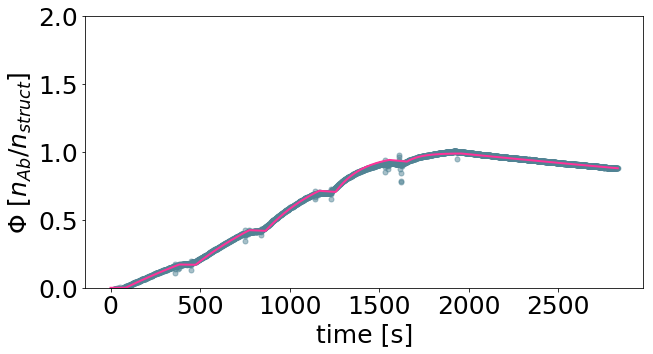

[2.56248137e-02 1.32997461e-04 8.12406133e-01]


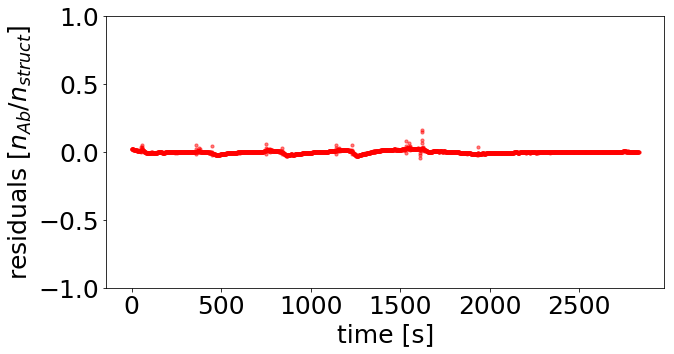

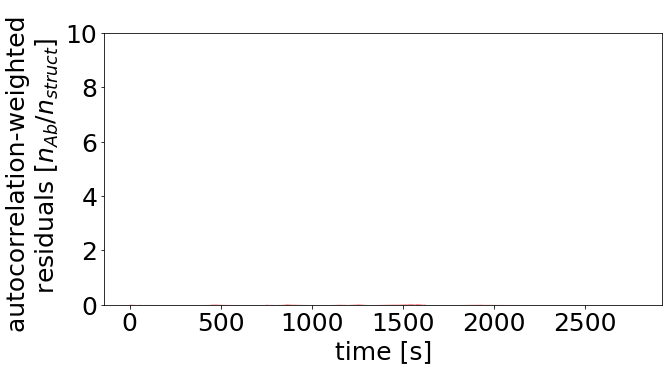

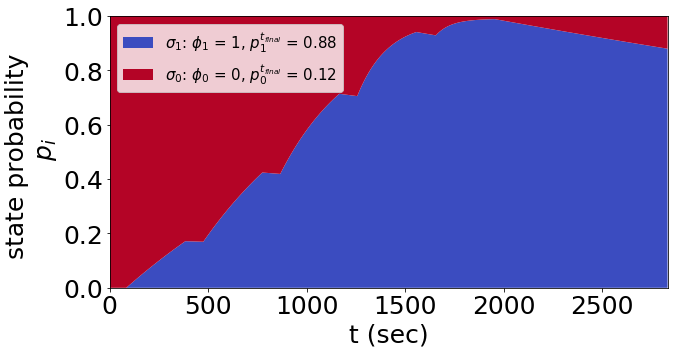

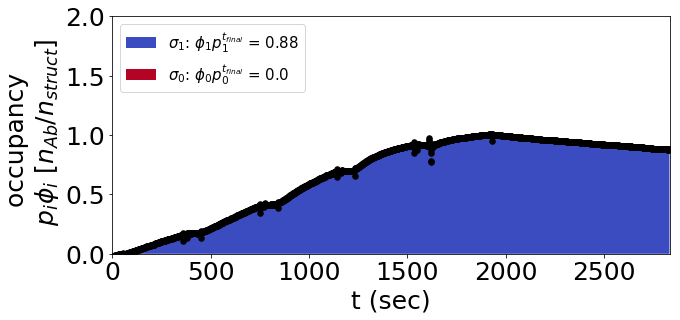

[array([-1.59133928, -3.87615665, -0.09022681])]


<Figure size 360x144 with 0 Axes>

$${\huge K_{D1,fine}=5.190182554234594e-12M \huge}$$

('kon, koff:', 25624813.703464065, 0.00013299746103923076)


In [18]:
# change to the fine fitting routine - 2021
# input run is now already in antibody per structure units, taken from the average curves computed above
# already been through normalization process, no input structure data required
imp.reload(mk)
mono_data_source = "OUTPUT_rawsprplots_lower_68"
output_dir = master_name+"/output_monovalent_fine_fitting_lower68"
k_on_g, k_off_g = np.abs(k_on_glower68), np.abs(k_off_glower68)
origami_1 = mk.Fitting(run_list = np.array([[mono_data_source,"monovalent"]]), 
                       run_type = "mono",
                       mono_rates = np.array([k_on_g, k_off_g]),
                       KD_biv = None,
                       concentrations = concentrations,
                       time_points = time_points, 
                       scaling_constant = 1,
                      output_dir = output_dir,
                      struct_params = ['data_directory/mouseIgG_dig_MONO/',RstrRmax_slope, RstrRmax_interc],
                      data_dir ='data_directory/mouseIgG_dig_MONO/' )
origami_1.set_bounds(((-12,2),(-12,2),(np.log10(.8),np.log10(1.2))))
origami_1.print_graph = False
xopt_compilation = np.power(10,origami_1.fit_annealing())
k_on_lower68, k_off_lower68, norm1 = xopt_compilation[0][0], xopt_compilation[0][1], xopt_compilation[0][2]

KD1_lower68 = k_off_lower68 /(k_on_lower68*10**9) # M
# pkl.dump([xopt_compilation, 
#           k_on, k_off, norm1,origami_1 ,KD1         
#          ], open(master_name+'/pickle_directory/monovalent_fine_fitting_result.pickle', 'wb'))
plt.figure(figsize=(5,2))
plt.suptitle("${K_{D1,fine}=%.2e M}$"%KD1_lower68, fontsize=34)
plt.savefig(output_dir+"/KD1_value_fine.svg")
plt.show()
plt.close()
display(Markdown("$${\huge K_{D1,fine}="+str(KD1_lower68)+"M \huge}$$"))
print("kon, koff:",k_on_lower68*10**9, k_off_lower68)

In [19]:
# import pickle as pkl
# xopt_compilation, \
#           k_on, k_off, norm1,origami_1,KD1 = \
#     pkl.load(open(master_name+'/pickle_directory/monovalent_fine_fitting_result.pickle', 'rb'))

[0.00142102 0.00084685 0.03916   ]

## bivalent fit - average KD1 bound

(0.001689336284608581, 0.000600366057061402, 17.904803732090443)

('(fit_annealing) variable parameter: ', array([ 1.        ,  1.        , 13.75285377]), 'log10 variable parameter: ', array([0.        , 0.        , 1.13839283]))
basinhopping step 0: f 66.1955
basinhopping step 1: f 66.1955 trial_f 66.1955 accepted 1  lowest_f 66.1955
('Dig_Mouse_14nm_repeat1', [1.151149418635251, -6.0, 1.1473775871896594])


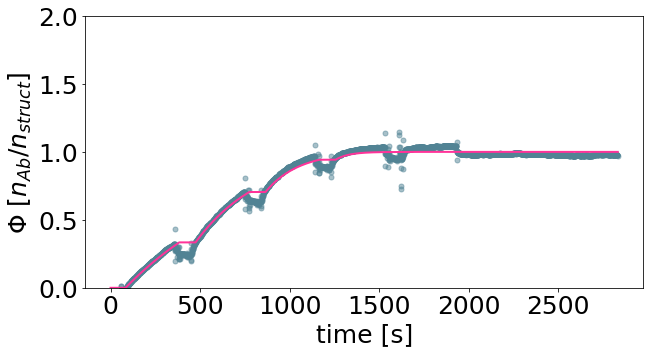

[1.41628097e+01 1.00000000e-06 1.40403388e+01]


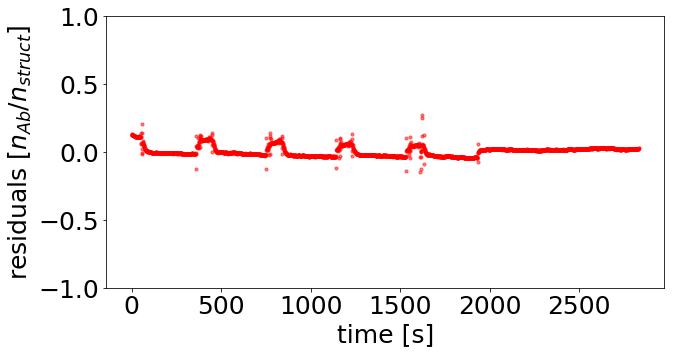

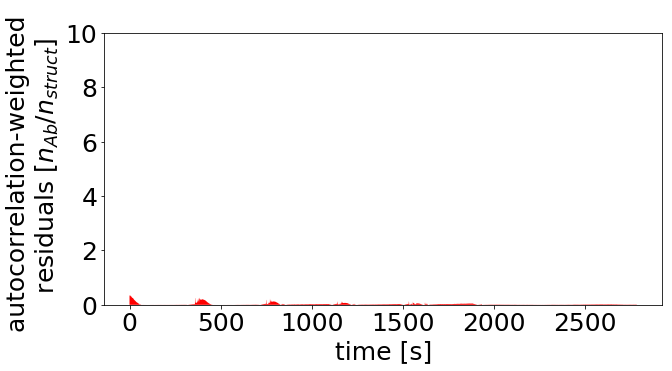

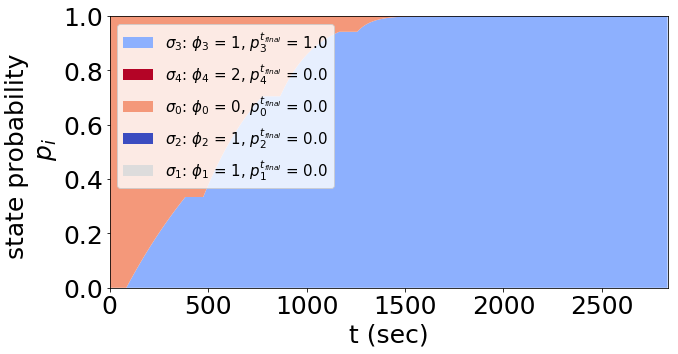

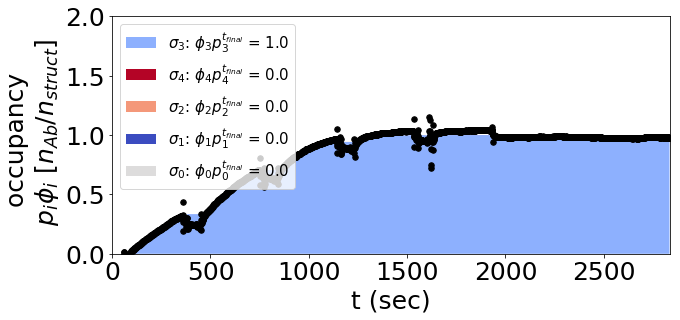

[array([ 1.15114942, -6.        ,  1.14737759])]


$${\large K_{D2}=7.060745881270019e-08\large}$$

$${\large K_{Dapp} = -1.0005602702474686e-16\large}$$

<Figure size 360x144 with 0 Axes>

In [20]:
imp.reload(mk)

output_dir = master_name+"/output_bivalent_fine_fitting_mean"
origami_2 = mk.Fitting(
    run_list = np.array([bivalent_data_source]), 
    run_type = "biv_3param", 
    mono_rates = np.array([k_on_mean, k_off_mean]),
    KD_biv = .01, 
    concentrations = concentrations, 
    time_points = time_points, 
    scaling_constant = None,
    output_dir = output_dir,
      struct_params = ['data_directory/Dig_distances_Mouse/',RstrRmax_slope, RstrRmax_interc],
      data_dir ='data_directory/Dig_distances_Mouse/' ,
    k_monobiv = 1,
    k_bivmono = 1,)
# origami_2.set_bounds(((-9,9),(np.log10(17),np.log10(20))))
origami_2.set_bounds(((-6,2),(-6,2),(np.log10(17),np.log10(20))))
origami_2.print_graph = False
xopt_compilation_2 = origami_2.fit_annealing()
xopt_pow = np.power(10,xopt_compilation_2)
# KD_biv, norm_2 = xopt_pow[0][0], xopt_pow[0][1]
# logKD_biv, lognorm_2 =xopt_compilation_2[0][0], xopt_compilation_2[0][1]
KD_biv, norm_2 = xopt_pow[0][1]/xopt_pow[0][0], xopt_pow[0][2]
logKD_biv, lognorm_2 =xopt_compilation_2[0][1]/xopt_compilation_2[0][0], xopt_compilation_2[0][1]

# pkl.dump([xopt_compilation_2, 
#           origami_2, KD_biv, norm_2, xopt_pow,  logKD_biv     , lognorm_2  
#          ], open(master_name+'/pickle_directory/bivalent_fitting_result.pickle', 'wb'))

Kdapp = apparent_KD(np.average(concentrations)*10**-9,KD1_mean, KD_biv)
display(Markdown("$${\large K_{D2}="+str(KD_biv)+"\large}$$"))
display(Markdown("$${\large K_{Dapp} = "+str(Kdapp)+"\large}$$"))

plt.figure(figsize=(5,2))
plt.suptitle("${K_{D2,fine}=%.2e M}$"%KD_biv, fontsize=34)
plt.savefig(output_dir+"/KD2_value_fine.svg")
plt.show()
plt.close()



## bivalent fit - upper68 KD1 bound

('(fit_annealing) variable parameter: ', array([ 1.        ,  1.        , 13.75285377]), 'log10 variable parameter: ', array([0.        , 0.        , 1.13839283]))
basinhopping step 0: f 277.399
basinhopping step 1: f 150.685 trial_f 150.685 accepted 1  lowest_f 150.685
found new global minimum on step 1 with function value 150.685
('Dig_Mouse_14nm_repeat1', [-2.670952796989335, -4.179036112885966, 0.989154826672131])


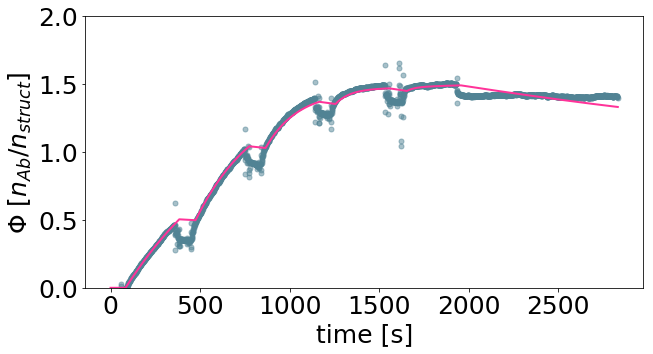

[2.13327676e-03 6.62161441e-05 9.75337285e+00]


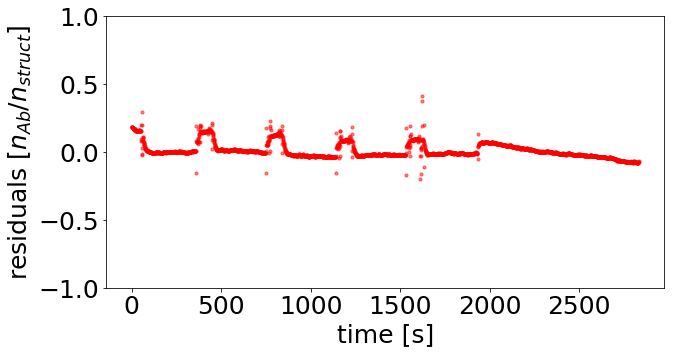

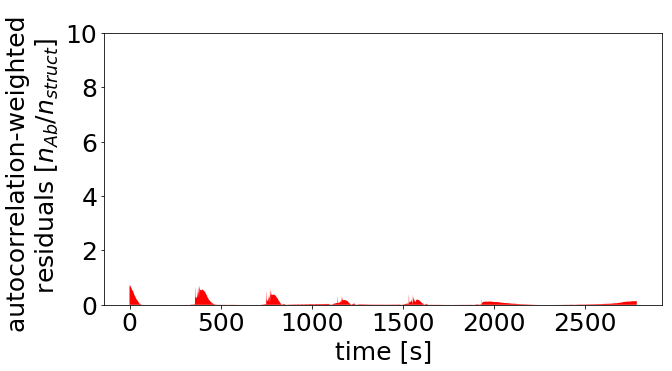

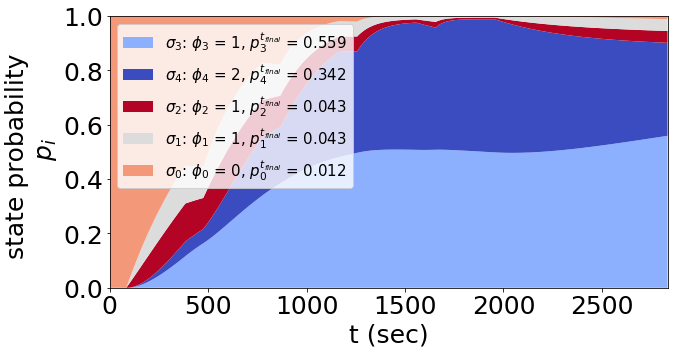

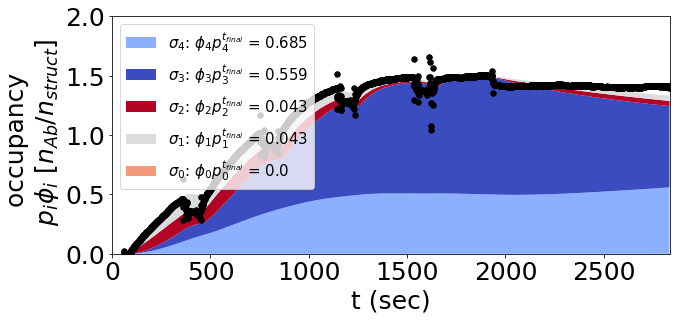

[array([-2.6709528 , -4.17903611,  0.98915483])]


$${\large K_{D2}=0.031039640605145934\large}$$

$${\large K_{Dapp} = -2.0794716310459077e-11\large}$$

<Figure size 360x144 with 0 Axes>

In [21]:
imp.reload(mk)
output_dir = master_name+"/output_bivalent_fine_fitting_upper68"
origami_2 = mk.Fitting(
    run_list = np.array([bivalent_data_source]), 
    run_type = "biv_3param", 
    mono_rates = np.array([k_on_upper68, k_off_upper68]),
    KD_biv = .01, 
    concentrations = concentrations, 
    time_points = time_points, 
    scaling_constant = None,
    output_dir = output_dir,
      struct_params = ['data_directory/Dig_distances_Mouse/',RstrRmax_slope, RstrRmax_interc],
      data_dir ='data_directory/Dig_distances_Mouse/' ,
    k_monobiv = 1,
    k_bivmono = 1,)
# origami_2.set_bounds(((-9,9),(np.log10(17),np.log10(20))))
origami_2.set_bounds(((-6,2),(-6,2),(np.log10(17),np.log10(20))))
origami_2.print_graph = False
xopt_compilation_2 = origami_2.fit_annealing()
xopt_pow = np.power(10,xopt_compilation_2)
# KD_biv, norm_2 = xopt_pow[0][0], xopt_pow[0][1]
# logKD_biv, lognorm_2 =xopt_compilation_2[0][0], xopt_compilation_2[0][1]
KD_biv, norm_2 = xopt_pow[0][1]/xopt_pow[0][0], xopt_pow[0][2]
logKD_biv, lognorm_2 =xopt_compilation_2[0][1]/xopt_compilation_2[0][0], xopt_compilation_2[0][1]

# pkl.dump([xopt_compilation_2, 
#           origami_2, KD_biv, norm_2, xopt_pow,  logKD_biv     , lognorm_2  
#          ], open(master_name+'/pickle_directory/bivalent_fitting_result.pickle', 'wb'))

Kdapp = apparent_KD(np.average(concentrations)*10**-9,KD1_upper68, KD_biv)
display(Markdown("$${\large K_{D2}="+str(KD_biv)+"\large}$$"))
display(Markdown("$${\large K_{Dapp} = "+str(Kdapp)+"\large}$$"))
plt.figure(figsize=(5,2))
plt.suptitle("${K_{D2,fine}=%.2e M}$"%KD_biv, fontsize=34)
plt.savefig(output_dir+"/KD2_value_fine.svg")
plt.show()
plt.close()

## bivalent fit - lower68 KD1

('(fit_annealing) variable parameter: ', array([ 1.        ,  1.        , 13.75285377]), 'log10 variable parameter: ', array([0.        , 0.        , 1.13839283]))
basinhopping step 0: f 71.4237
basinhopping step 1: f 71.4239 trial_f 71.4239 accepted 1  lowest_f 71.4237
('Dig_Mouse_14nm_repeat1', [0.5544991929761895, -6.0, 1.1496056985661665])


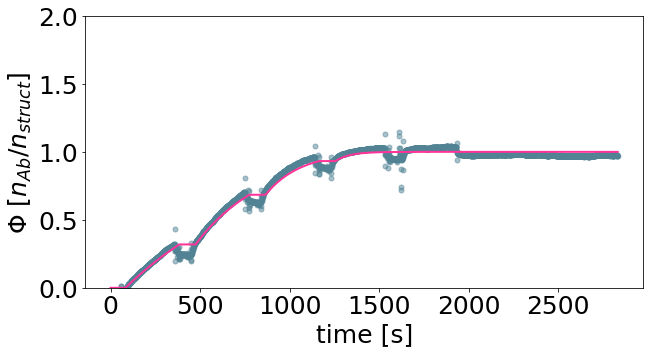

[3.58508282e+00 1.00000000e-06 1.41125567e+01]


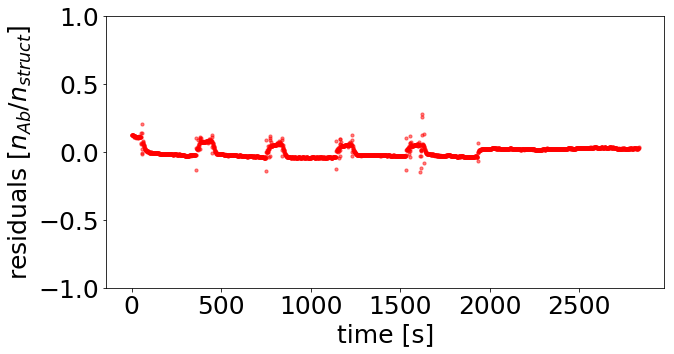

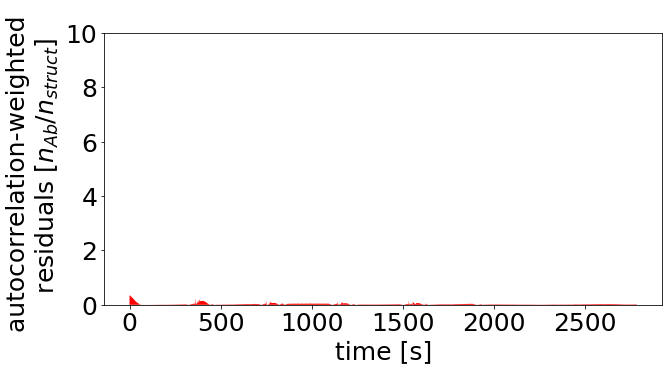

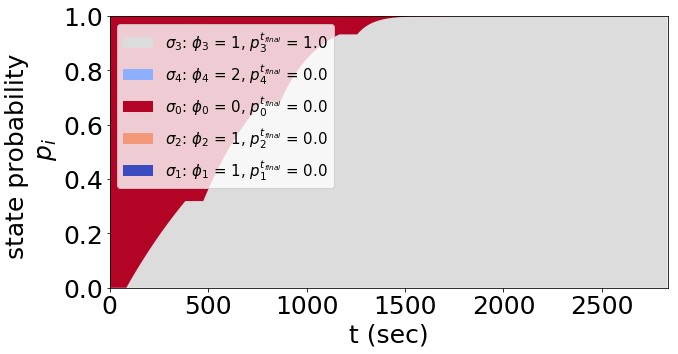

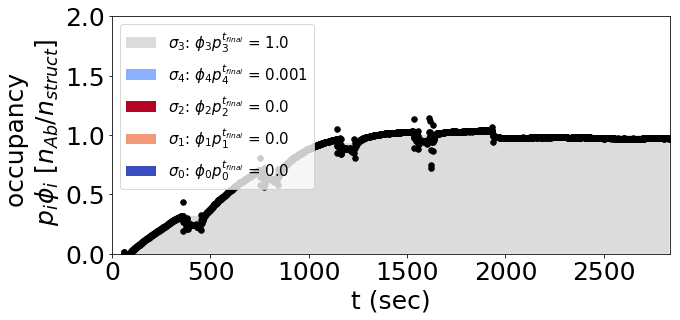

[array([ 0.55449919, -6.        ,  1.1496057 ])]


$${\large K_{D2}=2.7893358395933744e-07\large}$$

$${\large K_{Dapp} = -3.785772393183914e-16\large}$$

<Figure size 360x144 with 0 Axes>

In [22]:
imp.reload(mk)

output_dir = master_name+"/output_bivalent_fine_fitting_lower68"
origami_2 = mk.Fitting(
    run_list = np.array([bivalent_data_source]), 
    run_type = "biv_3param", 
    mono_rates = np.array([k_on_lower68, k_off_lower68]),
    KD_biv = .01, 
    concentrations = concentrations, 
    time_points = time_points, 
    scaling_constant = None,
    output_dir = output_dir,
      struct_params = ['data_directory/Dig_distances_Mouse/',RstrRmax_slope, RstrRmax_interc],
      data_dir ='data_directory/Dig_distances_Mouse/' ,
    k_monobiv = 1,
    k_bivmono = 1,)
# origami_2.set_bounds(((-9,9),(np.log10(17),np.log10(20))))
origami_2.set_bounds(((-6,2),(-6,2),(np.log10(17),np.log10(20))))
origami_2.print_graph = False
xopt_compilation_2 = origami_2.fit_annealing()
xopt_pow = np.power(10,xopt_compilation_2)
# KD_biv, norm_2 = xopt_pow[0][0], xopt_pow[0][1]
# logKD_biv, lognorm_2 =xopt_compilation_2[0][0], xopt_compilation_2[0][1]
KD_biv, norm_2 = xopt_pow[0][1]/xopt_pow[0][0], xopt_pow[0][2]
logKD_biv, lognorm_2 =xopt_compilation_2[0][1]/xopt_compilation_2[0][0], xopt_compilation_2[0][1]

# pkl.dump([xopt_compilation_2, 
#           origami_2, KD_biv, norm_2, xopt_pow,  logKD_biv     , lognorm_2  
#          ], open(master_name+'/pickle_directory/bivalent_fitting_result.pickle', 'wb'))

Kdapp = apparent_KD(np.average(concentrations)*10**-9,KD1_lower68, KD_biv)
display(Markdown("$${\large K_{D2}="+str(KD_biv)+"\large}$$"))
display(Markdown("$${\large K_{Dapp} = "+str(Kdapp)+"\large}$$"))
plt.figure(figsize=(5,2))
plt.suptitle("${K_{D2,fine}=%.2e M}$"%KD_biv, fontsize=34)
plt.savefig(output_dir+"/KD2_value_fine.svg")
plt.show()
plt.close()


In [23]:
# # import pickle as pkl
# xopt_compilation_2, origami_2, KD_biv, norm_2, xopt_pow,  logKD_biv, lognorm_2 = \
#     pkl.load(open(master_name+'/pickle_directory/bivalent_fitting_result.pickle', 'rb'))

# Alpha function fitting - with K_D - based on mean KD1

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.37636521e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.13873369]))
basinhopping step 0: f 60.7647
basinhopping step 1: f 60.7647 trial_f 60.7647 accepted 1  lowest_f 60.7647
('Dig_Mouse_3nm_repeat2', [-2.950198798644576, 1.1614729024768244])


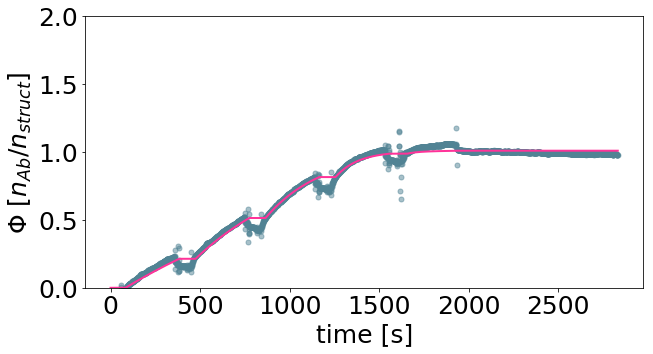

[1.12150497e-03 1.45035028e+01]


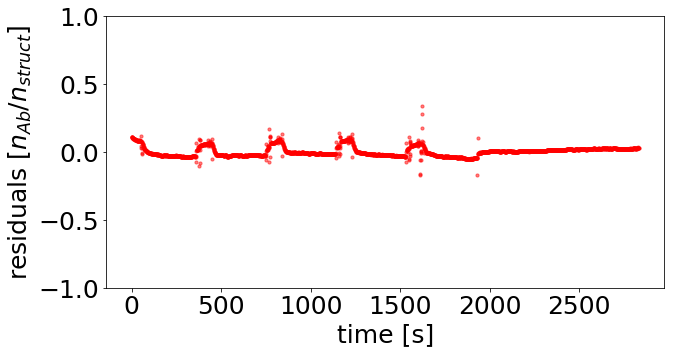

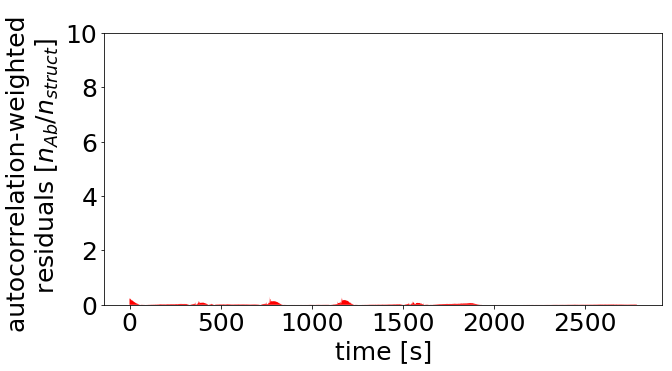

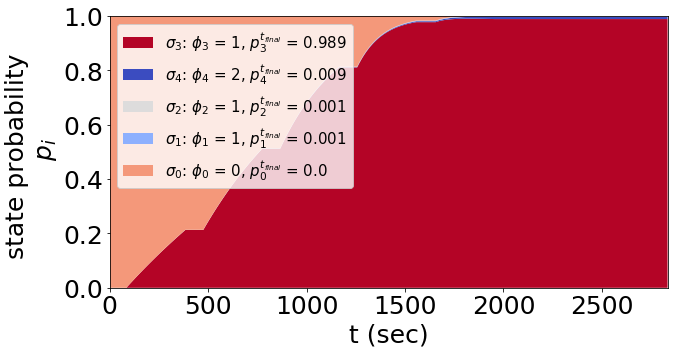

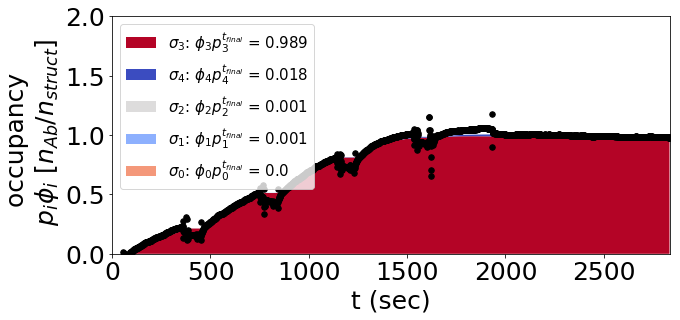

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.52029428e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.18192766]))
basinhopping step 0: f 60.2808
basinhopping step 1: f 60.2808 trial_f 60.2808 accepted 1  lowest_f 60.2808
('Dig_Mouse_7nm_repeat1', [-2.605817085078944, 1.2244464637394579])


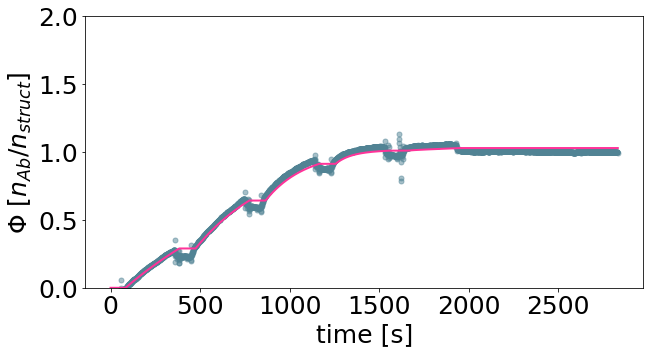

[2.47846571e-03 1.67666564e+01]


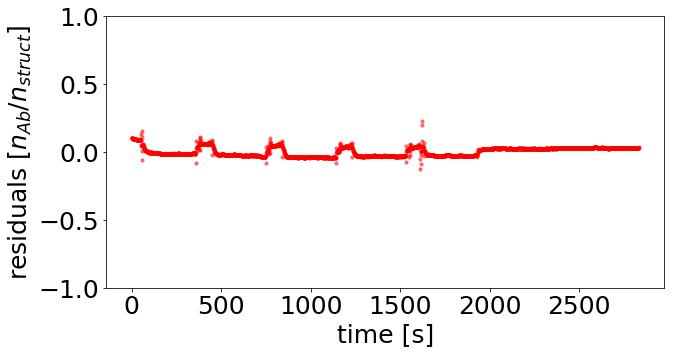

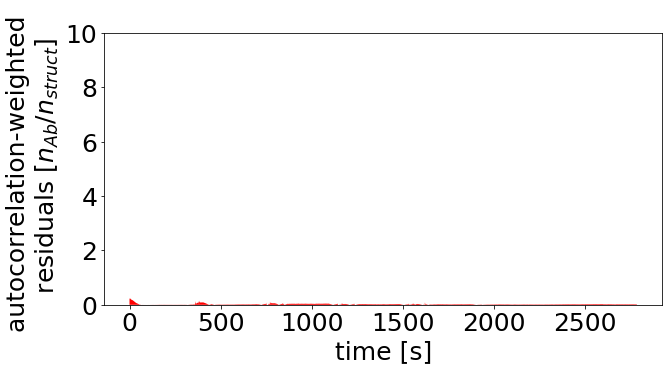

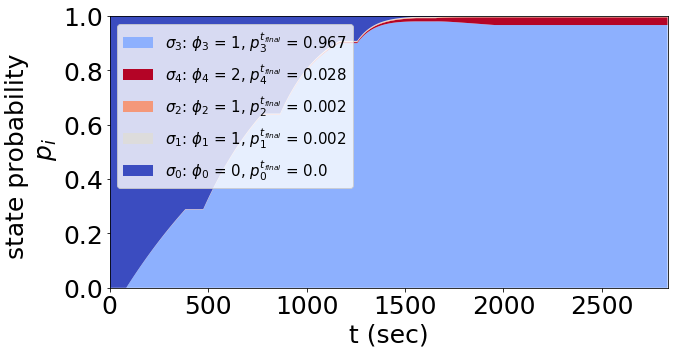

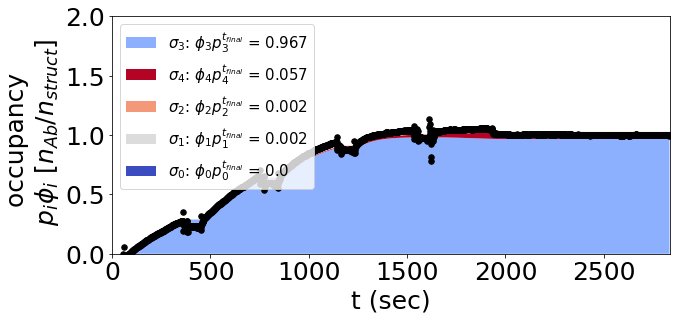

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.49333610e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.17415756]))
basinhopping step 0: f 95.4708
basinhopping step 1: f 95.4708 trial_f 95.4708 accepted 1  lowest_f 95.4708
('Dig_Mouse_7nm_repeat2', [-2.5860452984482754, 1.2049413551745165])


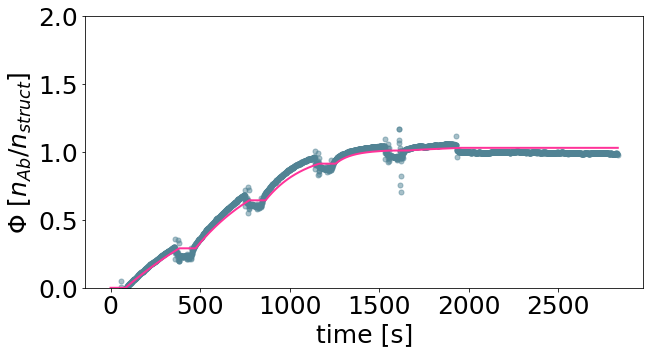

[2.59390879e-03 1.60302891e+01]


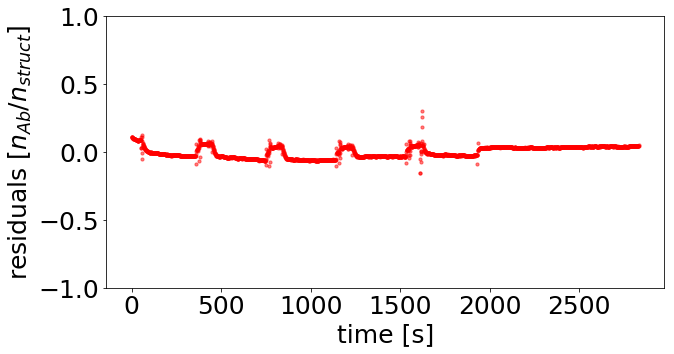

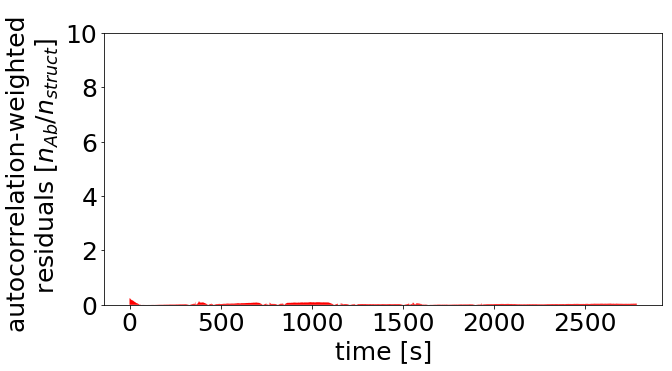

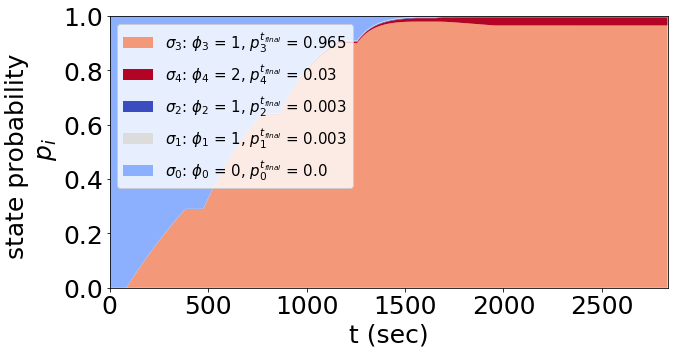

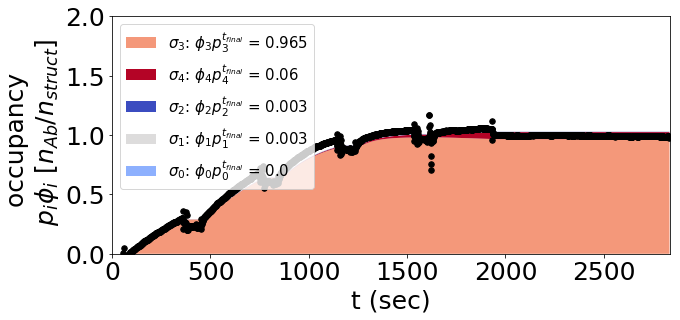

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.37528538e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.13839283]))
basinhopping step 0: f 156.186
basinhopping step 1: f 156.186 trial_f 156.186 accepted 1  lowest_f 156.186
found new global minimum on step 1 with function value 156.186
('Dig_Mouse_14nm_repeat1', [-2.577702832107189, 1.1464493365008566])


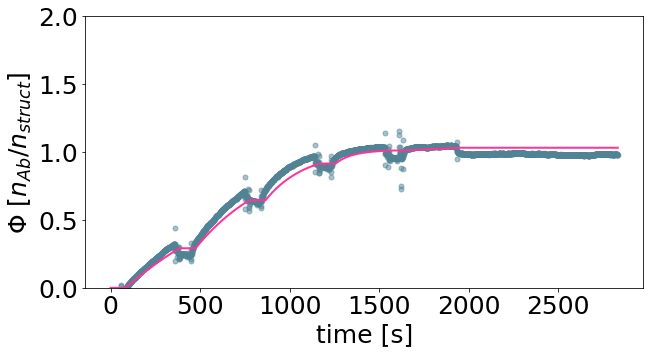

[2.64421746e-03 1.40103613e+01]


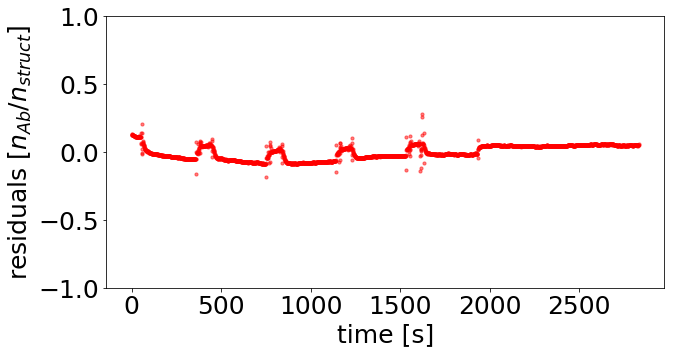

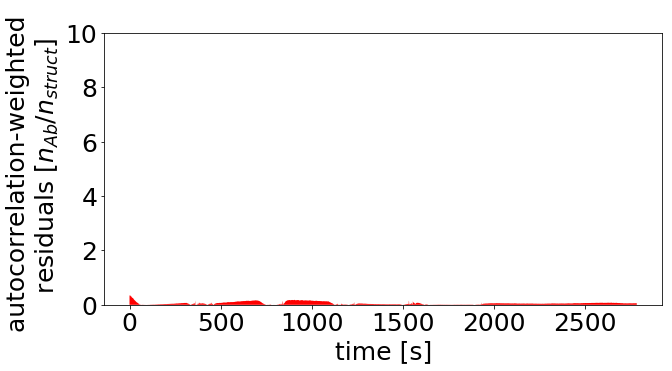

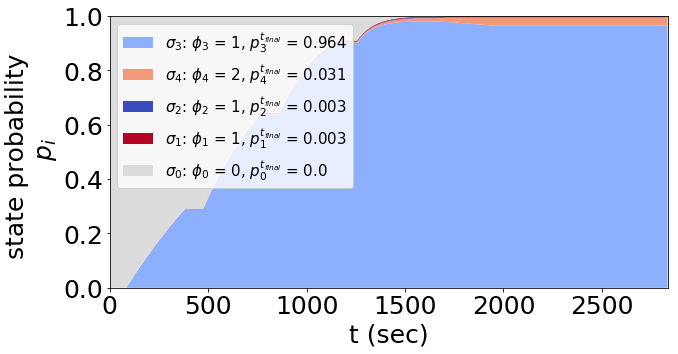

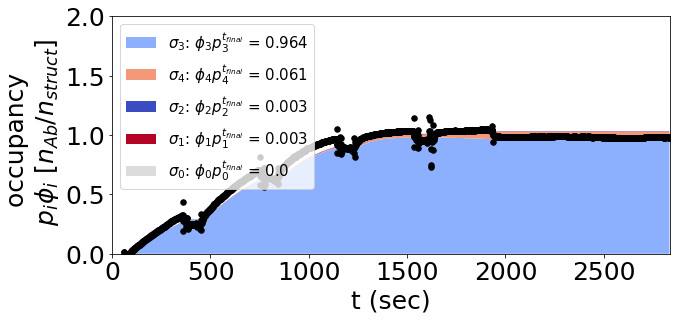

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.38386170e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.14109269]))
basinhopping step 0: f 191.947
basinhopping step 1: f 191.947 trial_f 191.947 accepted 1  lowest_f 191.947
('Dig_Mouse_14nm_repeat2', [-2.542991093616229, 1.2279970941225538])


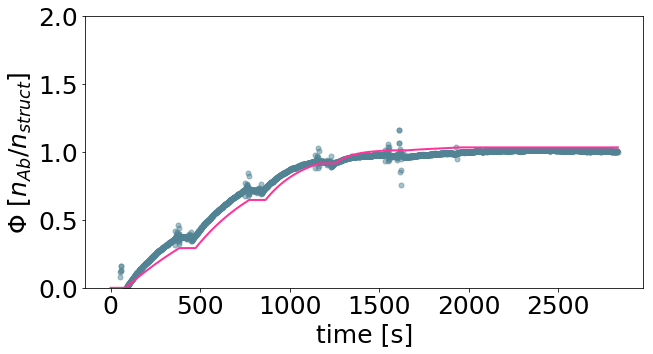

[2.86423671e-03 1.69042962e+01]


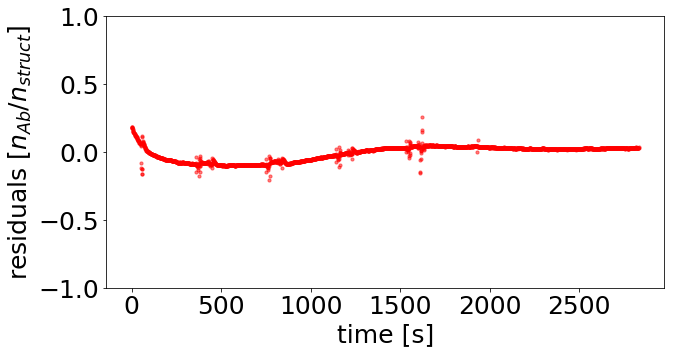

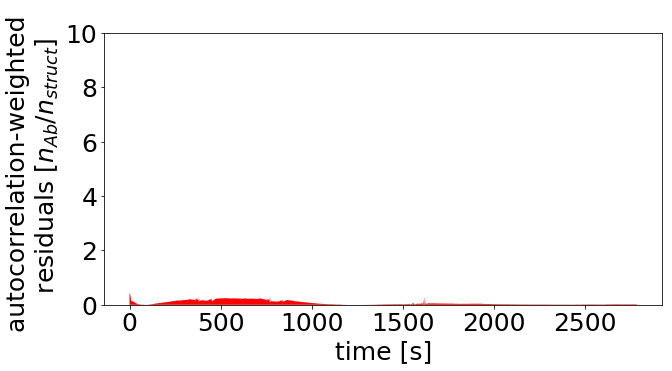

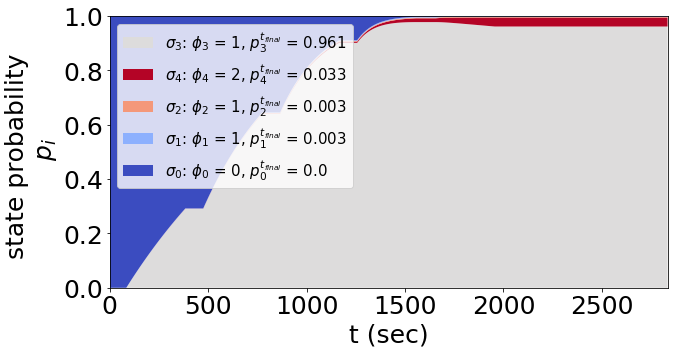

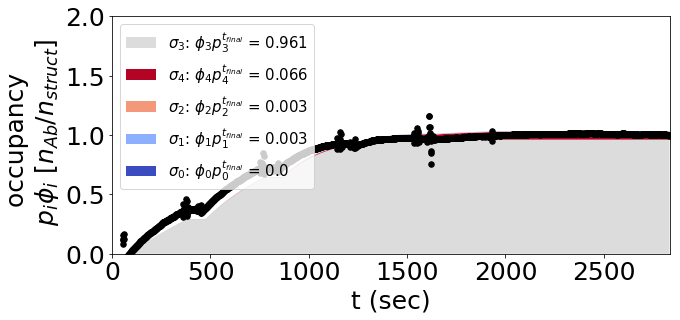

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.34248394e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.1279091 ]))
basinhopping step 0: f 151.887
basinhopping step 1: f 151.887 trial_f 151.887 accepted 1  lowest_f 151.887
('Dig_Mouse_16nm_repeat2', [-2.57040605129722, 1.139747557405117])


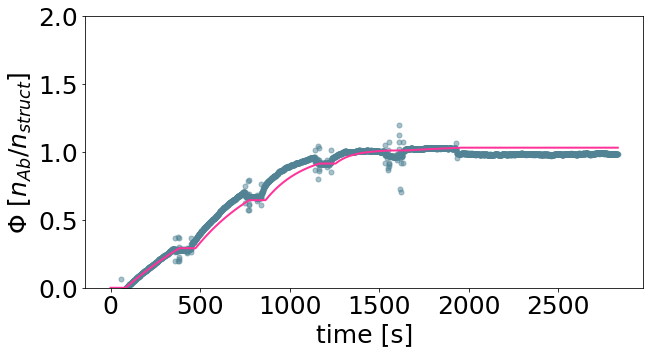

[2.68901948e-03 1.37958212e+01]


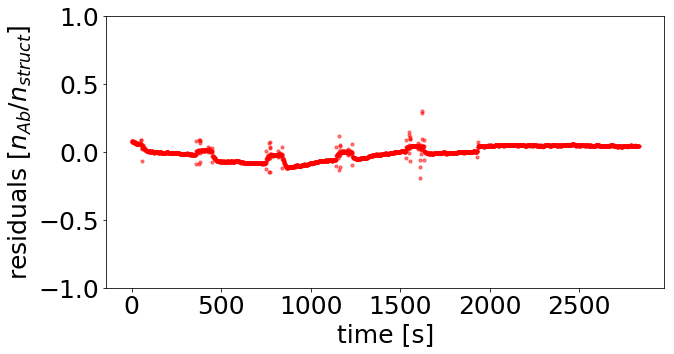

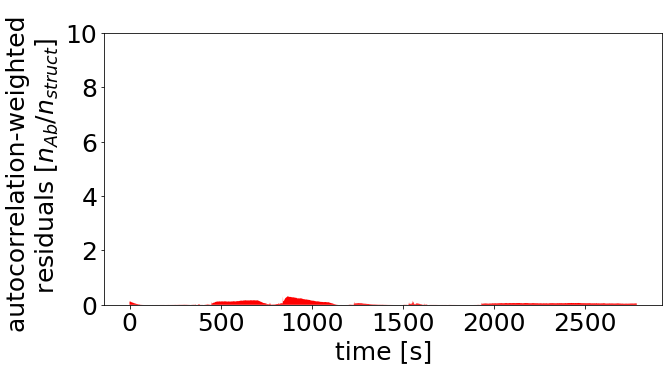

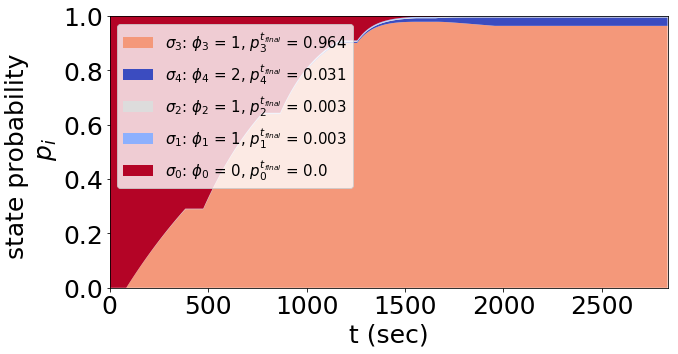

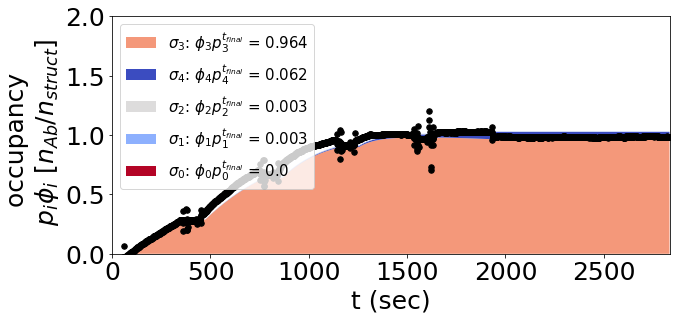

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.48746407e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.17244648]))
basinhopping step 0: f 70.3755
basinhopping step 1: f 70.3755 trial_f 70.3755 accepted 1  lowest_f 70.3755
('Dig_Mouse_17nm_repeat1', [-2.933163220769358, 1.1039069557797347])


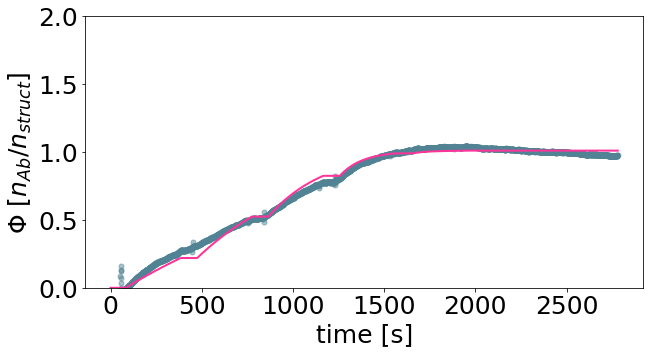

[1.16637118e-03 1.27030192e+01]


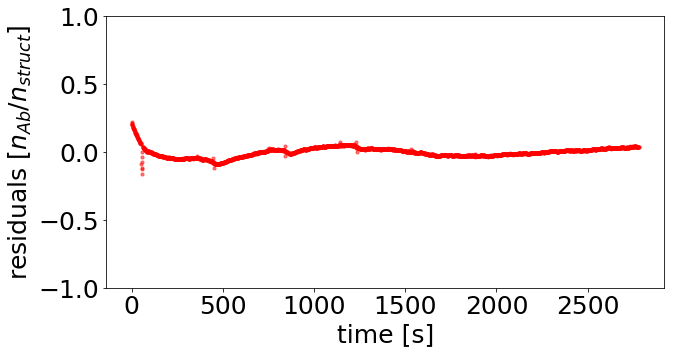

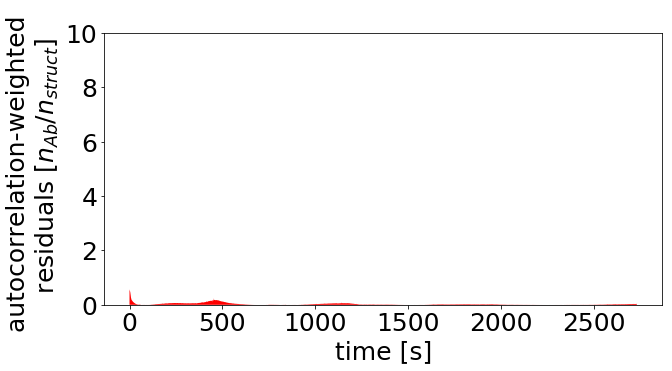

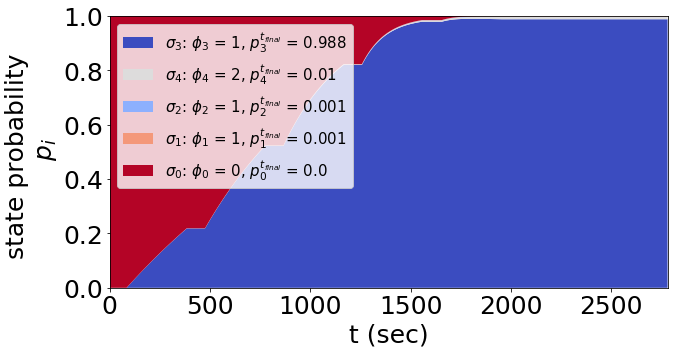

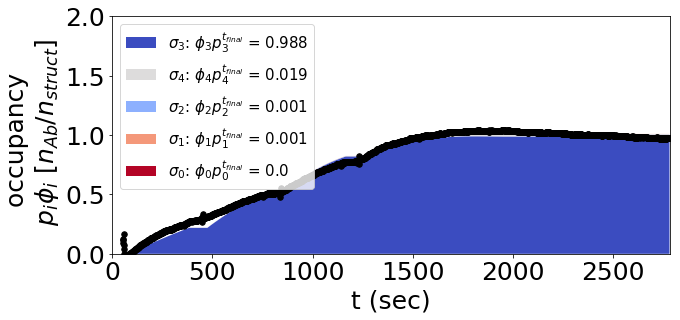

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.45126357e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.16174629]))
basinhopping step 0: f 84.1432
basinhopping step 1: f 84.1432 trial_f 84.1432 accepted 1  lowest_f 84.1432
('Dig_Mouse_17nm_repeat2', [-2.900506776441698, 1.0980196107532838])


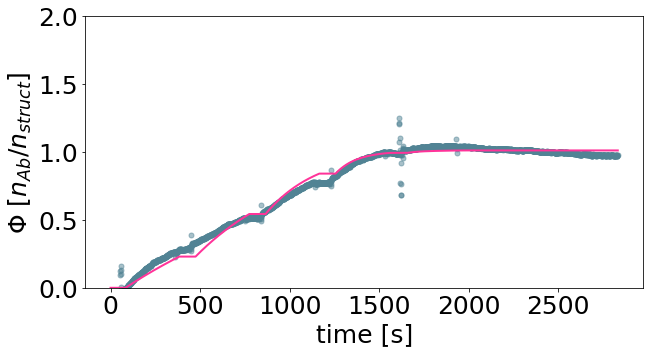

[1.25745723e-03 1.25319776e+01]


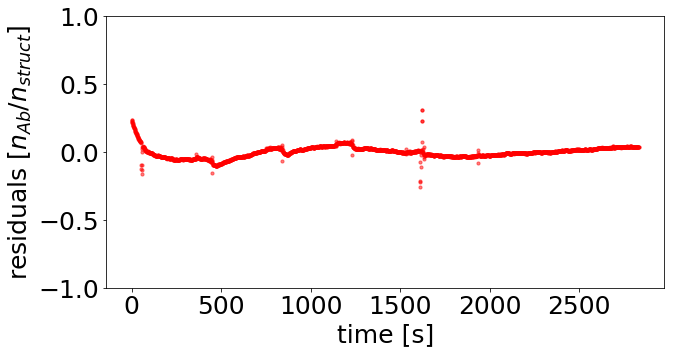

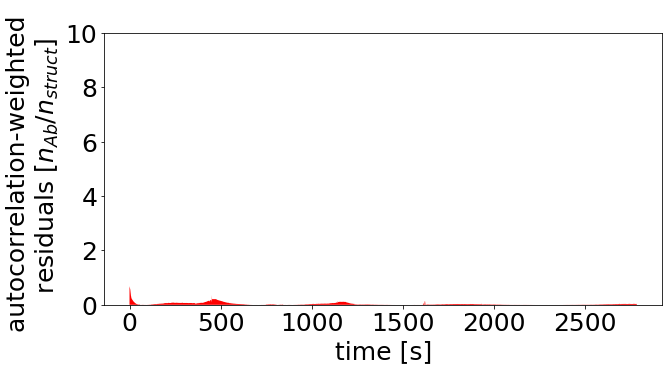

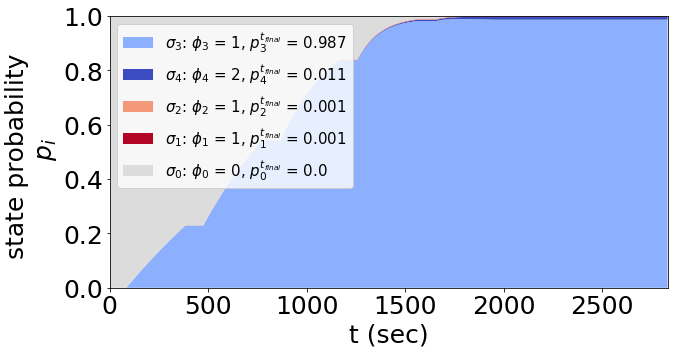

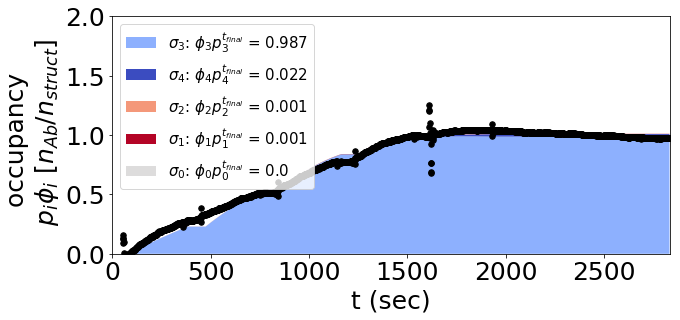

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.75956961e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.24540645]))
basinhopping step 0: f 375.558
basinhopping step 1: f 375.558 trial_f 375.558 accepted 1  lowest_f 375.558
found new global minimum on step 1 with function value 375.558
('Dig_Mouse_21nm_repeat1', [-1.3637169794049917, 1.264896840031711])


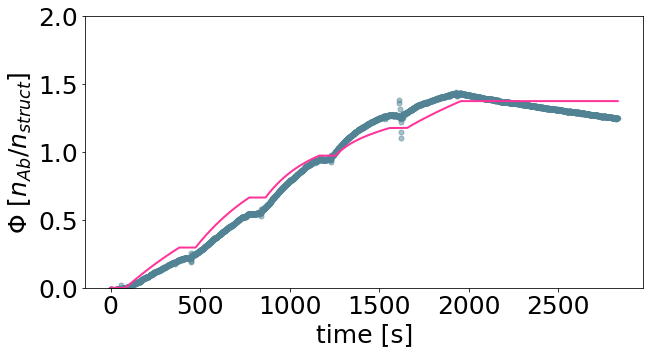

[ 0.04327958 18.40334806]


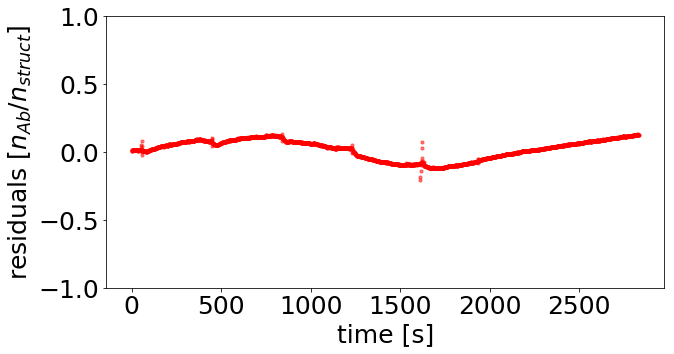

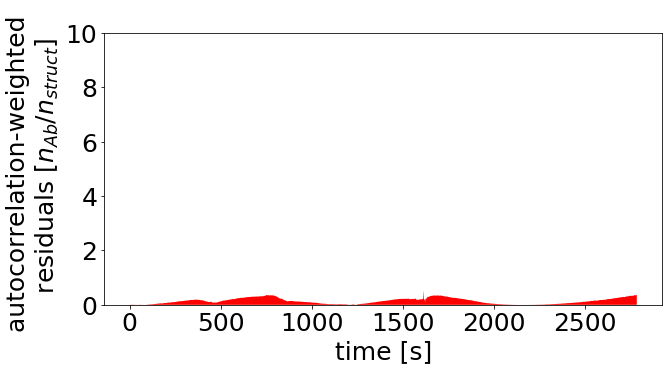

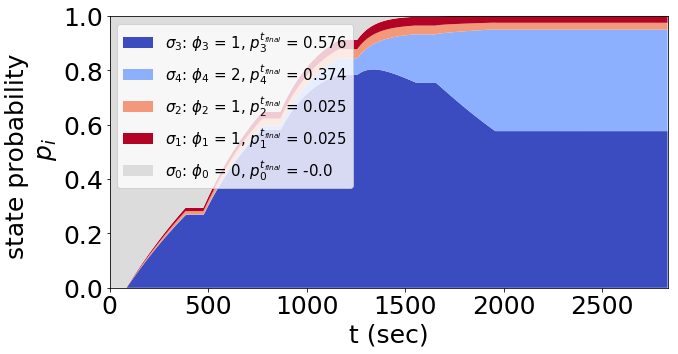

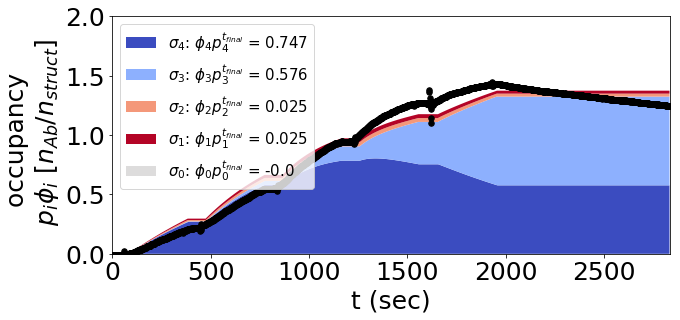

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.43169679e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.15585105]))
basinhopping step 0: f 275.139
basinhopping step 1: f 275.139 trial_f 275.139 accepted 1  lowest_f 275.139
found new global minimum on step 1 with function value 275.139
('Dig_Mouse_21nm_repeat2', [-1.2714448845652144, 1.2647819691198974])


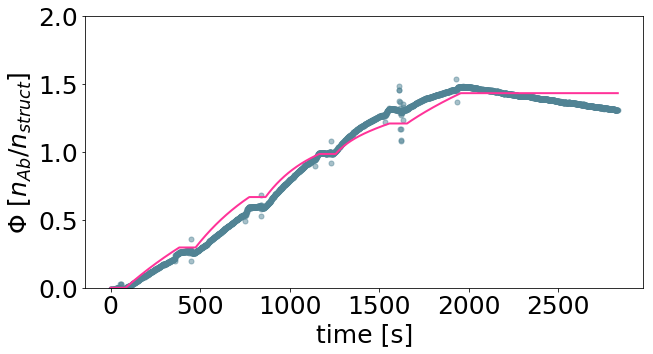

[ 0.05352481 18.39848102]


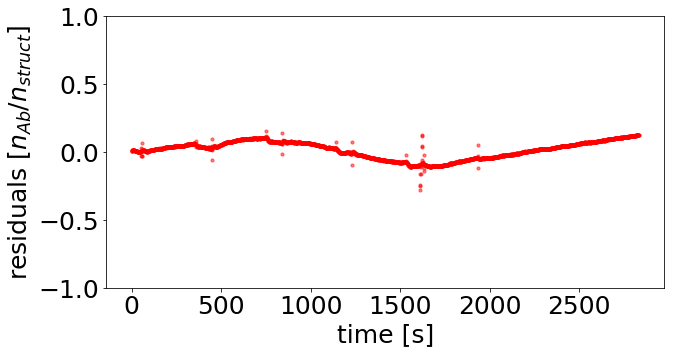

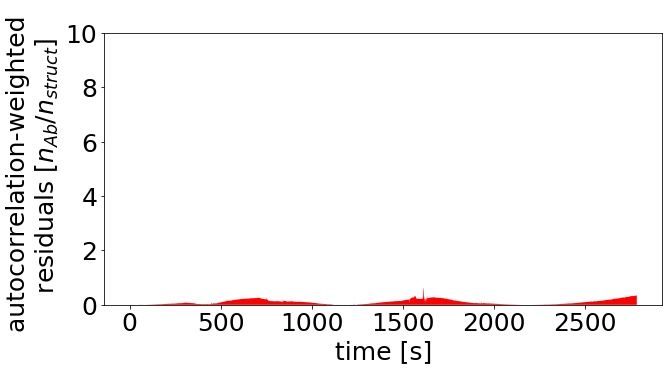

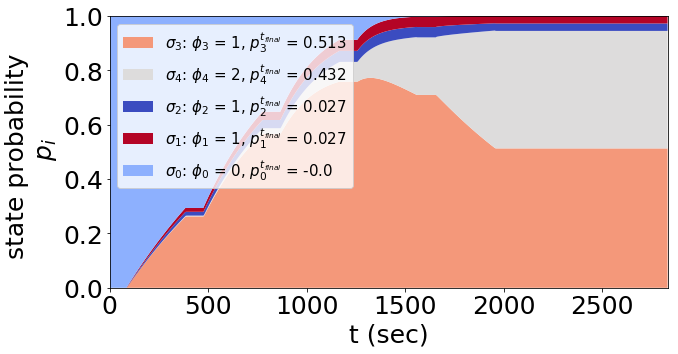

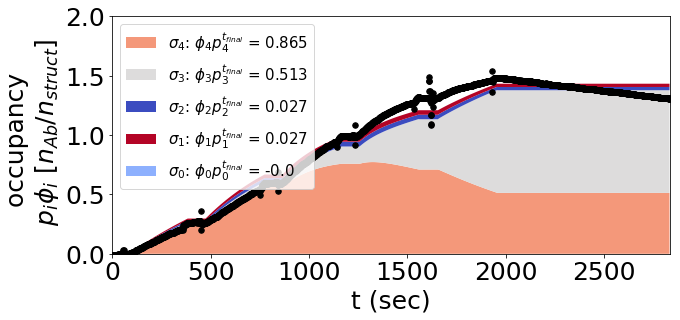

[array([-2.9501988,  1.1614729]), array([-2.60581709,  1.22444646]), array([-2.5860453 ,  1.20494136]), array([-2.57770283,  1.14644934]), array([-2.54299109,  1.22799709]), array([-2.57040605,  1.13974756]), array([-2.93316322,  1.10390696]), array([-2.90050678,  1.09801961]), array([-1.36371698,  1.26489684]), array([-1.27144488,  1.26478197])]
xopt_compilation for monobiv, bivmono, norm_const is:
[array([-2.9501988,  1.1614729]), array([-2.60581709,  1.22444646]), array([-2.5860453 ,  1.20494136]), array([-2.57770283,  1.14644934]), array([-2.54299109,  1.22799709]), array([-2.57040605,  1.13974756]), array([-2.93316322,  1.10390696]), array([-2.90050678,  1.09801961]), array([-1.36371698,  1.26489684]), array([-1.27144488,  1.26478197])]


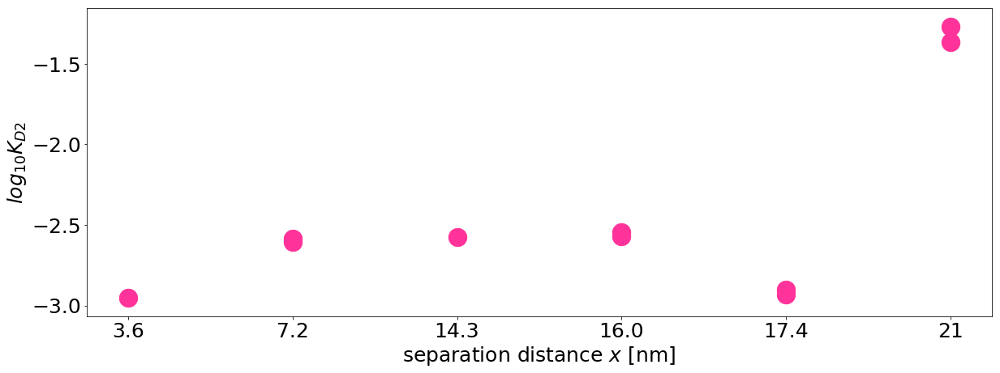

In [24]:

imp.reload(mk)

output_directory = master_name+"/output_spat_tol_function_fitting_mean"
if not os.path.exists(output_directory):
            os.makedirs(output_directory)

origami_alpha = mk.Fitting(
    run_list = run_list_biv, 
    run_type = "biv", 
    mono_rates =  np.array([k_on_gmean, k_off_gmean]),
    KD_biv = KD_biv,
    concentrations = concentrations, 
    time_points = time_points, 
    scaling_constant = None, #18.31222
    output_dir = output_directory,
      struct_params = ['data_directory/Dig_distances_Mouse/',RstrRmax_slope, RstrRmax_interc],
      data_dir ='data_directory/Dig_distances_Mouse/' )
origami_alpha.set_bounds(((-3,3),(np.log10(18.31222-10),np.log10(18.31222+10))))
xopt_compilation_mean = origami_alpha.fit_annealing(fitting_number = len(run_list_biv))
print("xopt_compilation for monobiv, bivmono, norm_const is:")
print(xopt_compilation_mean)


plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25) 
plt.rcParams.update({'font.size': 25})
plt.figure(figsize=(20,7))
plt.scatter(run_list_biv.T[2], np.array(xopt_compilation_mean).T[0], alpha = 1, s = 500,c="#ff3399")
plt.ylabel("$log_{10}K_{D2}$")
plt.xlabel("separation distance $x$ [nm]")
plt.savefig(output_directory+"/ spat_tol_function_fitting.svg")
plt.show()
plt.close()


# pkl.dump([origami_alpha,  xopt_compilation_mean,output_directory
#          ], open(master_name+'/pickle_directory/spat_tol_function_fitting.pickle', 'wb'))

In [25]:
# import pickle as pkl

# origami_alpha,  xopt_compilation_2, output_directory = \
#     pkl.load(open(master_name+'/pickle_directory/spat_tol_function_fitting.pickle', 'rb'))

# Alpha function fitting - with K_D - based on upper 95 KD1

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.37636521e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.13873369]))
basinhopping step 0: f 238.561
basinhopping step 1: f 238.561 trial_f 238.561 accepted 1  lowest_f 238.561
found new global minimum on step 1 with function value 238.561
('Dig_Mouse_3nm_repeat2', [-3.0, 1.146325953281558])


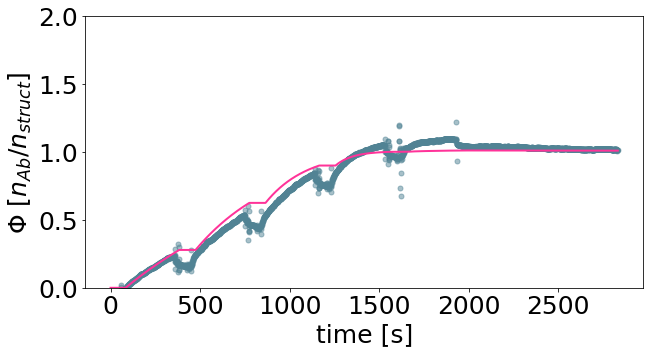

[1.00000000e-03 1.40063816e+01]


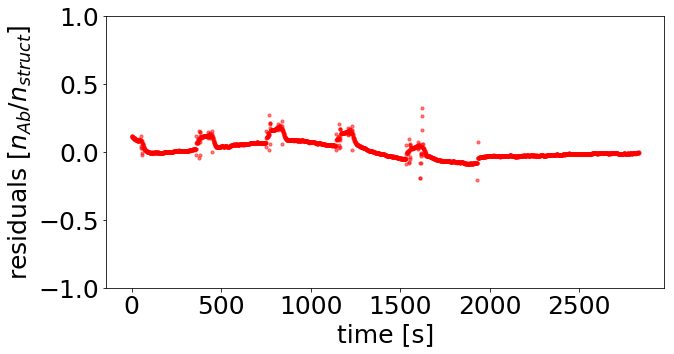

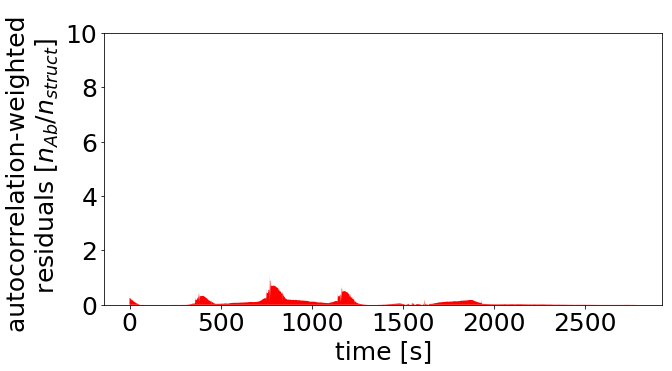

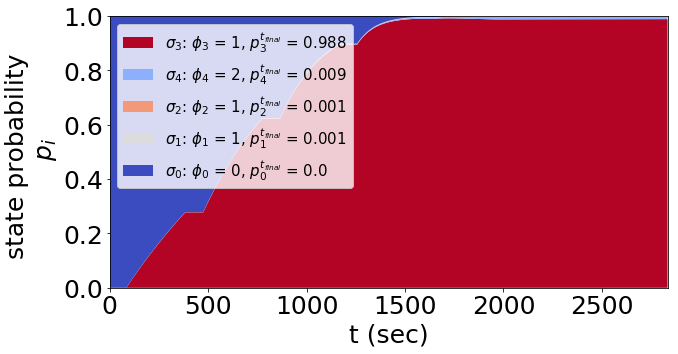

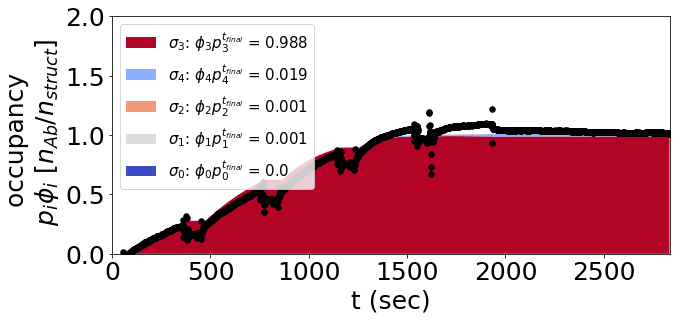

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.52029428e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.18192766]))
basinhopping step 0: f 46.2479
basinhopping step 1: f 46.2479 trial_f 46.2479 accepted 1  lowest_f 46.2479
('Dig_Mouse_7nm_repeat1', [-2.9543062172974097, 1.2273875555337532])


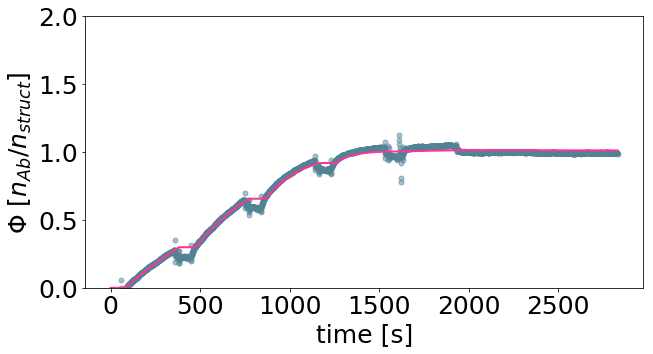

[1.11094813e-03 1.68805874e+01]


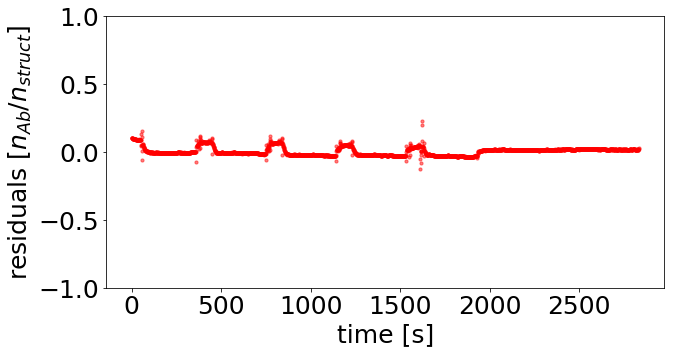

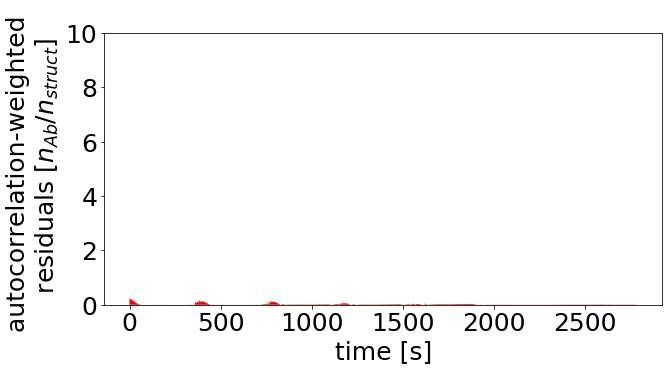

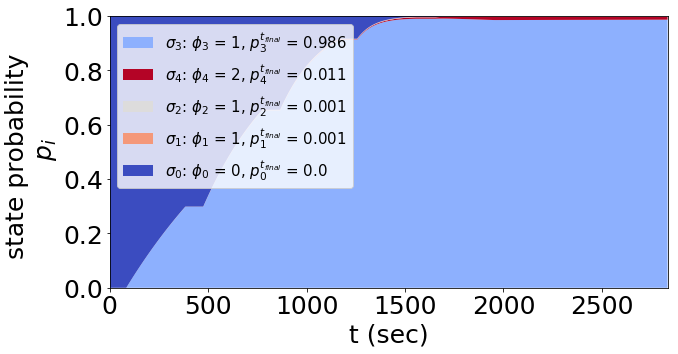

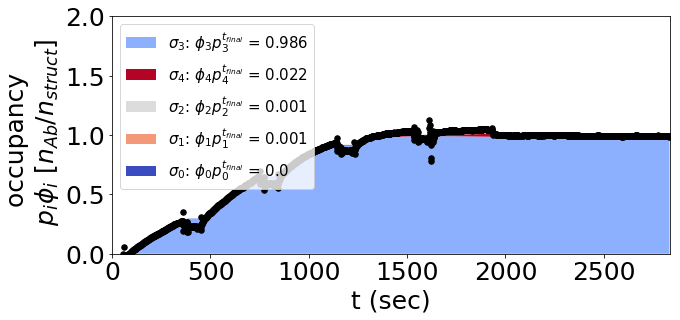

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.49333610e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.17415756]))
basinhopping step 0: f 59.7744
basinhopping step 1: f 59.7744 trial_f 188.435 accepted 0  lowest_f 59.7744
('Dig_Mouse_7nm_repeat2', [-2.913342616356234, 1.2048538694002933])


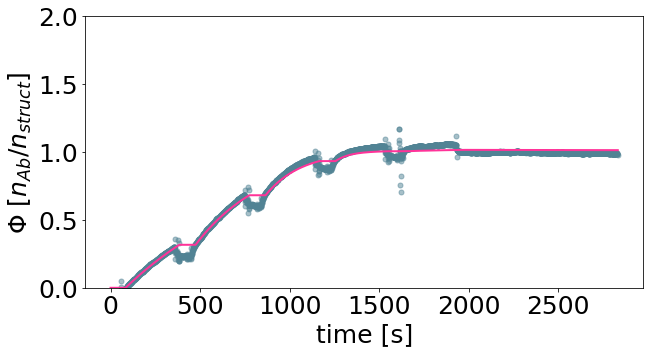

[1.22083616e-03 1.60270602e+01]


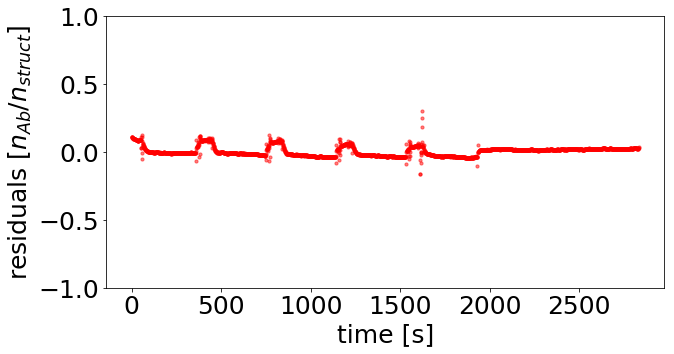

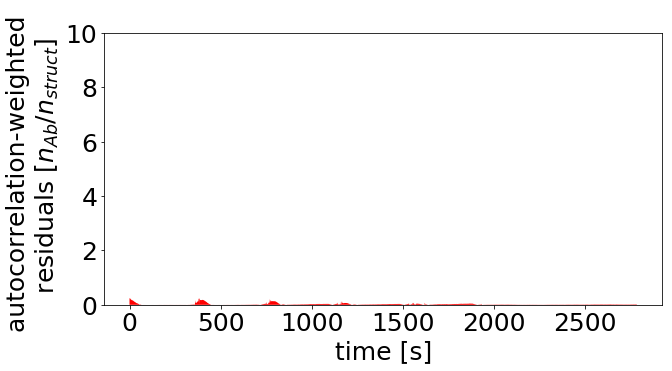

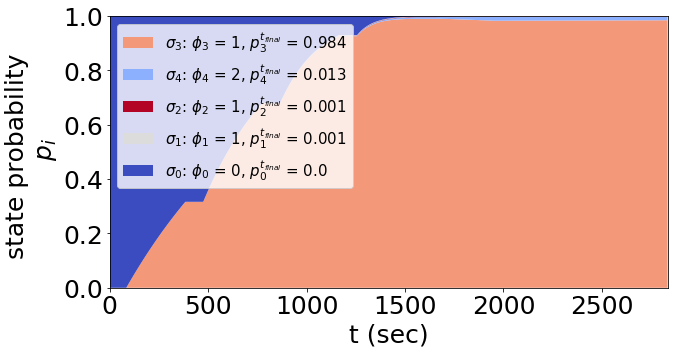

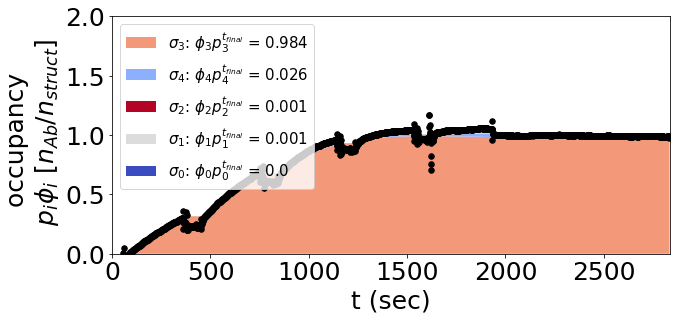

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.37528538e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.13839283]))
basinhopping step 0: f 74.2805
basinhopping step 1: f 74.2805 trial_f 74.2805 accepted 1  lowest_f 74.2805
('Dig_Mouse_14nm_repeat1', [-2.858611499397222, 1.142001232560335])


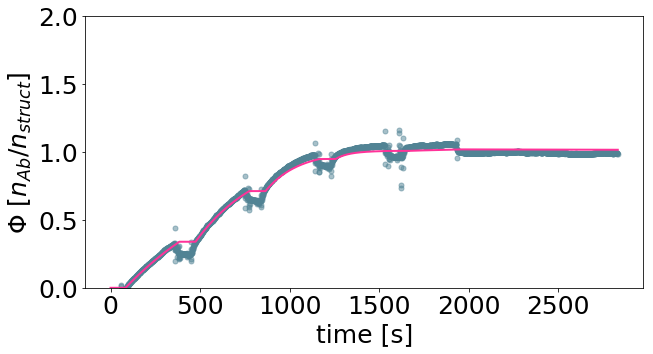

[1.38480461e-03 1.38675976e+01]


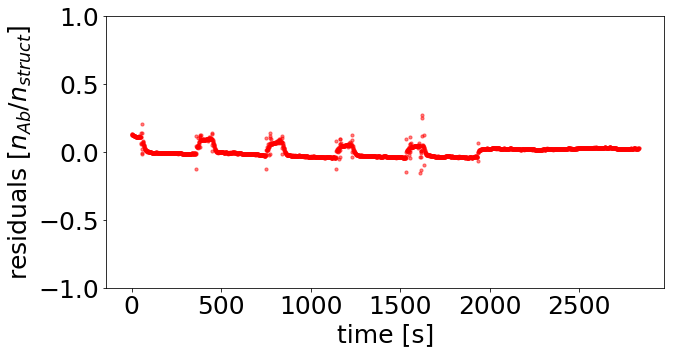

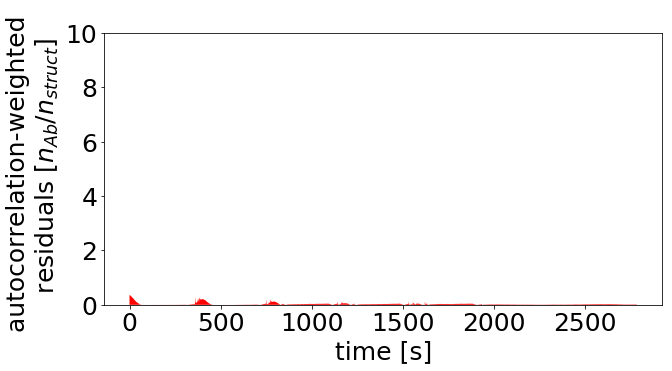

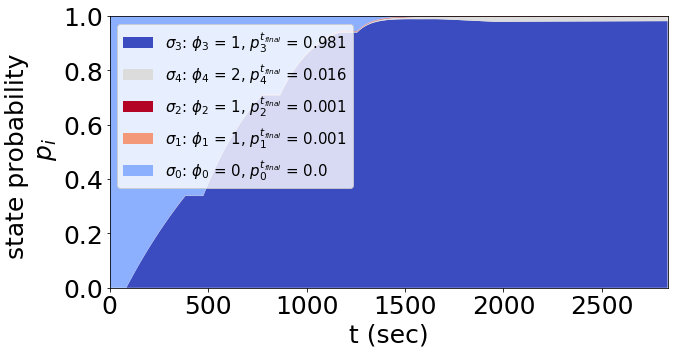

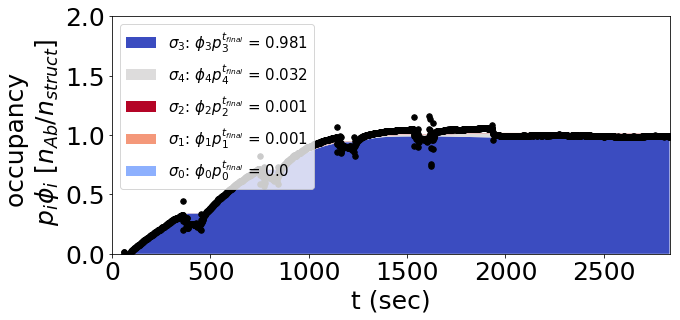

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.38386170e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.14109269]))
basinhopping step 0: f 14.0107
basinhopping step 1: f 14.0107 trial_f 14.0107 accepted 1  lowest_f 14.0107
found new global minimum on step 1 with function value 14.0107
('Dig_Mouse_14nm_repeat2', [-2.3006397383055983, 1.1998770043275073])


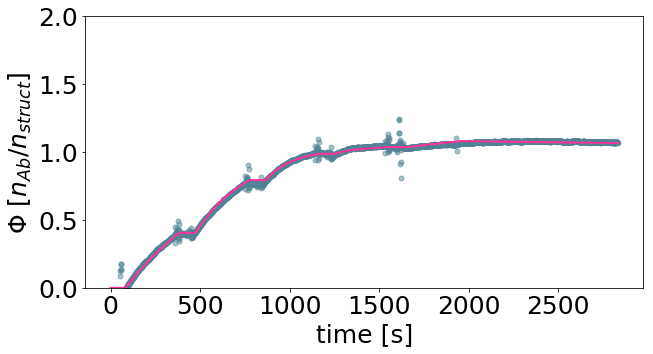

[5.00449502e-03 1.58444440e+01]


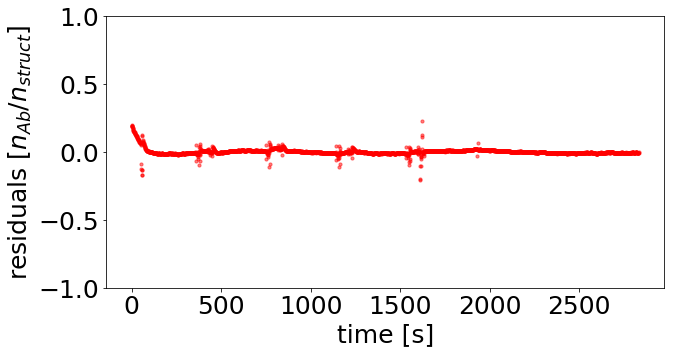

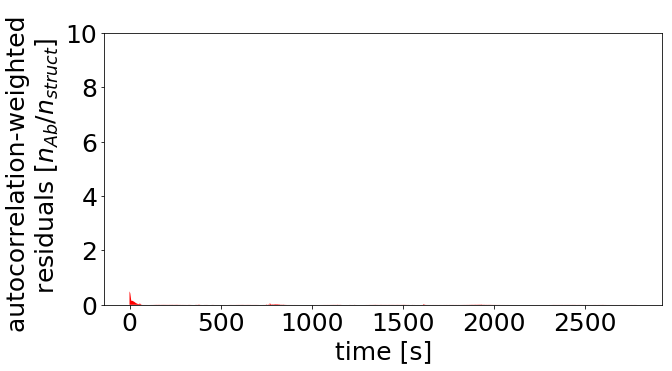

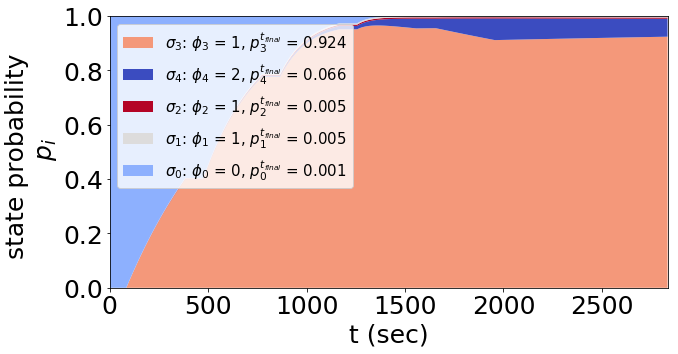

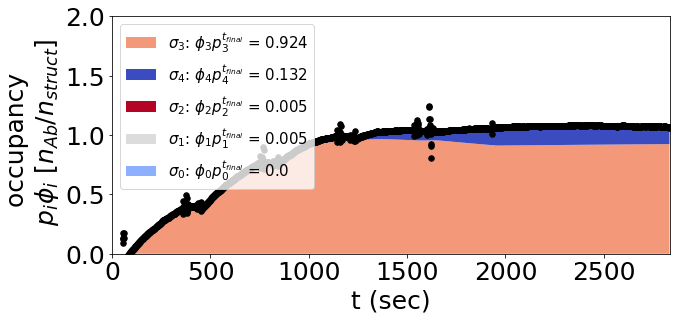

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.34248394e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.1279091 ]))
basinhopping step 0: f 48.2053
basinhopping step 1: f 48.2053 trial_f 48.2053 accepted 1  lowest_f 48.2053
('Dig_Mouse_16nm_repeat2', [-2.835667823573984, 1.1335175654693517])


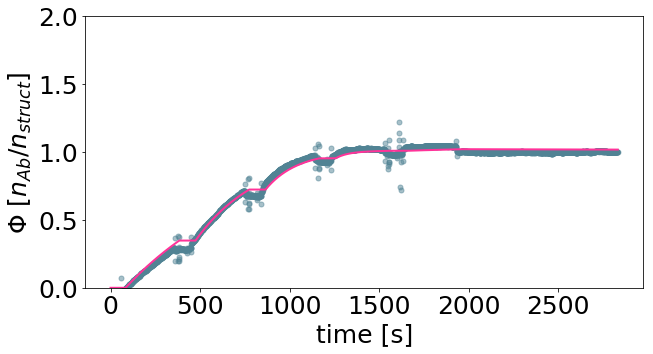

[1.45993048e-03 1.35993317e+01]


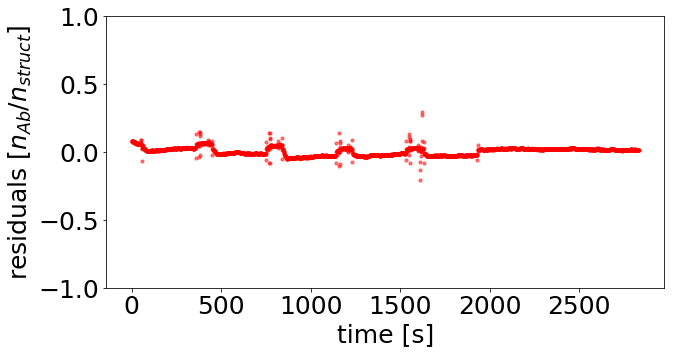

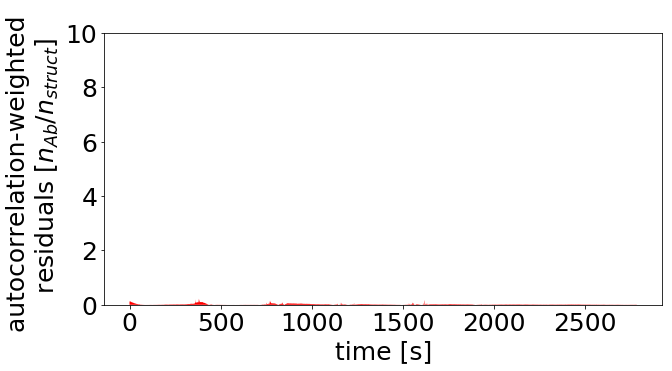

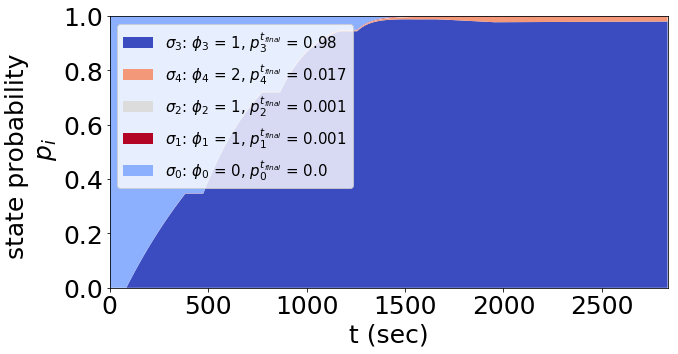

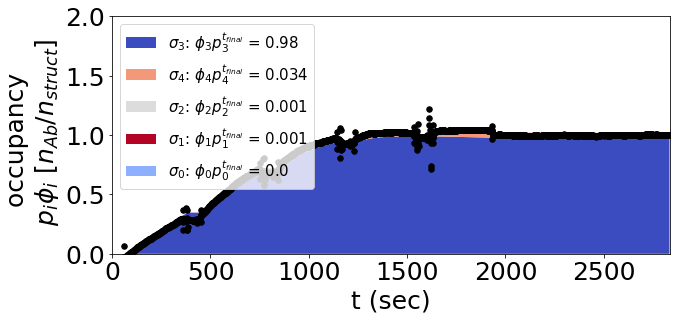

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.48746407e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.17244648]))
basinhopping step 0: f 201.626
basinhopping step 1: f 201.626 trial_f 201.626 accepted 1  lowest_f 201.626
found new global minimum on step 1 with function value 201.626
('Dig_Mouse_17nm_repeat1', [-3.0, 1.0903943836527892])


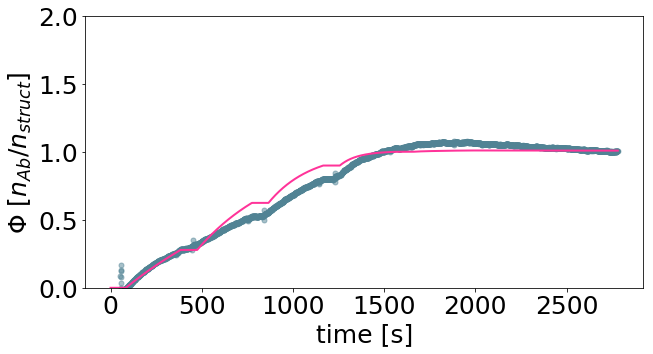

[1.00000000e-03 1.23138649e+01]


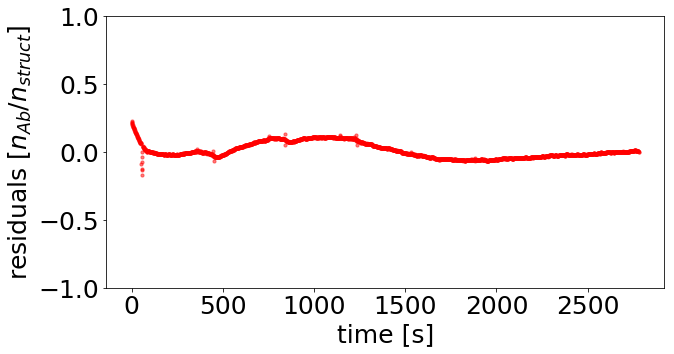

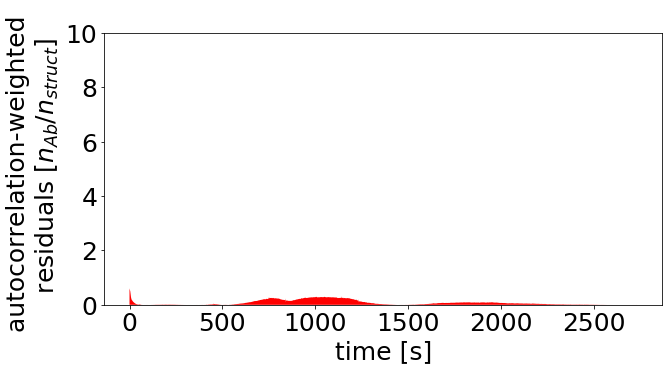

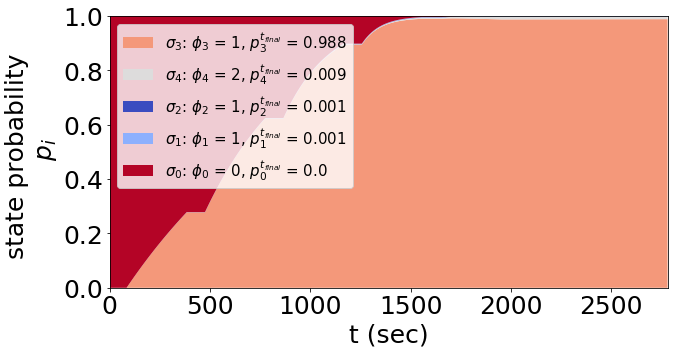

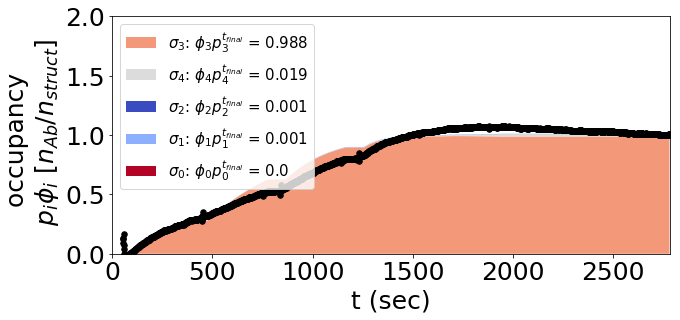

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.45126357e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.16174629]))
basinhopping step 0: f 170.118
basinhopping step 1: f 170.118 trial_f 170.118 accepted 1  lowest_f 170.118
found new global minimum on step 1 with function value 170.118
('Dig_Mouse_17nm_repeat2', [-3.0, 1.0876422319451784])


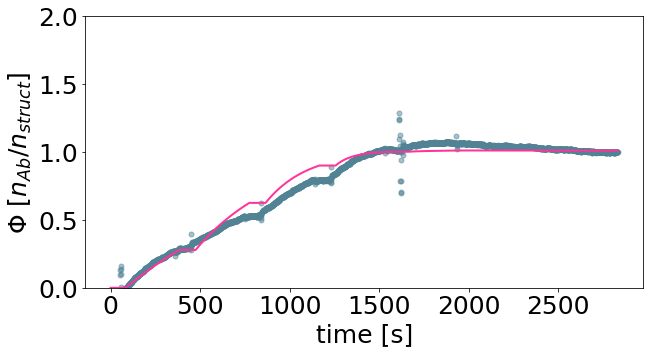

[1.00000000e-03 1.22360779e+01]


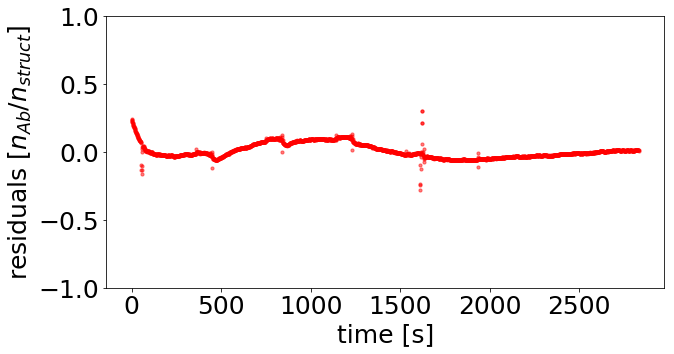

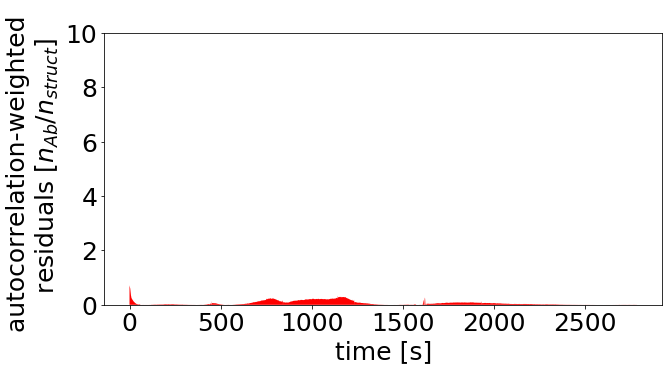

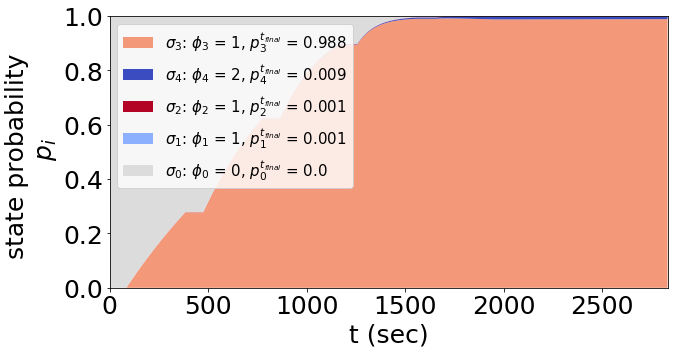

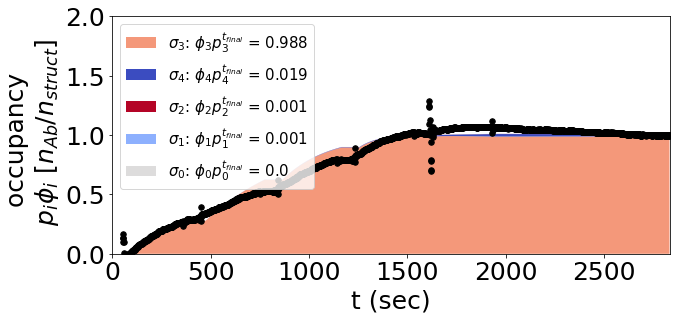

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.75956961e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.24540645]))
basinhopping step 0: f 364.099
basinhopping step 1: f 364.099 trial_f 364.099 accepted 1  lowest_f 364.099
found new global minimum on step 1 with function value 364.099
('Dig_Mouse_21nm_repeat1', [-0.4541205227527639, 1.1202215013129553])


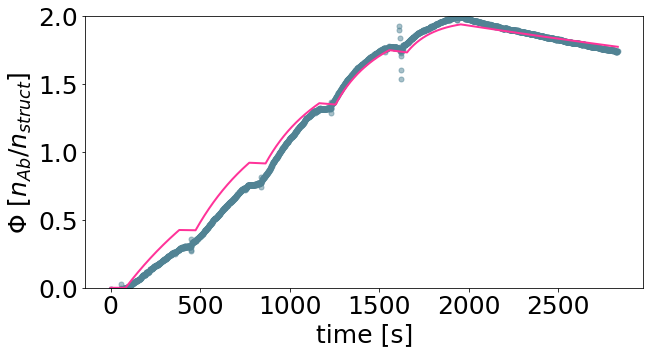

[ 0.35146289 13.18929255]


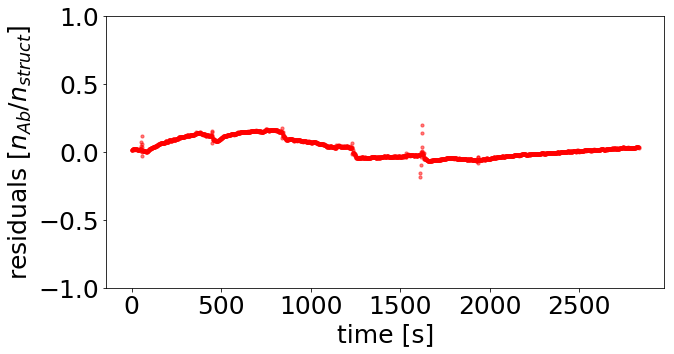

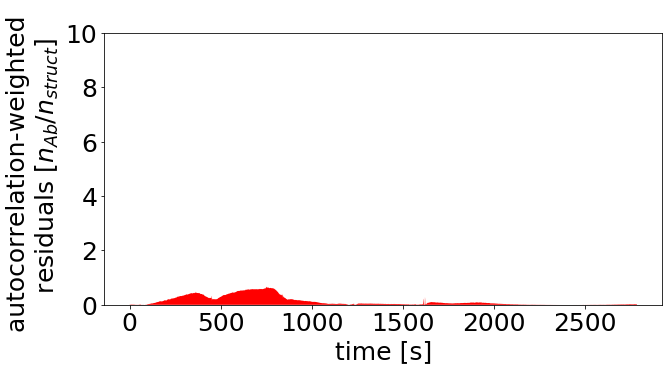

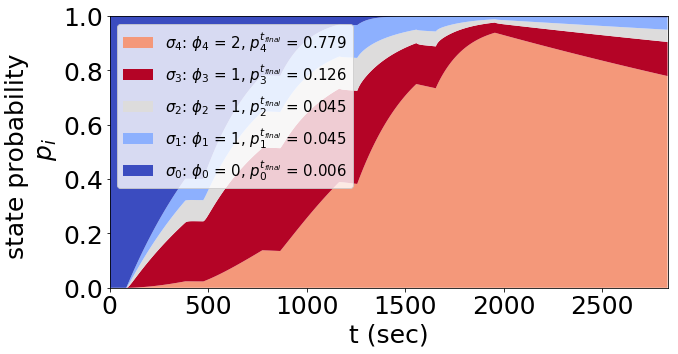

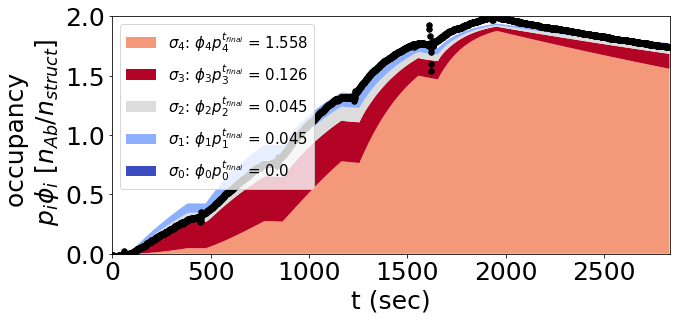

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.43169679e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.15585105]))
basinhopping step 0: f 299.128
basinhopping step 1: f 299.128 trial_f 299.128 accepted 1  lowest_f 299.128
found new global minimum on step 1 with function value 299.128
('Dig_Mouse_21nm_repeat2', [-0.5488006577734247, 1.1414635864298646])


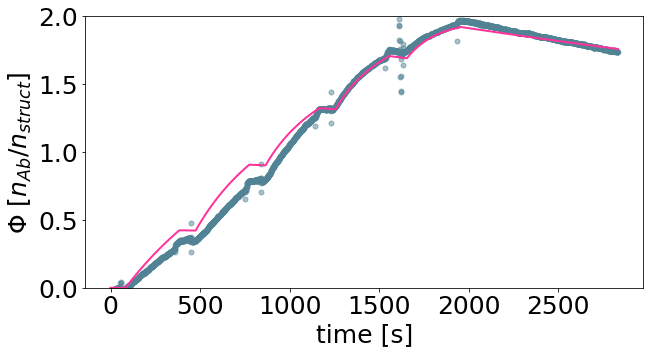

[ 0.28261769 13.85044052]


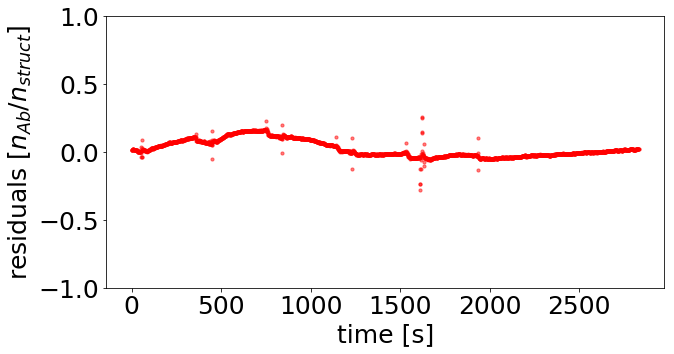

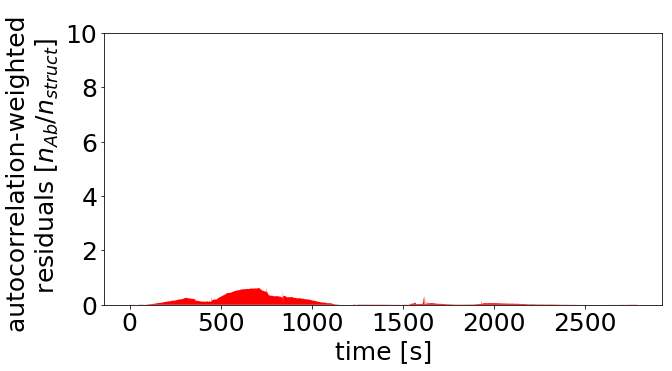

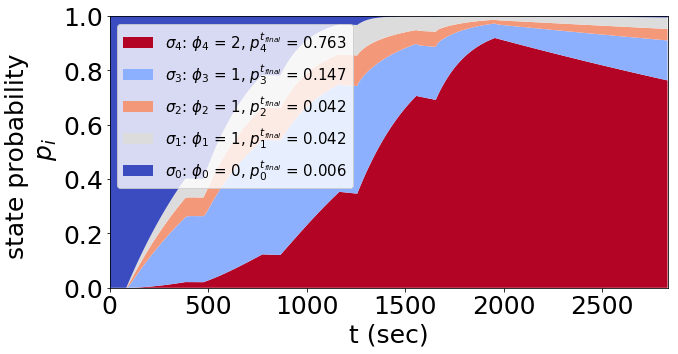

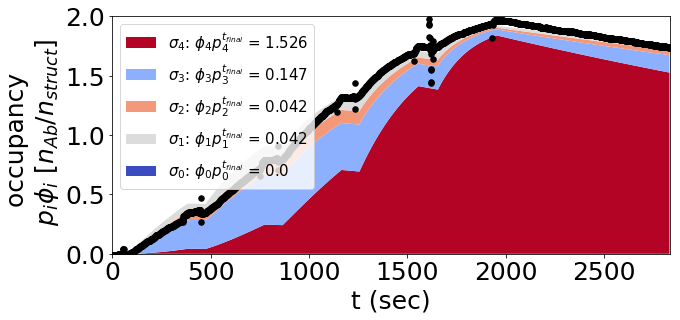

[array([-3.        ,  1.14632595]), array([-2.95430622,  1.22738756]), array([-2.91334262,  1.20485387]), array([-2.8586115 ,  1.14200123]), array([-2.30063974,  1.199877  ]), array([-2.83566782,  1.13351757]), array([-3.        ,  1.09039438]), array([-3.        ,  1.08764223]), array([-0.45412052,  1.1202215 ]), array([-0.54880066,  1.14146359])]
xopt_compilation for monobiv, bivmono, norm_const is:
[array([-3.        ,  1.14632595]), array([-2.95430622,  1.22738756]), array([-2.91334262,  1.20485387]), array([-2.8586115 ,  1.14200123]), array([-2.30063974,  1.199877  ]), array([-2.83566782,  1.13351757]), array([-3.        ,  1.09039438]), array([-3.        ,  1.08764223]), array([-0.45412052,  1.1202215 ]), array([-0.54880066,  1.14146359])]


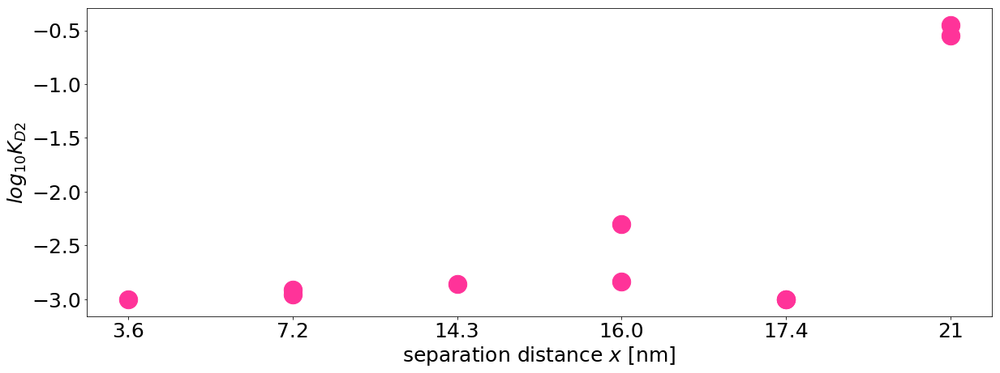

In [26]:

imp.reload(mk)

output_directory = master_name+"/output_spat_tol_function_fitting_upper95"
if not os.path.exists(output_directory):
            os.makedirs(output_directory)

origami_alpha = mk.Fitting(
    run_list = run_list_biv, 
    run_type = "biv", 
    mono_rates =  np.array([k_on_gupper95, k_off_gupper95]),
    KD_biv = KD_biv,
    concentrations = concentrations, 
    time_points = time_points, 
    scaling_constant = None, #18.31222
    output_dir = output_directory,
      struct_params = ['data_directory/Dig_distances_Mouse/',RstrRmax_slope, RstrRmax_interc],
      data_dir ='data_directory/Dig_distances_Mouse/' )
origami_alpha.set_bounds(((-3,3),(np.log10(18.31222-10),np.log10(18.31222+10))))
xopt_compilation_upper95 = origami_alpha.fit_annealing(fitting_number = len(run_list_biv))
print("xopt_compilation for monobiv, bivmono, norm_const is:")
print(xopt_compilation_upper95)


plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25) 
plt.rcParams.update({'font.size': 25})
plt.figure(figsize=(20,7))
plt.scatter(run_list_biv.T[2], np.array(xopt_compilation_upper95).T[0], alpha = 1, s = 500,c="#ff3399")
plt.ylabel("$log_{10}K_{D2}$")
plt.xlabel("separation distance $x$ [nm]")
plt.savefig(output_directory+"/ spat_tol_function_fitting.svg")
plt.show()
plt.close()


# pkl.dump([origami_alpha,  xopt_compilation_upper95,output_directory
#          ], open(master_name+'/pickle_directory/spat_tol_function_fitting.pickle', 'wb'))

# Alpha function fitting - with K_D - based on upper68 KD1

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.37636521e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.13873369]))
basinhopping step 0: f 90.9709
basinhopping step 1: f 90.9709 trial_f 90.9709 accepted 1  lowest_f 90.9709
found new global minimum on step 1 with function value 90.9709
('Dig_Mouse_3nm_repeat2', [-3.0, 1.1549492579138738])


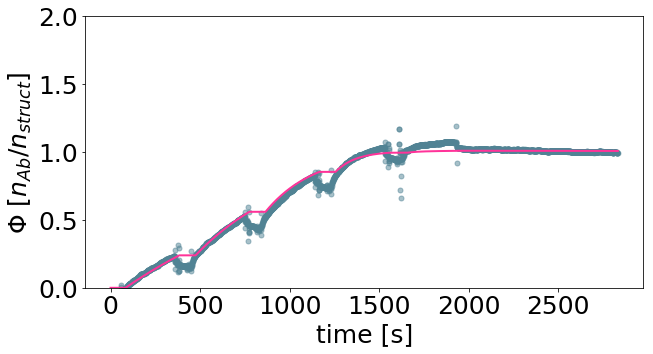

[1.00000000e-03 1.42872702e+01]


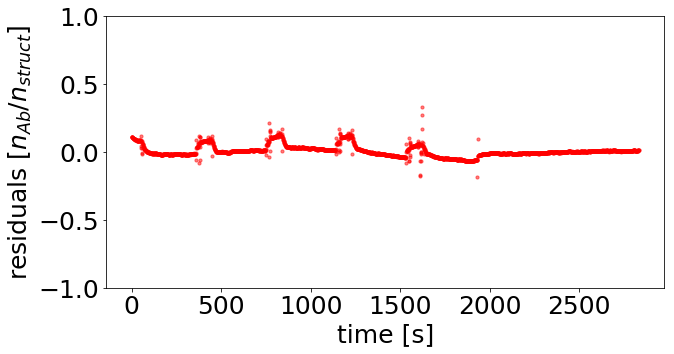

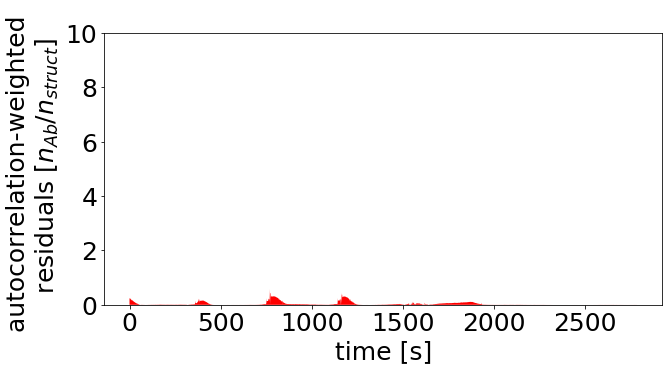

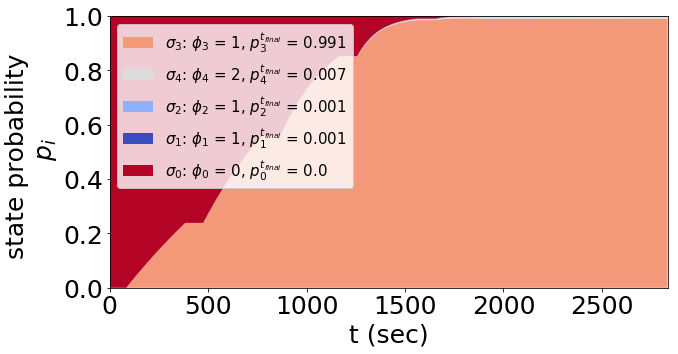

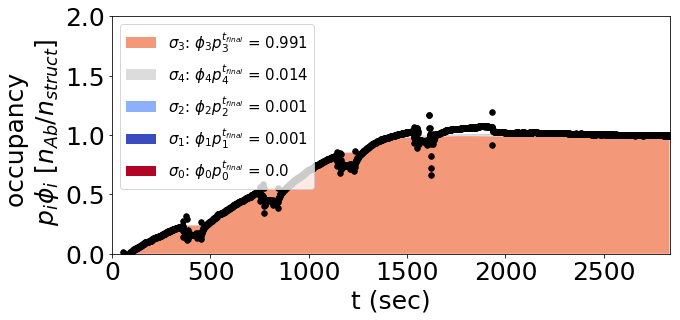

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.52029428e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.18192766]))
basinhopping step 0: f 46.6838
basinhopping step 1: f 46.6838 trial_f 46.6838 accepted 1  lowest_f 46.6838
('Dig_Mouse_7nm_repeat1', [-2.837982839586458, 1.2265762830517435])


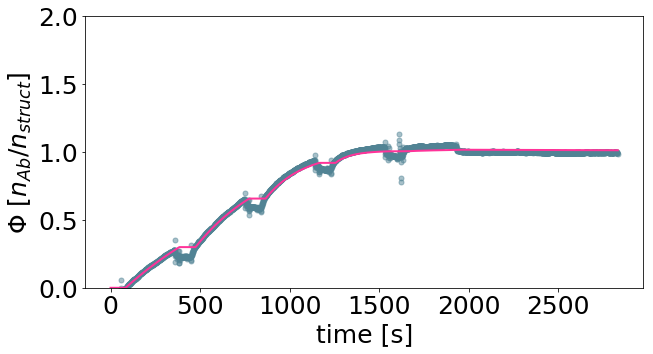

[1.45216900e-03 1.68490835e+01]


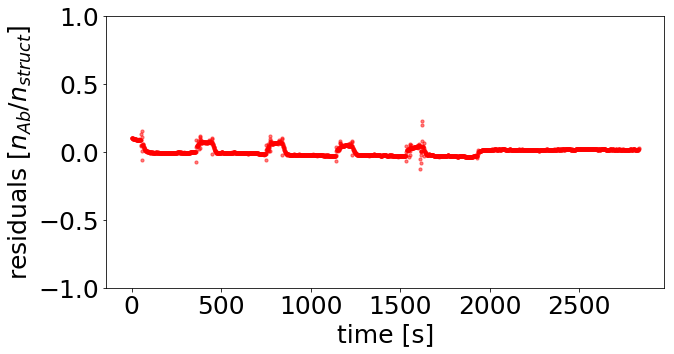

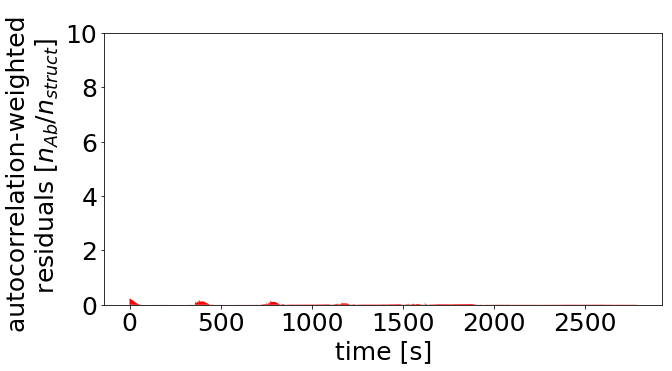

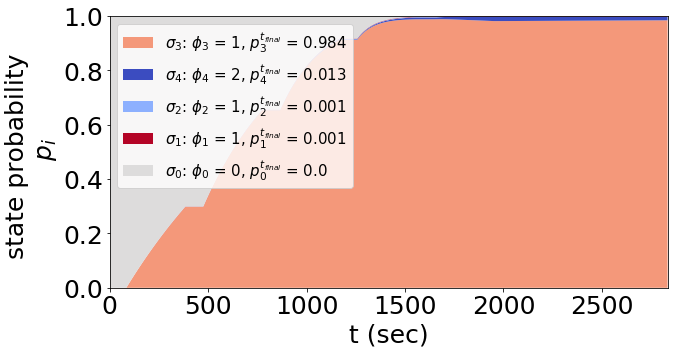

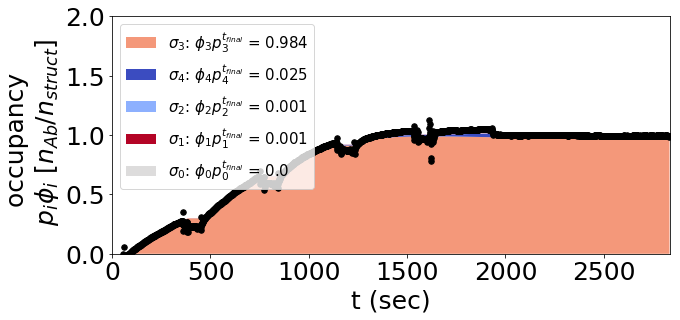

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.49333610e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.17415756]))
basinhopping step 0: f 60.6206
basinhopping step 1: f 60.6206 trial_f 60.6206 accepted 1  lowest_f 60.6206
('Dig_Mouse_7nm_repeat2', [-2.7798819082787474, 1.2037835888417814])


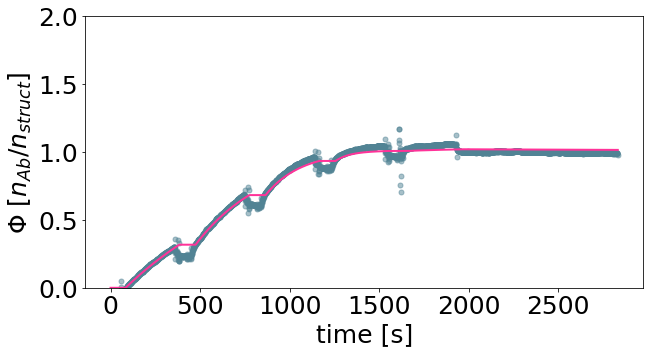

[1.66003824e-03 1.59876116e+01]


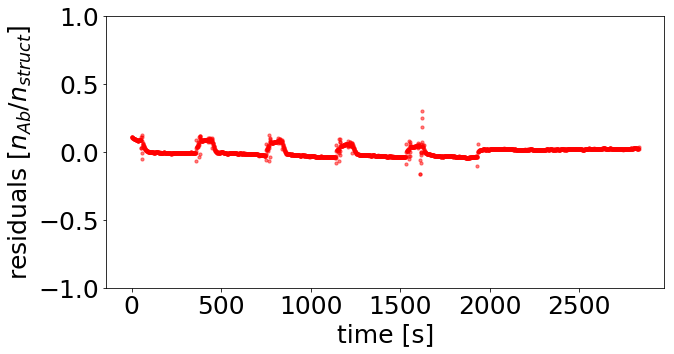

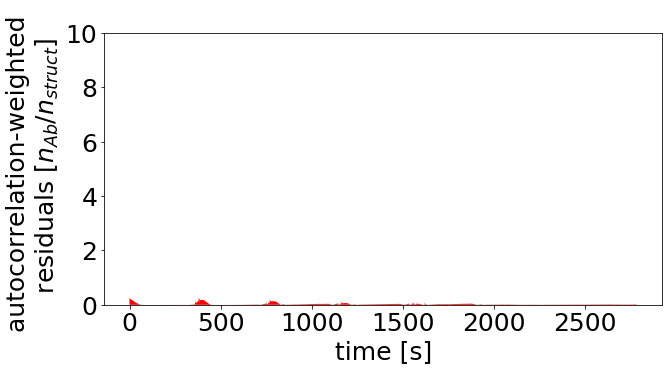

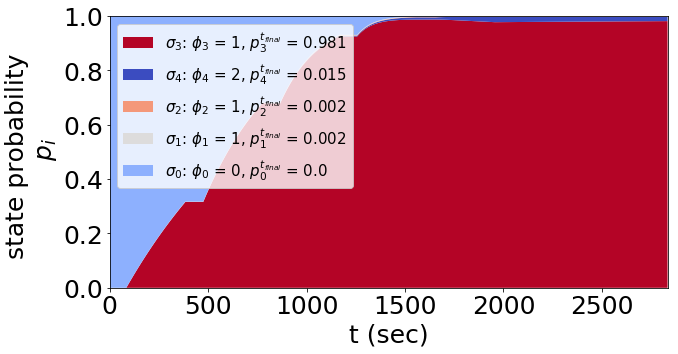

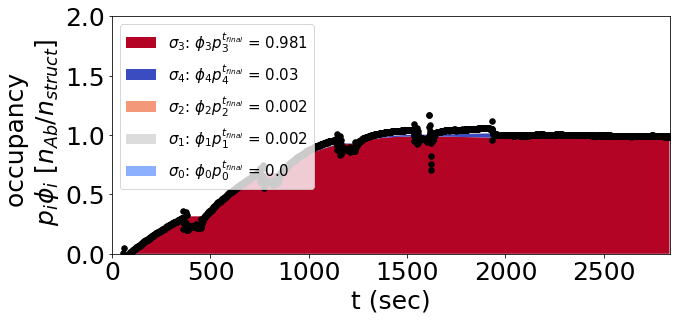

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.37528538e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.13839283]))
basinhopping step 0: f 77.1907
basinhopping step 1: f 77.1907 trial_f 77.1907 accepted 1  lowest_f 77.1907
('Dig_Mouse_14nm_repeat1', [-2.683457105258384, 1.1405301879688636])


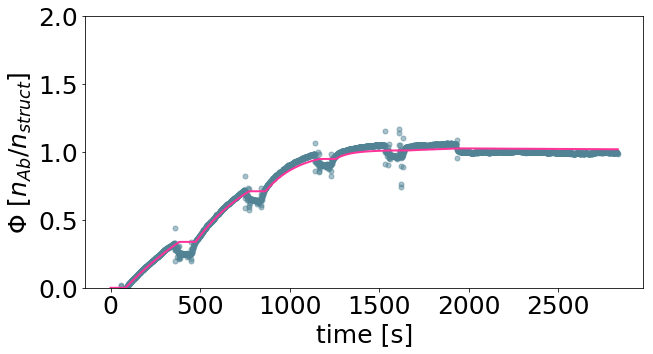

[2.07273077e-03 1.38207047e+01]


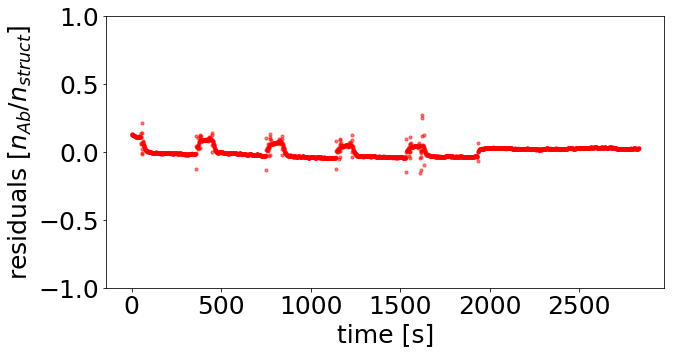

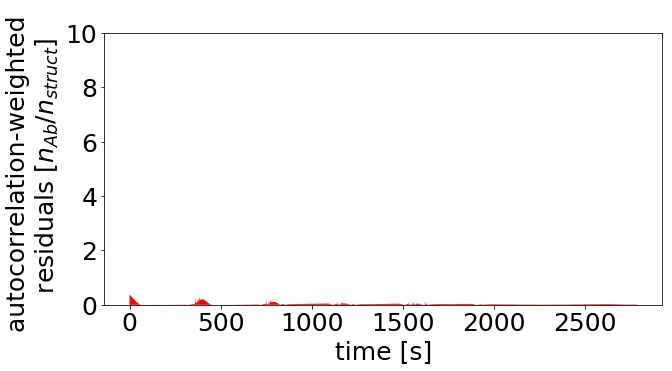

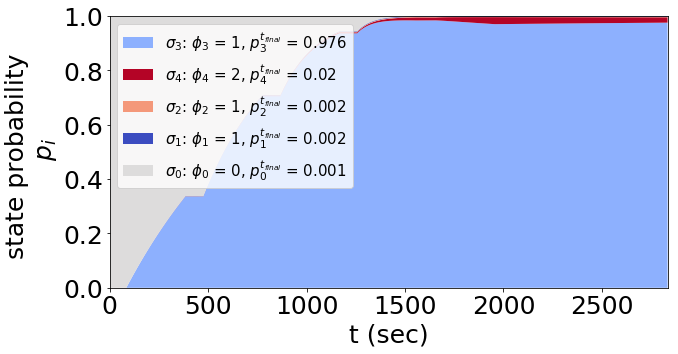

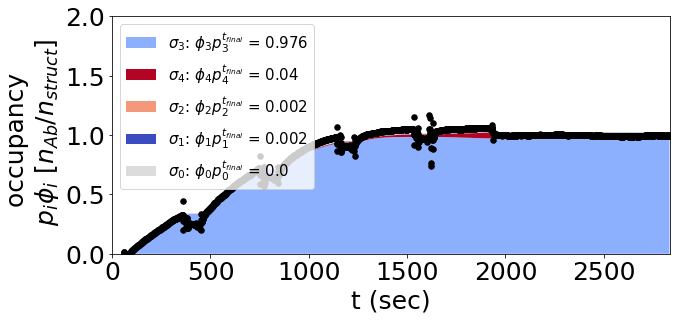

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.38386170e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.14109269]))
basinhopping step 0: f 37.238
basinhopping step 1: f 37.238 trial_f 37.238 accepted 1  lowest_f 37.238
('Dig_Mouse_14nm_repeat2', [-2.522937871975142, 1.2172756268544136])


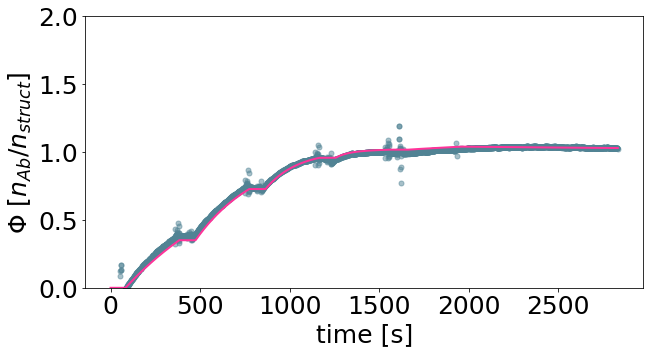

[2.99959160e-03 1.64920874e+01]


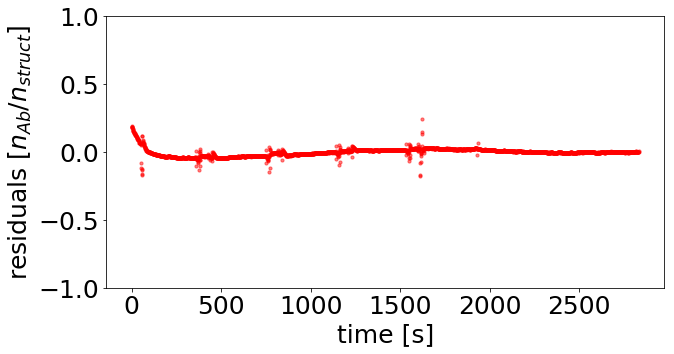

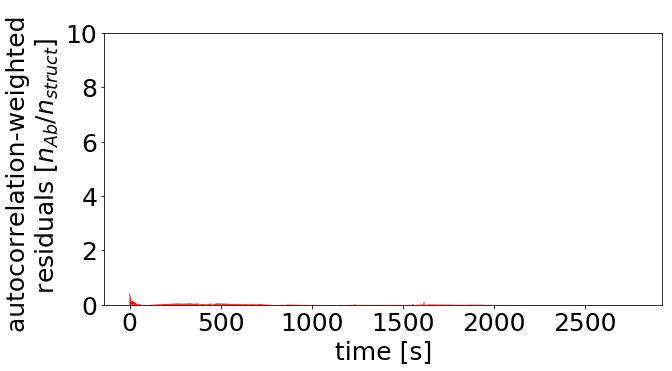

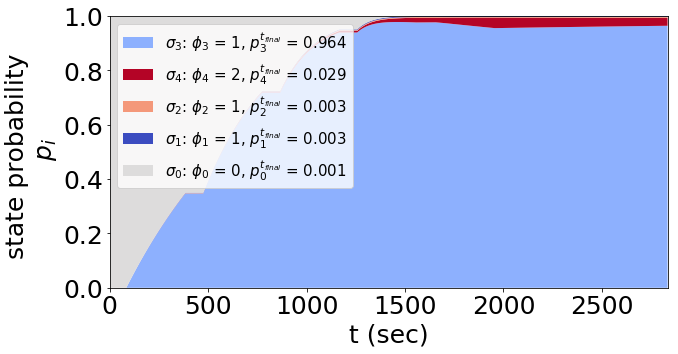

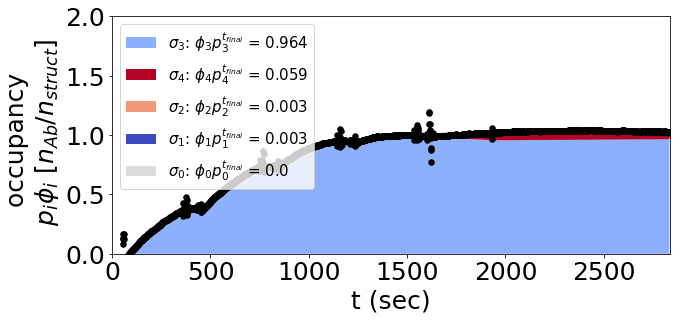

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.34248394e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.1279091 ]))
basinhopping step 0: f 52.9121
basinhopping step 1: f 52.9121 trial_f 52.9121 accepted 1  lowest_f 52.9121
('Dig_Mouse_16nm_repeat2', [-2.644626302131693, 1.1322153387365803])


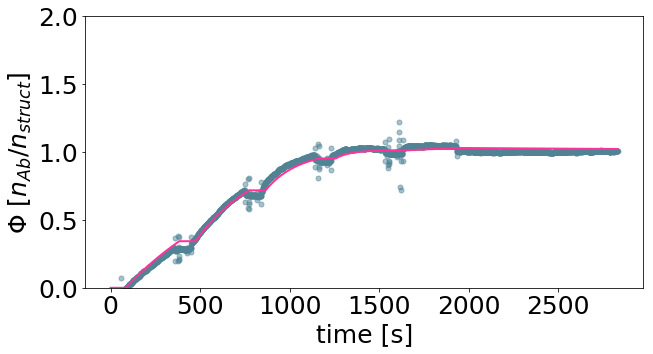

[2.26659381e-03 1.35586153e+01]


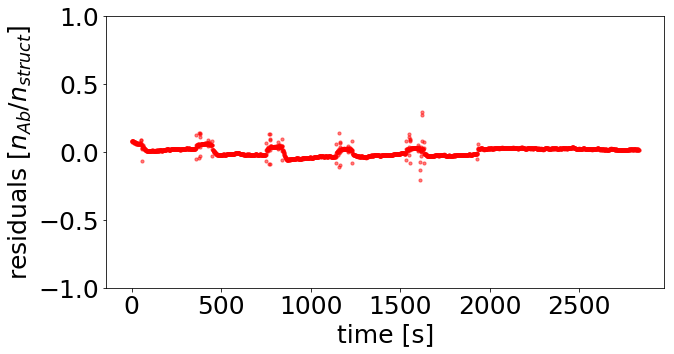

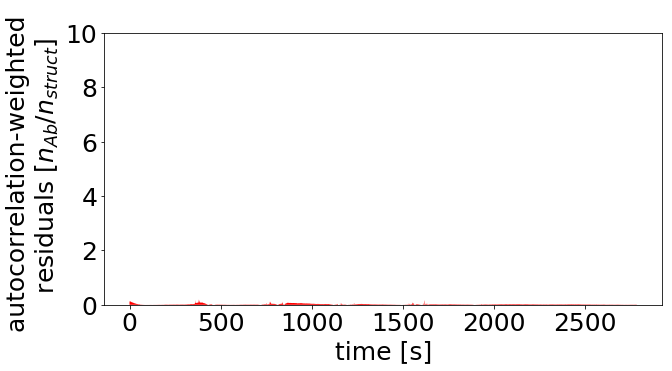

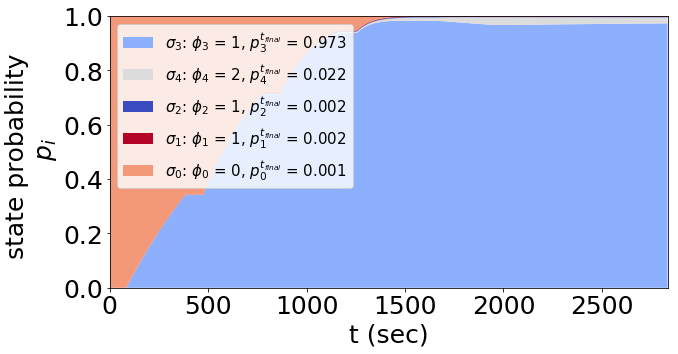

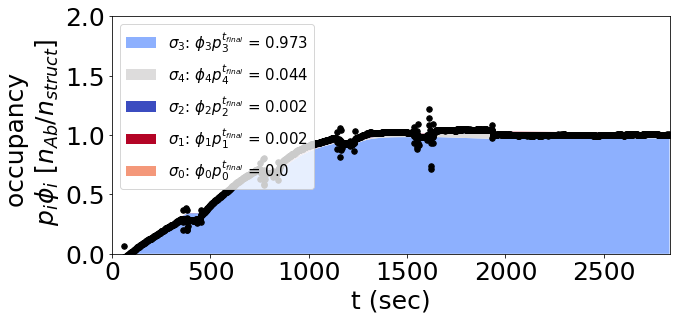

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.48746407e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.17244648]))
basinhopping step 0: f 87.6831
basinhopping step 1: f 87.6831 trial_f 186.88 accepted 0  lowest_f 87.6831
('Dig_Mouse_17nm_repeat1', [-3.0, 1.099290940193698])


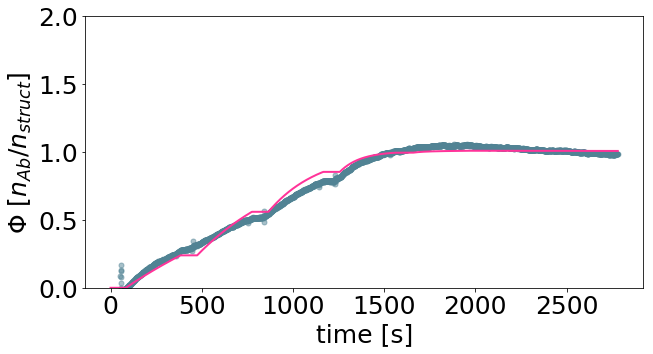

[1.00000000e-03 1.25687168e+01]


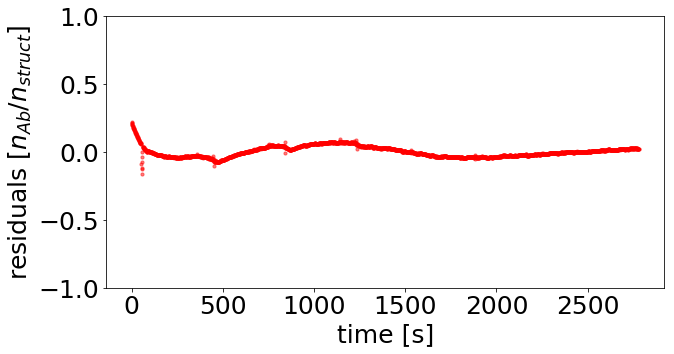

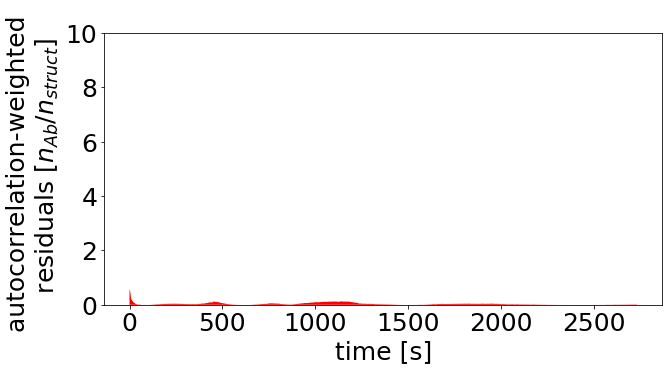

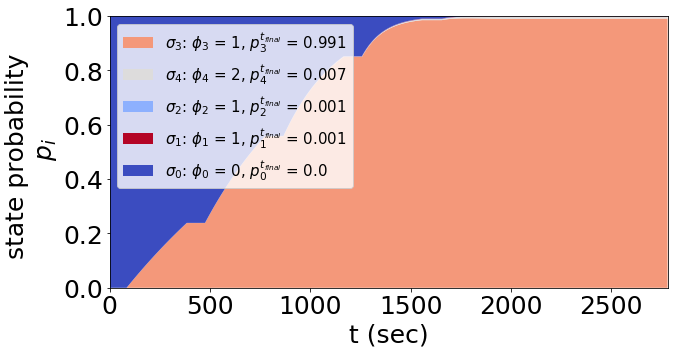

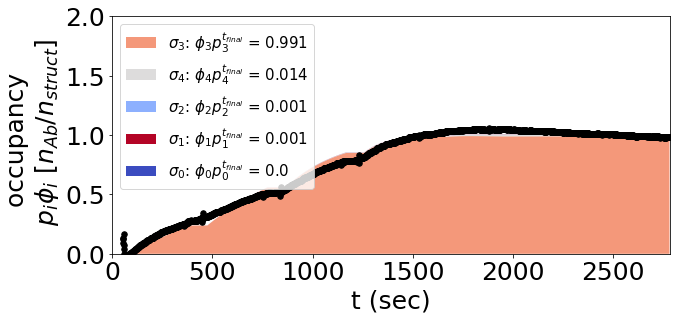

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.45126357e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.16174629]))
basinhopping step 0: f 87.7451
basinhopping step 1: f 87.7451 trial_f 87.7451 accepted 1  lowest_f 87.7451
found new global minimum on step 1 with function value 87.7451
('Dig_Mouse_17nm_repeat2', [-3.0, 1.0965787062273982])


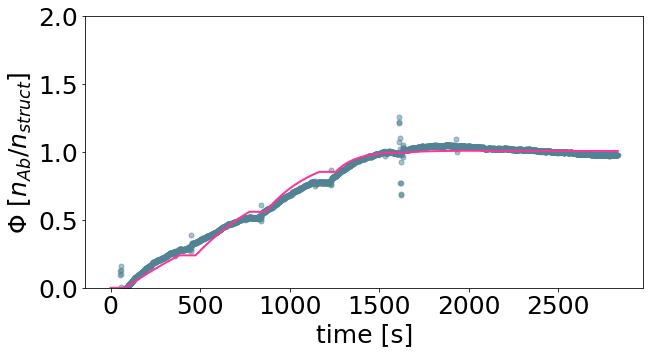

[1.00000000e-03 1.24904679e+01]


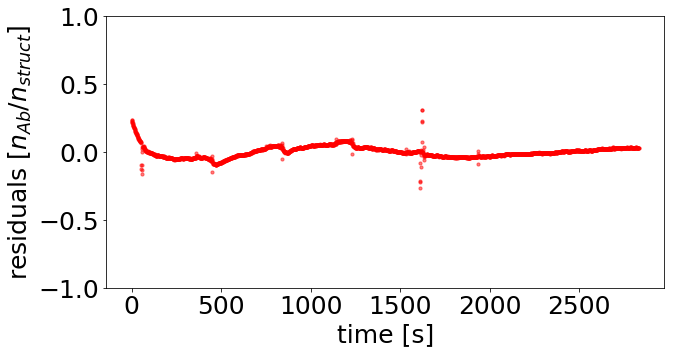

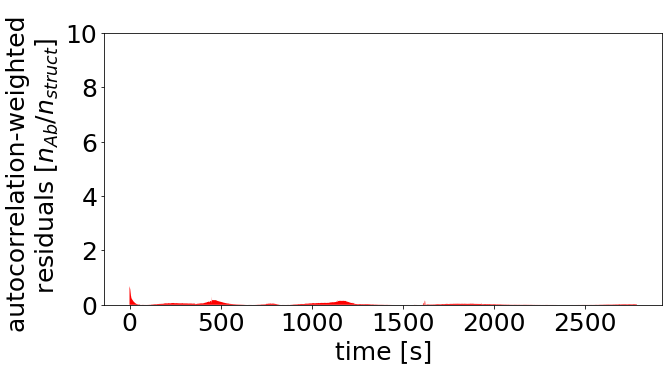

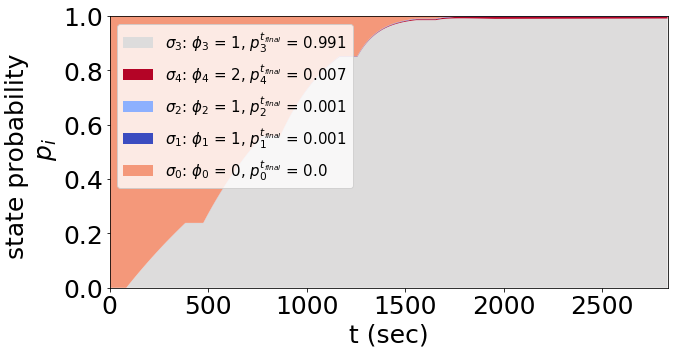

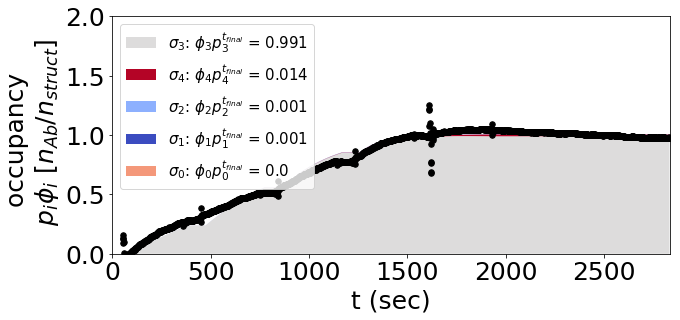

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.75956961e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.24540645]))
basinhopping step 0: f 113.827
basinhopping step 1: f 113.827 trial_f 113.827 accepted 1  lowest_f 113.827
found new global minimum on step 1 with function value 113.827
('Dig_Mouse_21nm_repeat1', [-0.2625659352708205, 1.13054206485596])


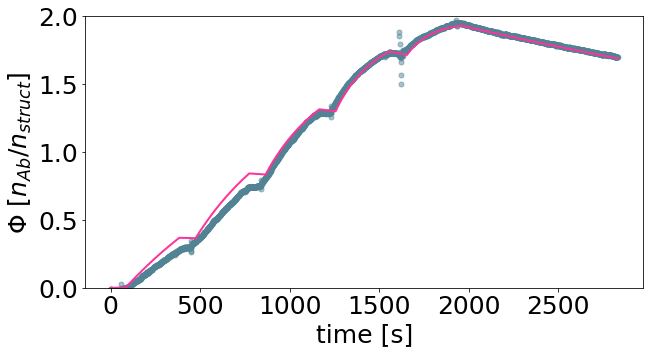

[ 0.5463036  13.50647642]


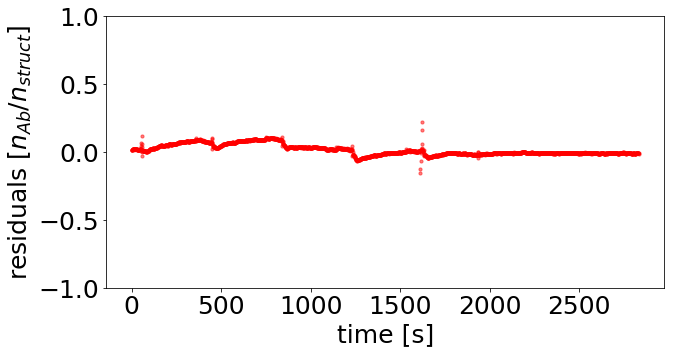

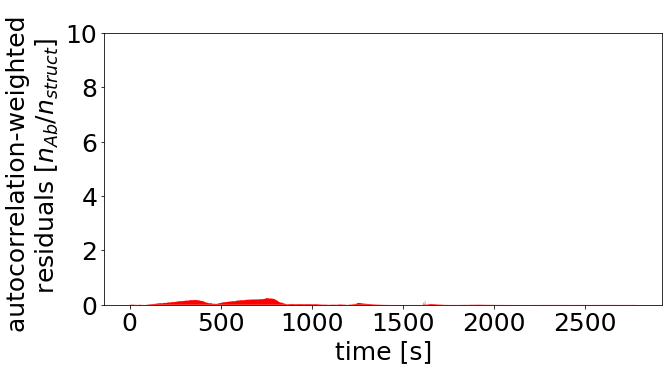

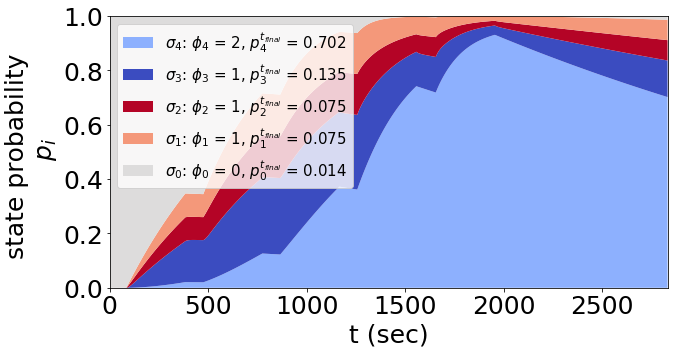

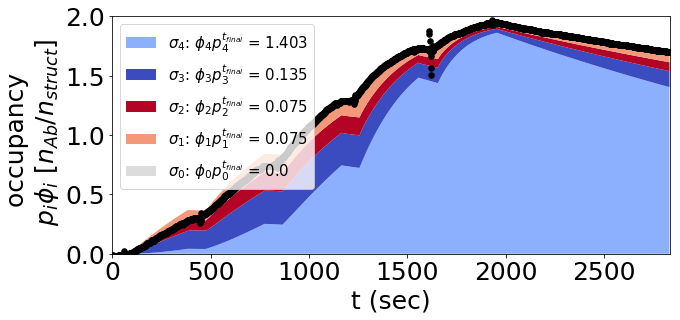

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.43169679e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.15585105]))
basinhopping step 0: f 93.0307
basinhopping step 1: f 93.0307 trial_f 93.0307 accepted 1  lowest_f 93.0307
found new global minimum on step 1 with function value 93.0307
('Dig_Mouse_21nm_repeat2', [-0.4069605160979805, 1.1539967626669718])


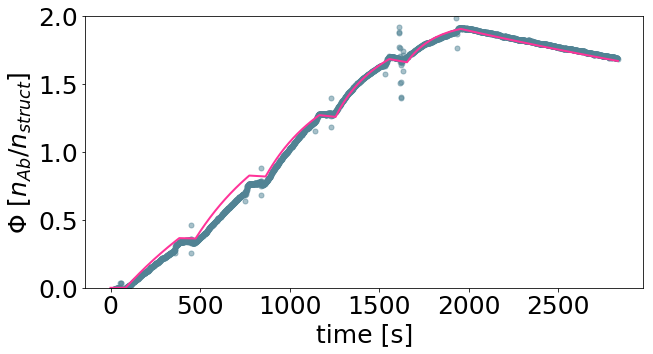

[ 0.39177749 14.25596967]


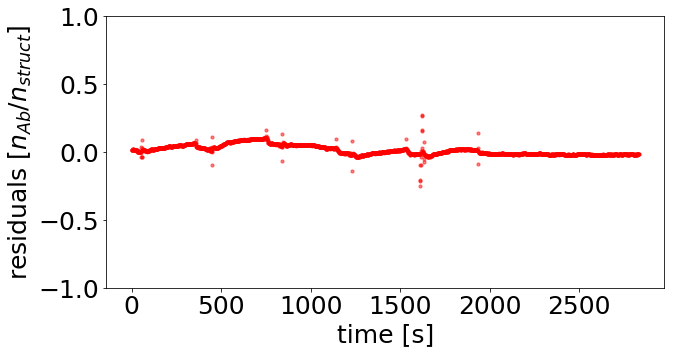

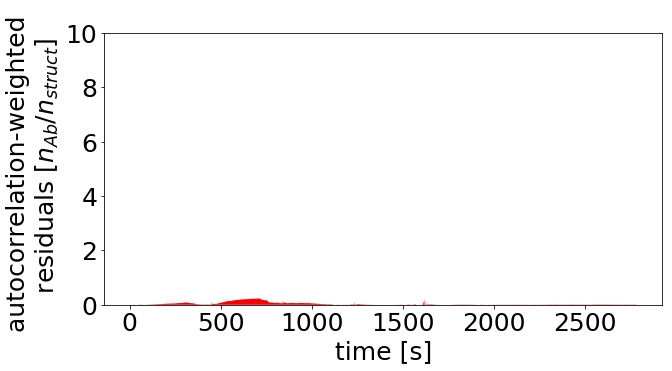

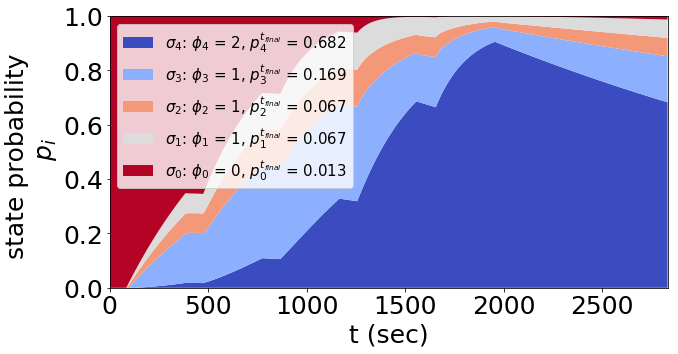

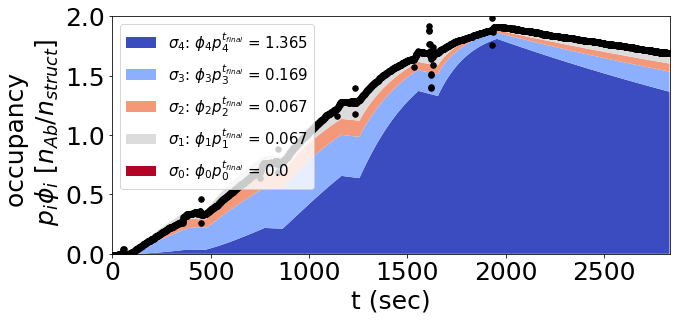

[array([-3.        ,  1.15494926]), array([-2.83798284,  1.22657628]), array([-2.77988191,  1.20378359]), array([-2.68345711,  1.14053019]), array([-2.52293787,  1.21727563]), array([-2.6446263 ,  1.13221534]), array([-3.        ,  1.09929094]), array([-3.        ,  1.09657871]), array([-0.26256594,  1.13054206]), array([-0.40696052,  1.15399676])]
xopt_compilation for monobiv, bivmono, norm_const is:
[array([-3.        ,  1.15494926]), array([-2.83798284,  1.22657628]), array([-2.77988191,  1.20378359]), array([-2.68345711,  1.14053019]), array([-2.52293787,  1.21727563]), array([-2.6446263 ,  1.13221534]), array([-3.        ,  1.09929094]), array([-3.        ,  1.09657871]), array([-0.26256594,  1.13054206]), array([-0.40696052,  1.15399676])]


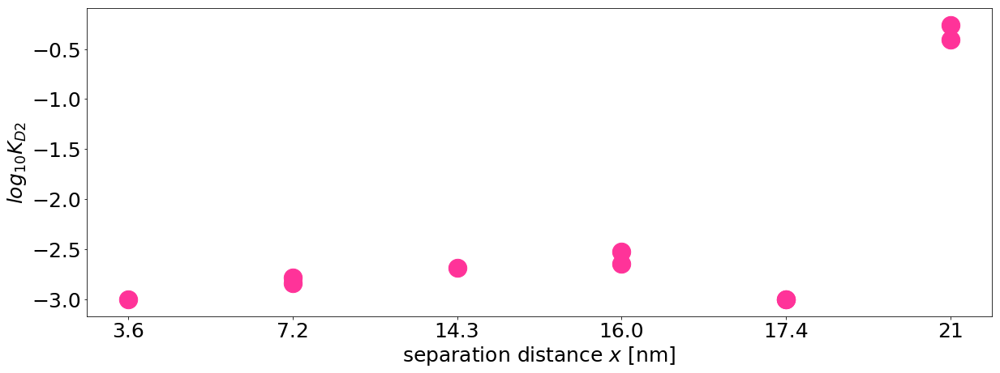

In [27]:

imp.reload(mk)

output_directory = master_name+"/output_spat_tol_function_fitting_upper68"
if not os.path.exists(output_directory):
            os.makedirs(output_directory)

origami_alpha = mk.Fitting(
    run_list = run_list_biv, 
    run_type = "biv", 
    mono_rates =  np.array([k_on_gupper68, k_off_gupper68]),
    KD_biv = KD_biv,
    concentrations = concentrations, 
    time_points = time_points, 
    scaling_constant = None, #18.31222
    output_dir = output_directory,
      struct_params = ['data_directory/Dig_distances_Mouse/',RstrRmax_slope, RstrRmax_interc],
      data_dir ='data_directory/Dig_distances_Mouse/' )
origami_alpha.set_bounds(((-3,3),(np.log10(18.31222-10),np.log10(18.31222+10))))
xopt_compilation_upper68 = origami_alpha.fit_annealing(fitting_number = len(run_list_biv))
print("xopt_compilation for monobiv, bivmono, norm_const is:")
print(xopt_compilation_upper68)


plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25) 
plt.rcParams.update({'font.size': 25})
plt.figure(figsize=(20,7))
plt.scatter(run_list_biv.T[2], np.array(xopt_compilation_upper68).T[0], alpha = 1, s = 500,c="#ff3399")
plt.ylabel("$log_{10}K_{D2}$")
plt.xlabel("separation distance $x$ [nm]")
plt.savefig(output_directory+"/ spat_tol_function_fitting.svg")
plt.show()
plt.close()


# pkl.dump([origami_alpha,  xopt_compilation_upper68,output_directory
#          ], open(master_name+'/pickle_directory/spat_tol_function_fitting.pickle', 'wb'))

# Alpha function fitting - with K_D - based on lower 95 KD1

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.37636521e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.13873369]))
basinhopping step 0: f 228.412
basinhopping step 1: f 228.412 trial_f 228.412 accepted 1  lowest_f 228.412
('Dig_Mouse_3nm_repeat2', [-2.514903822188659, 1.1757418440139138])


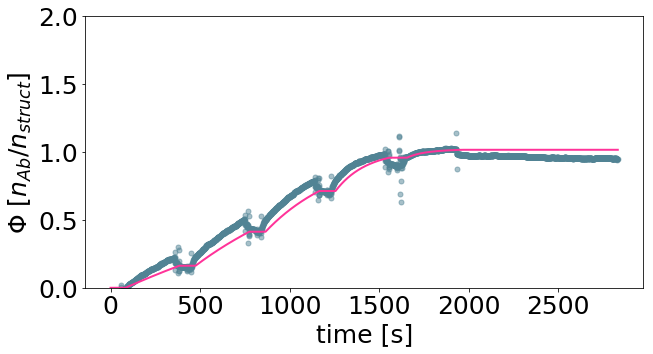

[3.05559772e-03 1.49879365e+01]


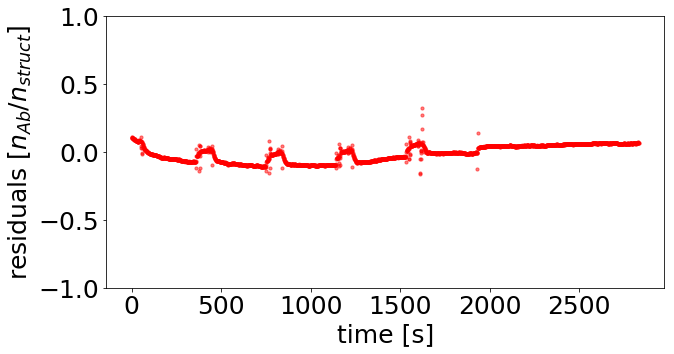

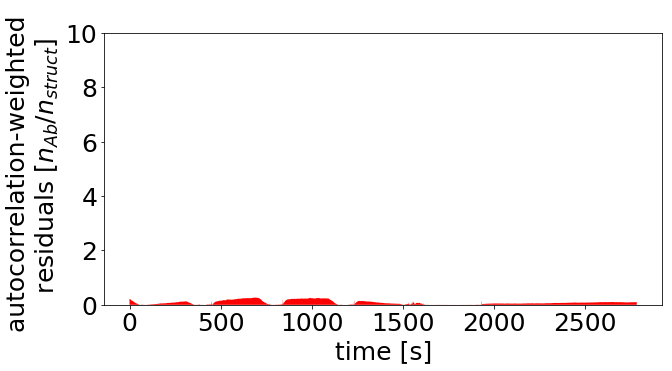

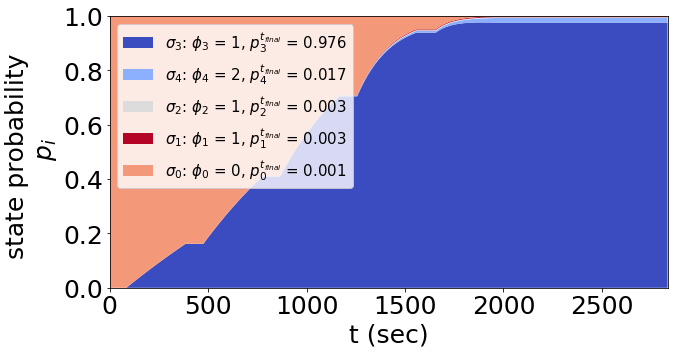

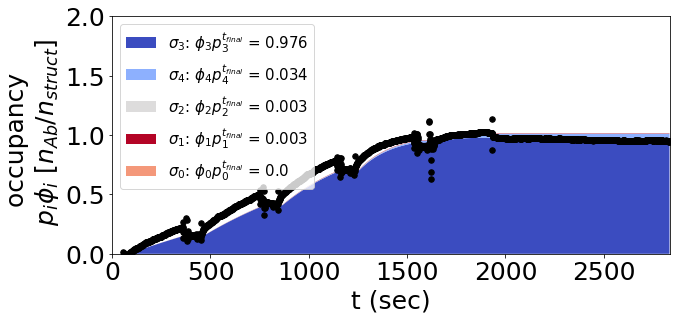

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.52029428e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.18192766]))
basinhopping step 0: f 857.411
basinhopping step 1: f 857.411 trial_f 857.411 accepted 1  lowest_f 857.411
found new global minimum on step 1 with function value 857.411
('Dig_Mouse_7nm_repeat1', [-2.5204679448524523, 1.2655459620312663])


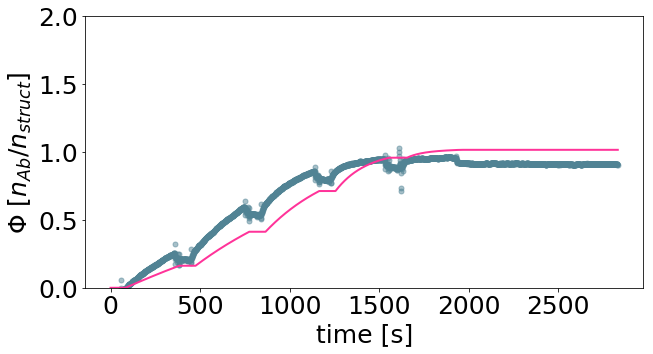

[3.01669953e-03 1.84308754e+01]


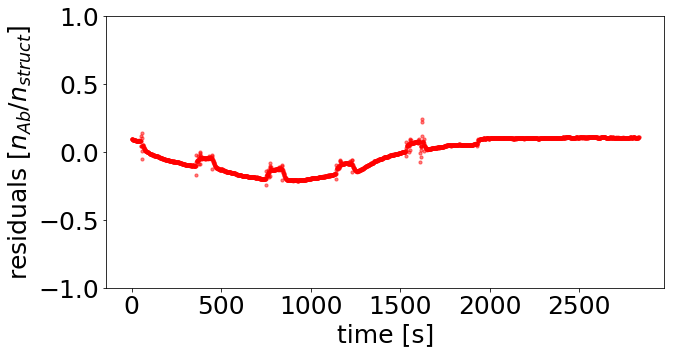

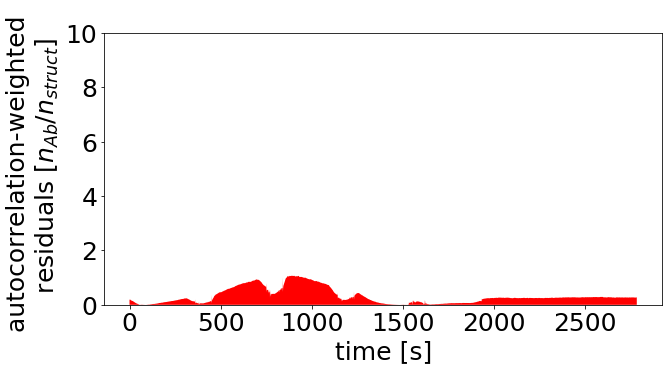

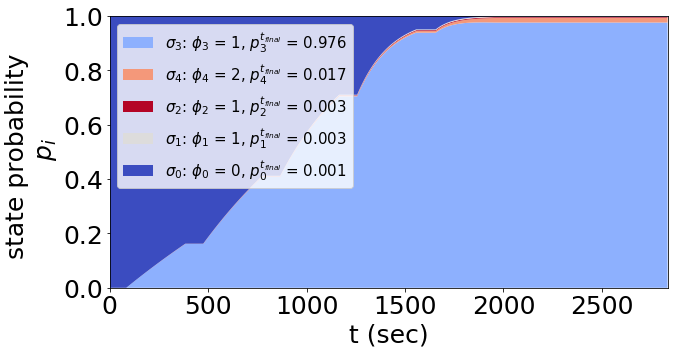

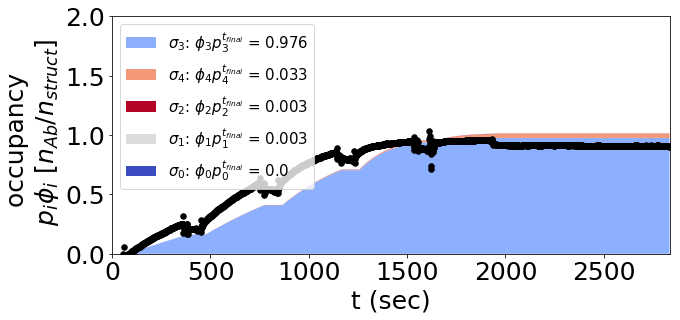

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.49333610e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.17415756]))
basinhopping step 0: f 1023.19
basinhopping step 1: f 1023.19 trial_f 1023.19 accepted 1  lowest_f 1023.19
found new global minimum on step 1 with function value 1023.19
('Dig_Mouse_7nm_repeat2', [-2.5222824683425835, 1.247643851651151])


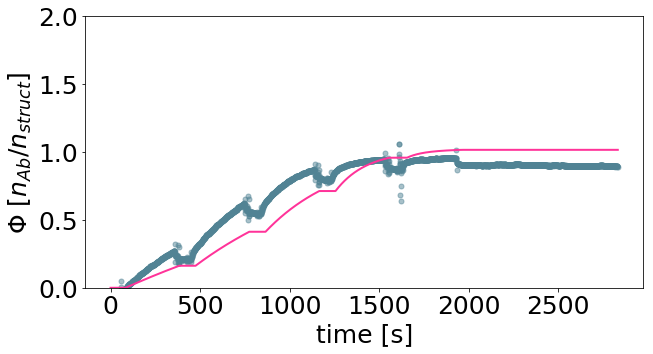

[3.00412176e-03 1.76865795e+01]


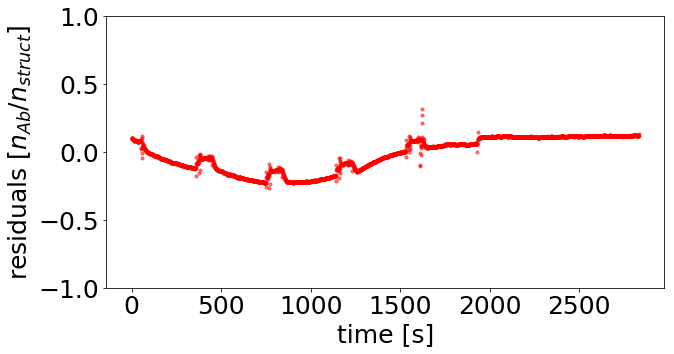

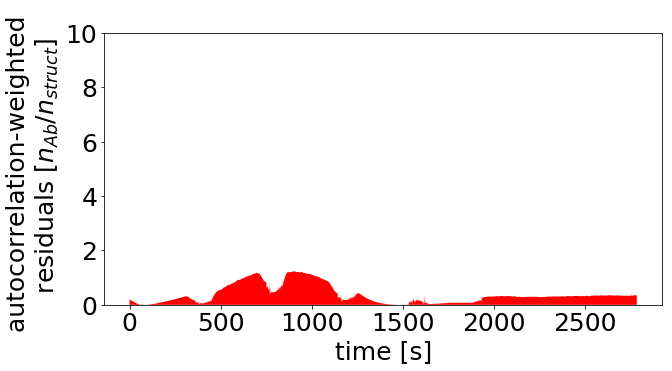

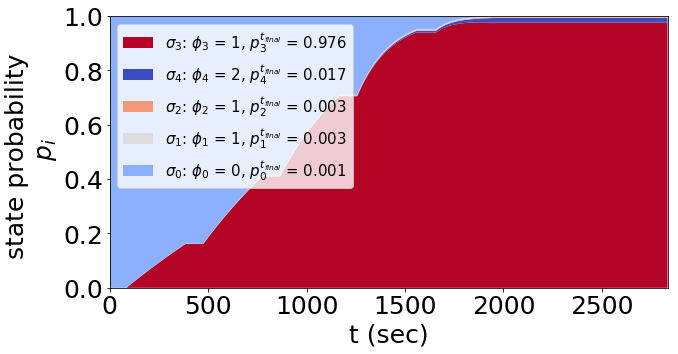

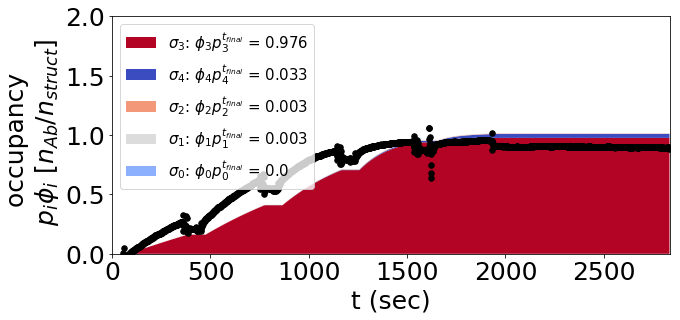

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.37528538e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.13839283]))
basinhopping step 0: f 1247.82
basinhopping step 1: f 1247.82 trial_f 1247.82 accepted 1  lowest_f 1247.82
('Dig_Mouse_14nm_repeat1', [-2.5245381519855687, 1.1902119277618983])


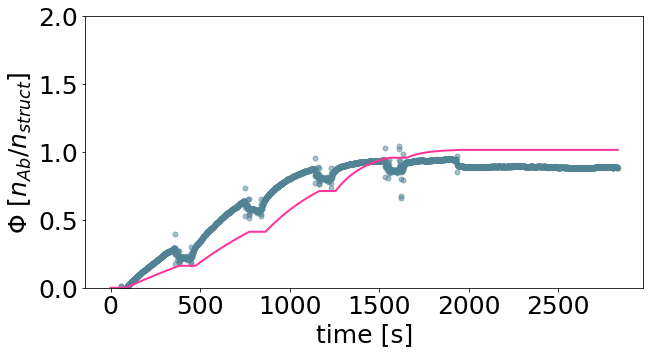

[2.9885591e-03 1.5495726e+01]


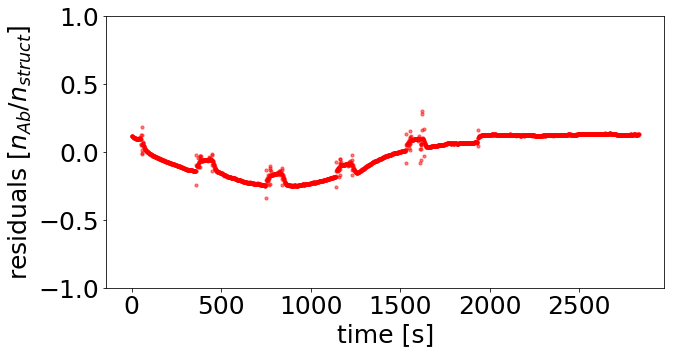

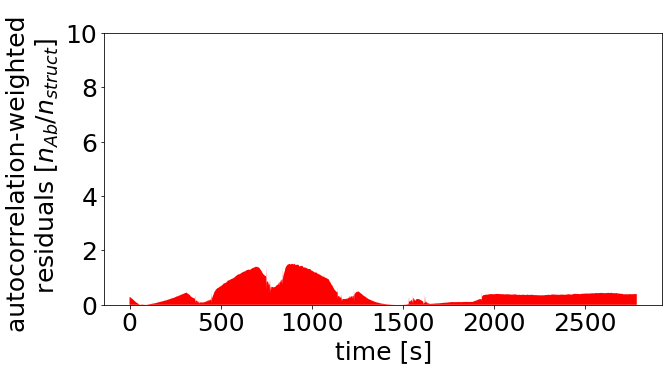

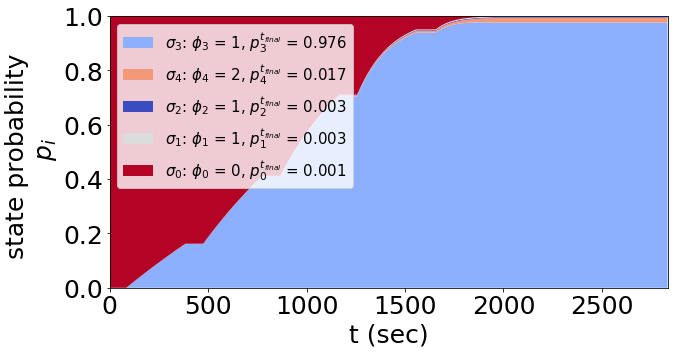

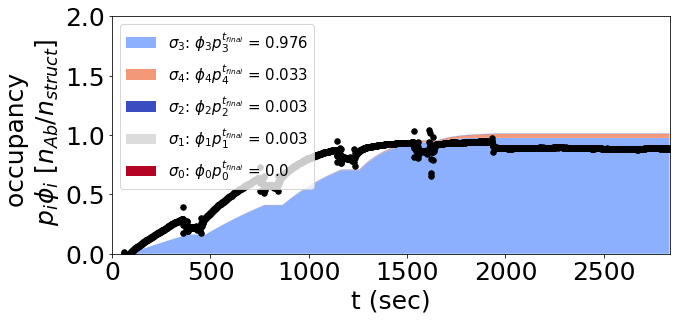

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.38386170e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.14109269]))
basinhopping step 0: f 1407.99
basinhopping step 1: f 1407.99 trial_f 1407.99 accepted 1  lowest_f 1407.99
found new global minimum on step 1 with function value 1407.99
('Dig_Mouse_14nm_repeat2', [-2.523193143340912, 1.273368798948119])


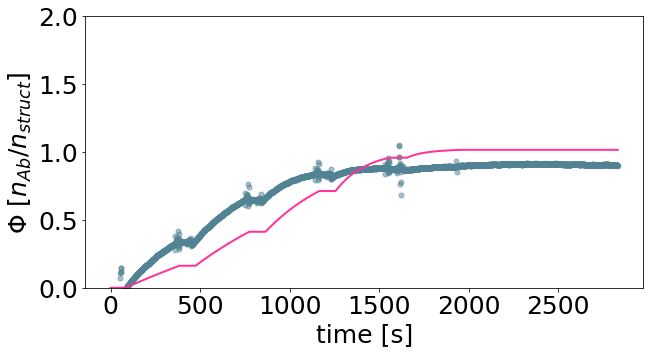

[2.99782900e-03 1.87658741e+01]


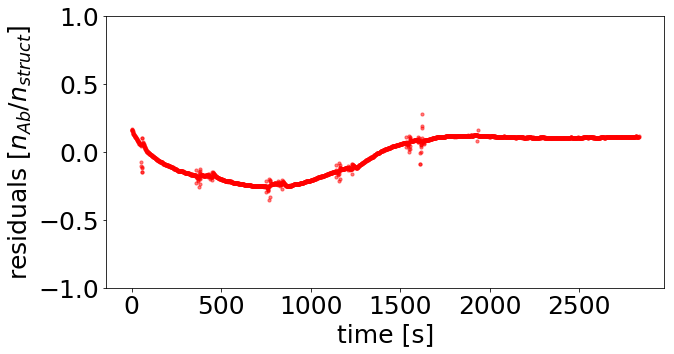

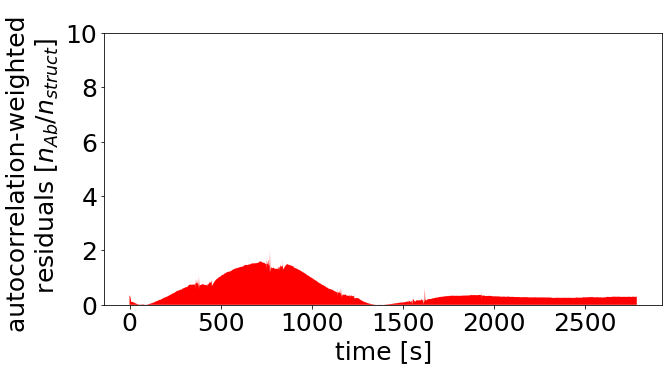

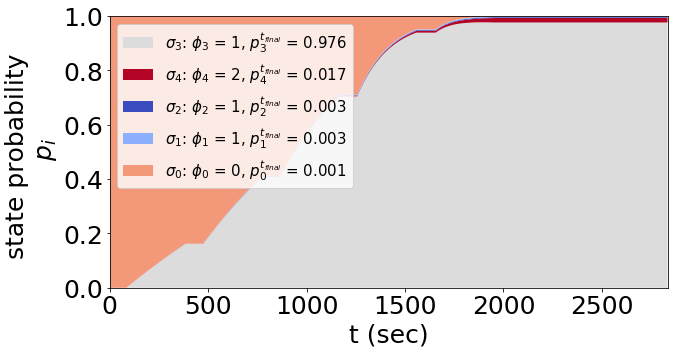

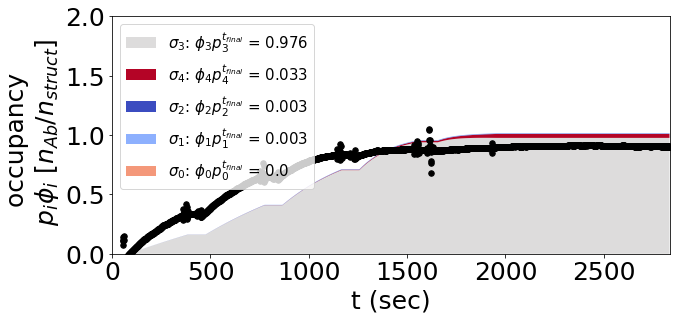

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.34248394e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.1279091 ]))
basinhopping step 0: f 1321.8
basinhopping step 1: f 1321.8 trial_f 1321.8 accepted 1  lowest_f 1321.8
('Dig_Mouse_16nm_repeat2', [-2.5245447376555776, 1.1840286950389927])


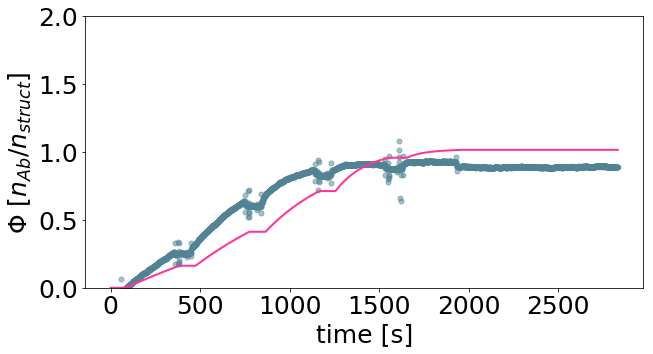

[2.98851378e-03 1.52766699e+01]


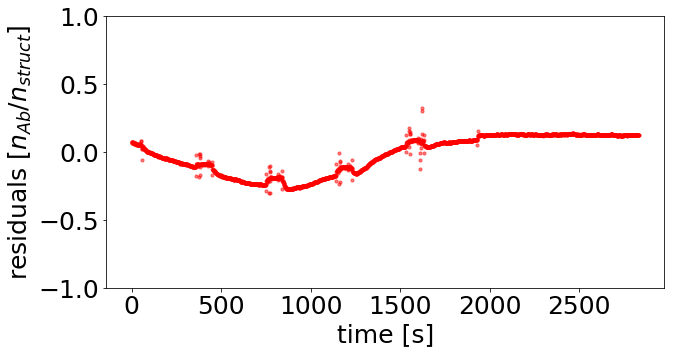

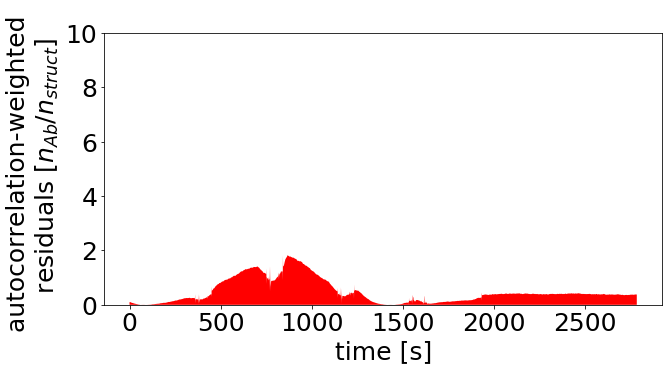

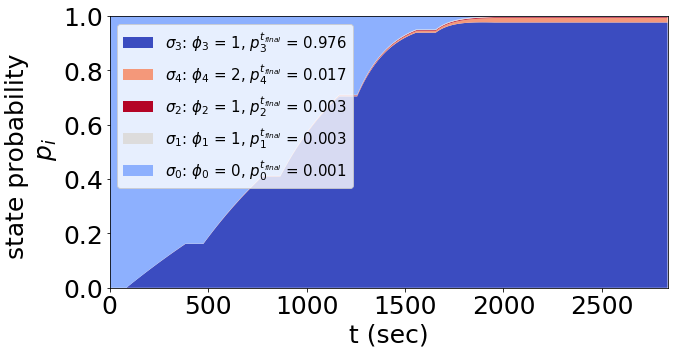

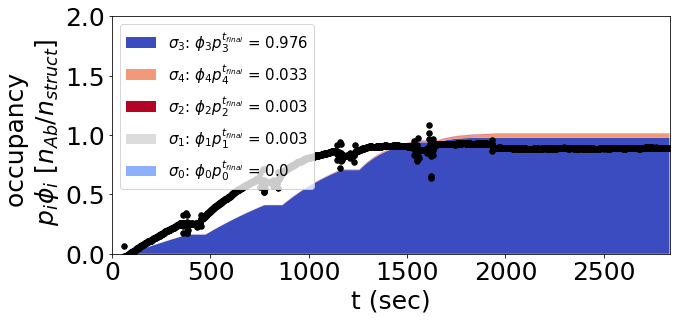

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.48746407e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.17244648]))
basinhopping step 0: f 262.991
basinhopping step 1: f 262.991 trial_f 262.991 accepted 1  lowest_f 262.991
found new global minimum on step 1 with function value 262.991
('Dig_Mouse_17nm_repeat1', [-2.511377534291363, 1.1214170311949596])


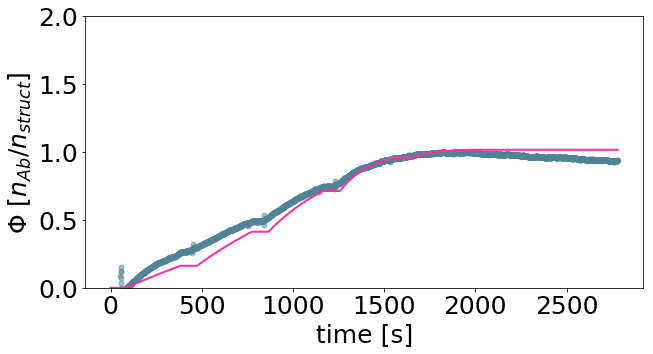

[3.08050888e-03 1.32256502e+01]


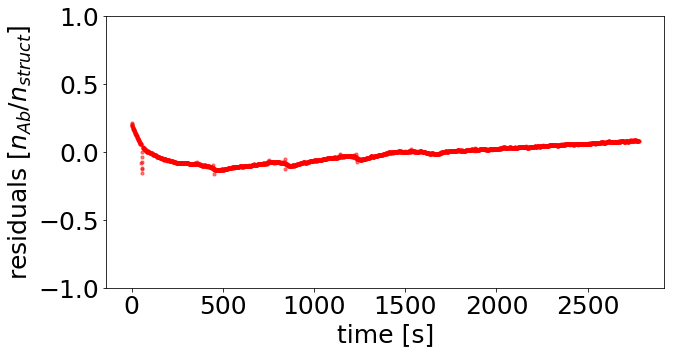

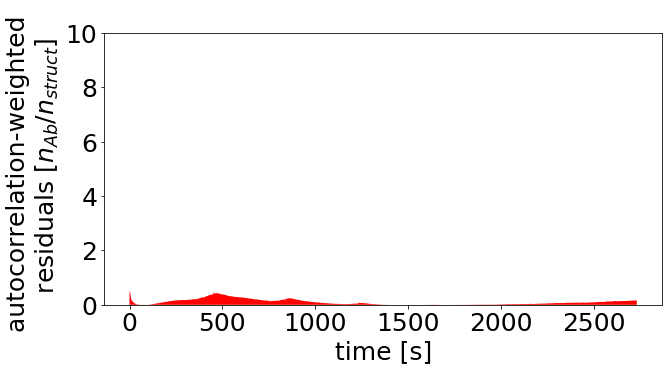

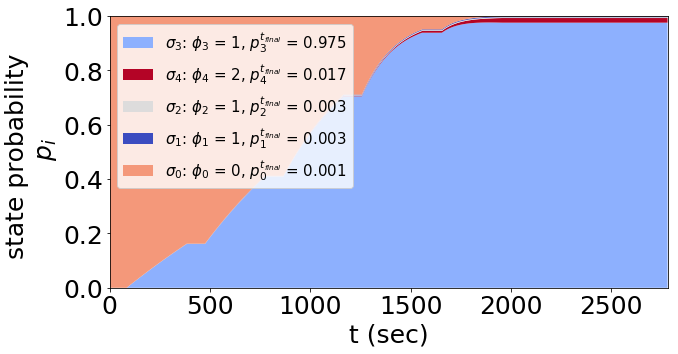

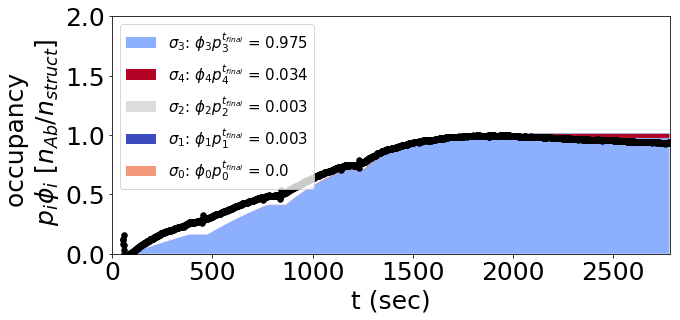

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.45126357e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.16174629]))
basinhopping step 0: f 338.453
basinhopping step 1: f 338.453 trial_f 338.453 accepted 1  lowest_f 338.453
found new global minimum on step 1 with function value 338.453
('Dig_Mouse_17nm_repeat2', [-2.513393055919358, 1.1182933688179941])


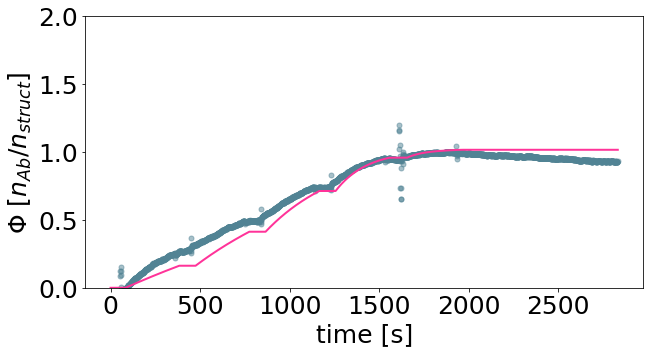

[3.06624564e-03 1.31308660e+01]


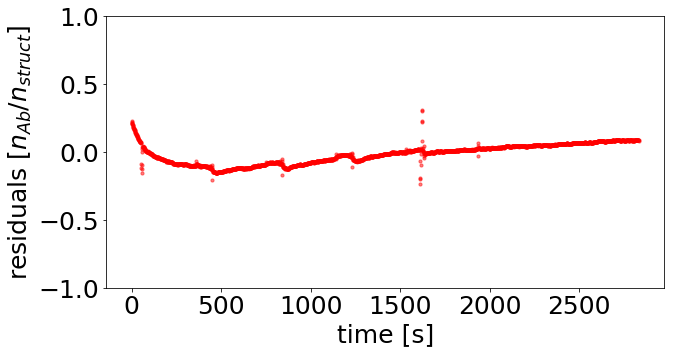

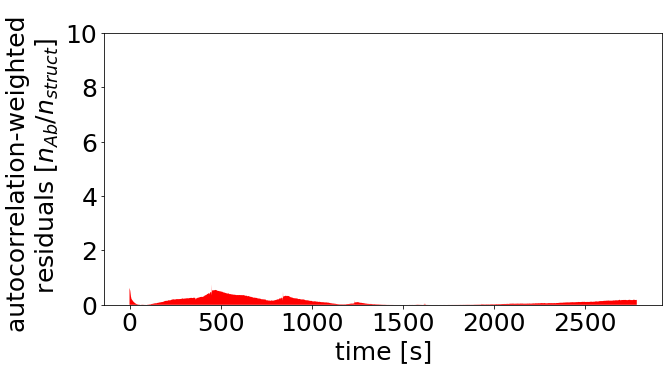

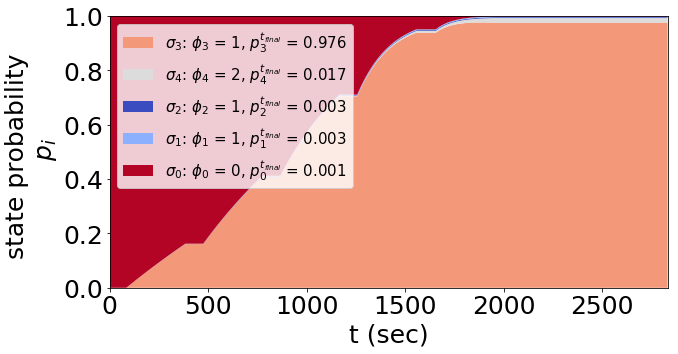

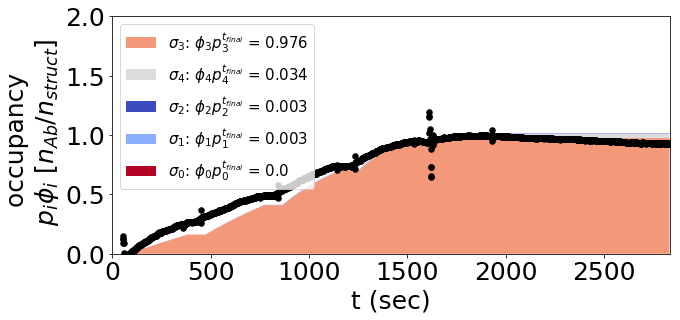

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.75956961e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.24540645]))
basinhopping step 0: f 48.2796
basinhopping step 1: f 48.2796 trial_f 48.2796 accepted 1  lowest_f 48.2796
('Dig_Mouse_21nm_repeat1', [-2.541680533712593, 1.391316929018661])


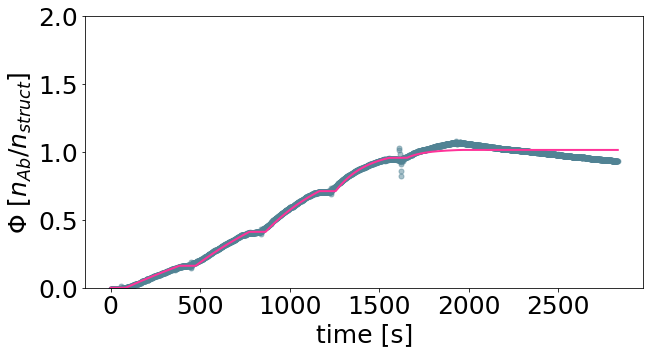

[2.87289310e-03 2.46216373e+01]


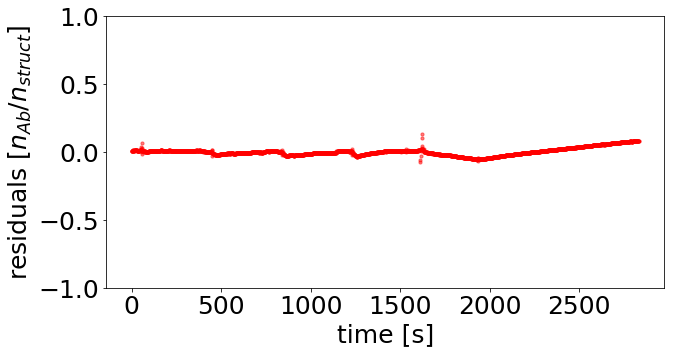

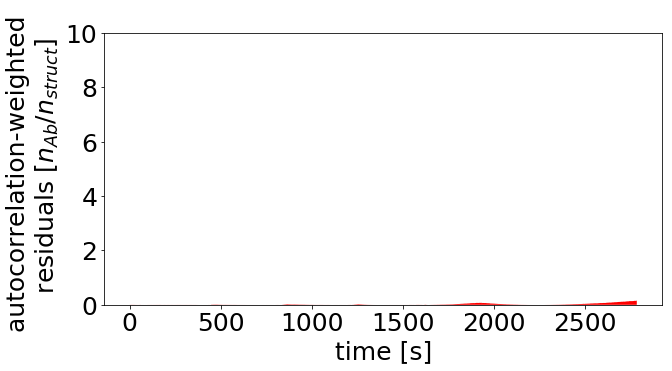

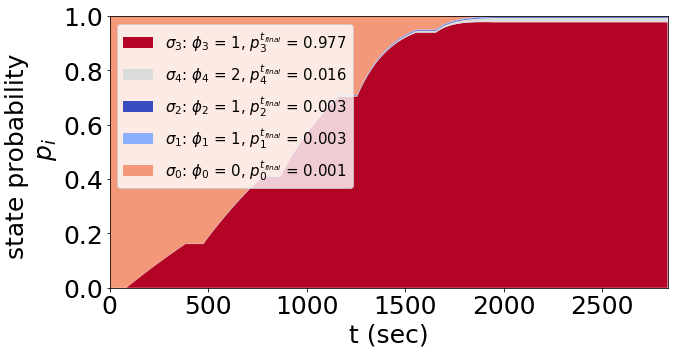

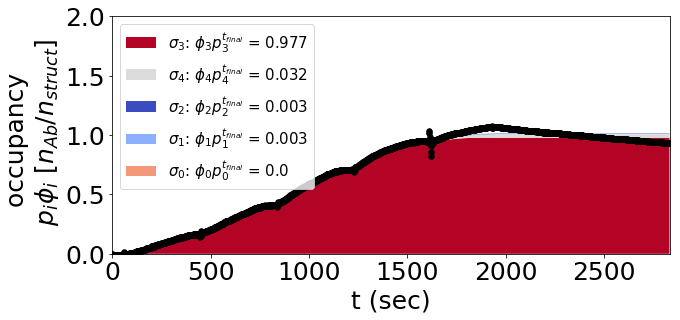

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.43169679e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.15585105]))
basinhopping step 0: f 38.0609
basinhopping step 1: f 38.0609 trial_f 38.0609 accepted 1  lowest_f 38.0609
('Dig_Mouse_21nm_repeat2', [-2.4887097067223682, 1.4049546616096242])


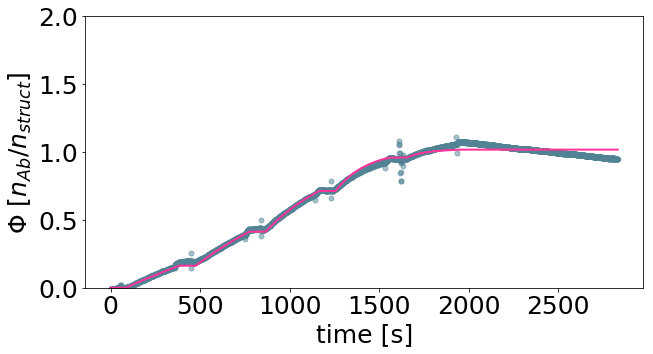

[3.24556487e-03 2.54070745e+01]


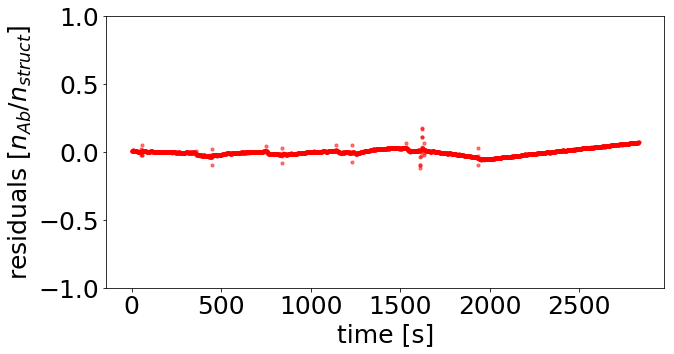

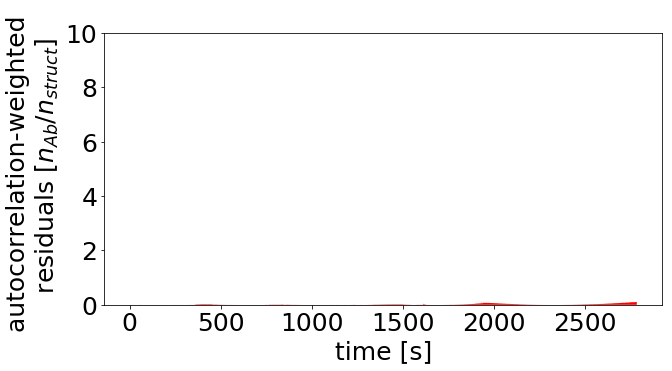

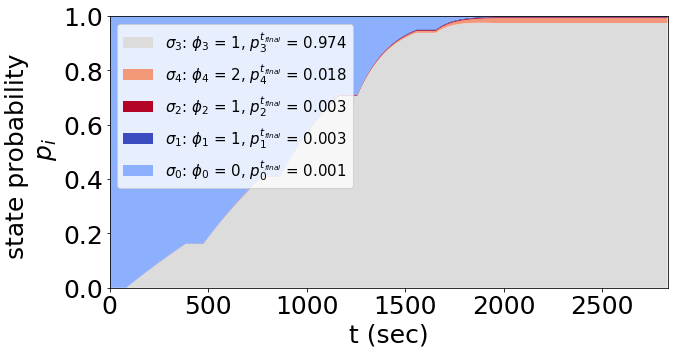

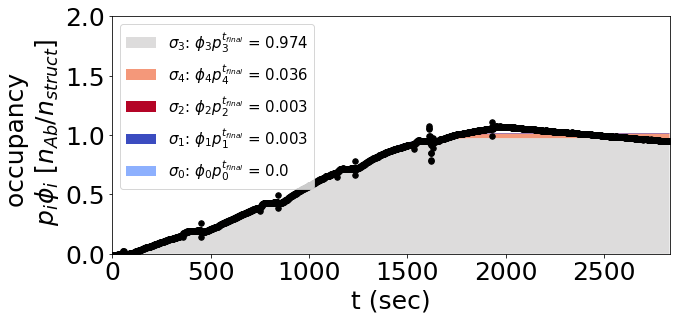

[array([-2.51490382,  1.17574184]), array([-2.52046794,  1.26554596]), array([-2.52228247,  1.24764385]), array([-2.52453815,  1.19021193]), array([-2.52319314,  1.2733688 ]), array([-2.52454474,  1.1840287 ]), array([-2.51137753,  1.12141703]), array([-2.51339306,  1.11829337]), array([-2.54168053,  1.39131693]), array([-2.48870971,  1.40495466])]
xopt_compilation for monobiv, bivmono, norm_const is:
[array([-2.51490382,  1.17574184]), array([-2.52046794,  1.26554596]), array([-2.52228247,  1.24764385]), array([-2.52453815,  1.19021193]), array([-2.52319314,  1.2733688 ]), array([-2.52454474,  1.1840287 ]), array([-2.51137753,  1.12141703]), array([-2.51339306,  1.11829337]), array([-2.54168053,  1.39131693]), array([-2.48870971,  1.40495466])]


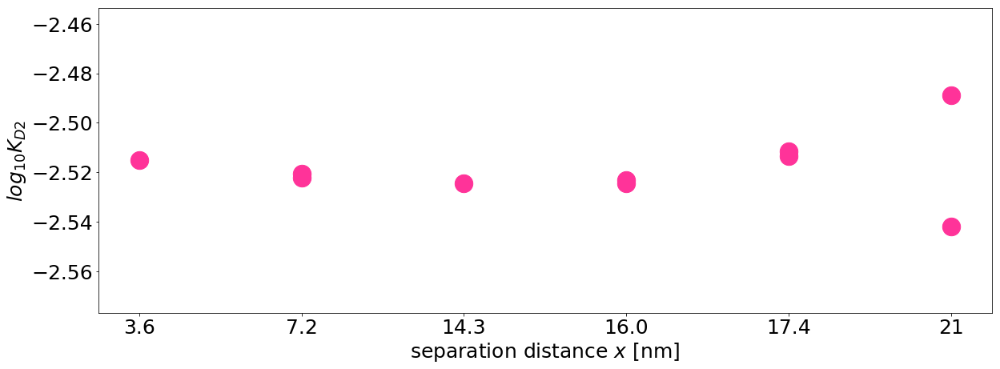

In [28]:

imp.reload(mk)

output_directory = master_name+"/output_spat_tol_function_fitting_lower95"
if not os.path.exists(output_directory):
            os.makedirs(output_directory)

origami_alpha = mk.Fitting(
    run_list = run_list_biv, 
    run_type = "biv", 
    mono_rates =  np.array([k_on_glower95, k_off_glower95]),
    KD_biv = KD_biv,
    concentrations = concentrations, 
    time_points = time_points, 
    scaling_constant = None, #18.31222
    output_dir = output_directory,
      struct_params = ['data_directory/Dig_distances_Mouse/',RstrRmax_slope, RstrRmax_interc],
      data_dir ='data_directory/Dig_distances_Mouse/' )
origami_alpha.set_bounds(((-3,3),(np.log10(18.31222-10),np.log10(18.31222+10))))
xopt_compilation_lower95 = origami_alpha.fit_annealing(fitting_number = len(run_list_biv))
print("xopt_compilation for monobiv, bivmono, norm_const is:")
print(xopt_compilation_lower95)


plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25) 
plt.rcParams.update({'font.size': 25})
plt.figure(figsize=(20,7))
plt.scatter(run_list_biv.T[2], np.array(xopt_compilation_lower95).T[0], alpha = 1, s = 500,c="#ff3399")
plt.ylabel("$log_{10}K_{D2}$")
plt.xlabel("separation distance $x$ [nm]")
plt.savefig(output_directory+"/ spat_tol_function_fitting.svg")
plt.show()
plt.close()


# pkl.dump([origami_alpha,  xopt_compilation_lower95,output_directory
#          ], open(master_name+'/pickle_directory/spat_tol_function_fitting.pickle', 'wb'))

# Alpha function fitting - with K_D - based on lower68 KD1

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.37636521e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.13873369]))
basinhopping step 0: f 62.0592
basinhopping step 1: f 62.0592 trial_f 62.0592 accepted 1  lowest_f 62.0592
('Dig_Mouse_3nm_repeat2', [-2.735762028575772, 1.1595666483989935])


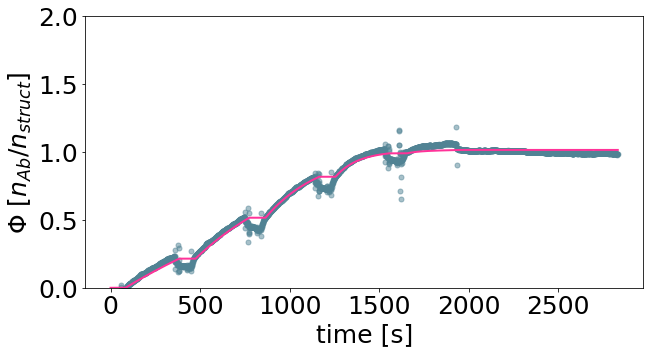

[1.83754495e-03 1.44399819e+01]


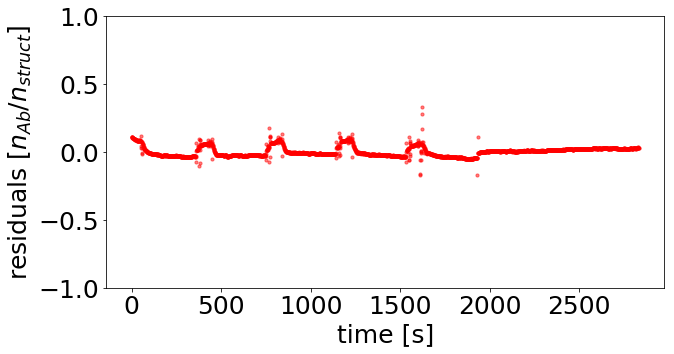

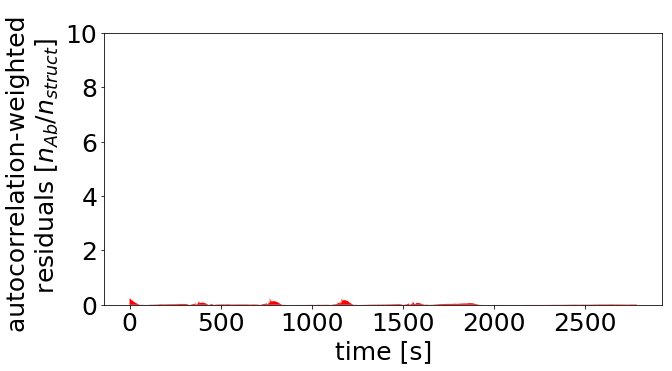

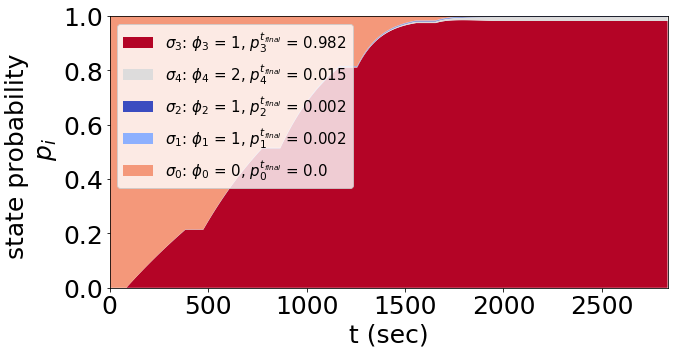

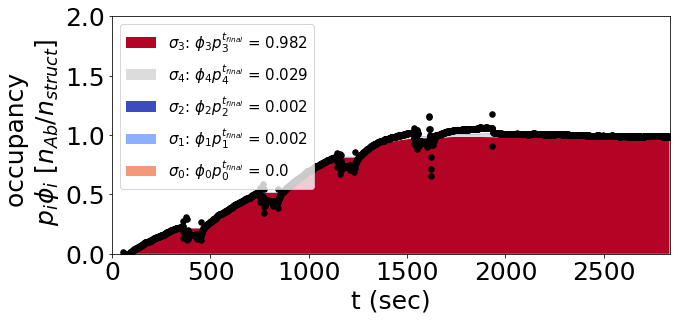

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.52029428e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.18192766]))
basinhopping step 0: f 227.309
basinhopping step 1: f 227.309 trial_f 227.309 accepted 1  lowest_f 227.309
('Dig_Mouse_7nm_repeat1', [-2.5435629054367808, 1.238824760559977])


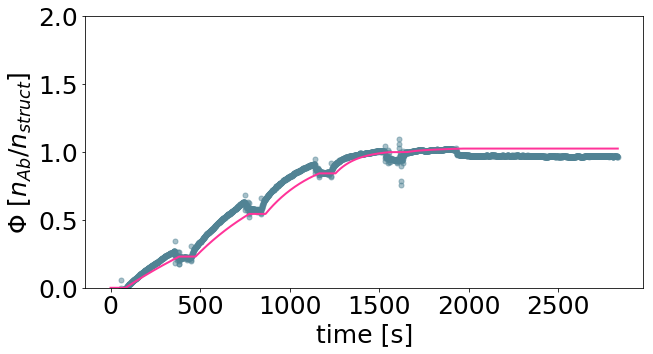

[2.86046801e-03 1.73310454e+01]


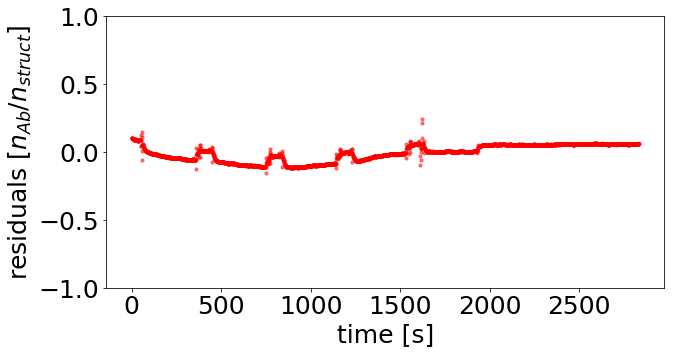

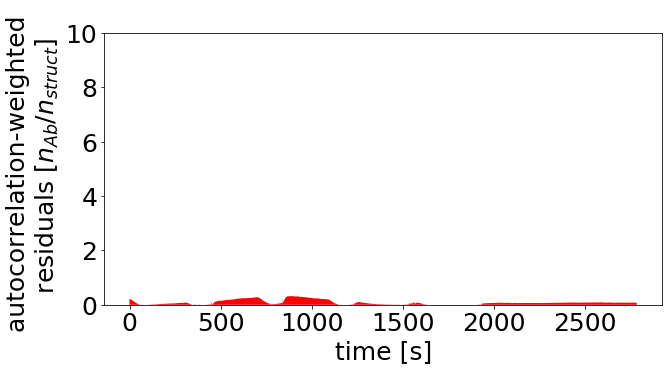

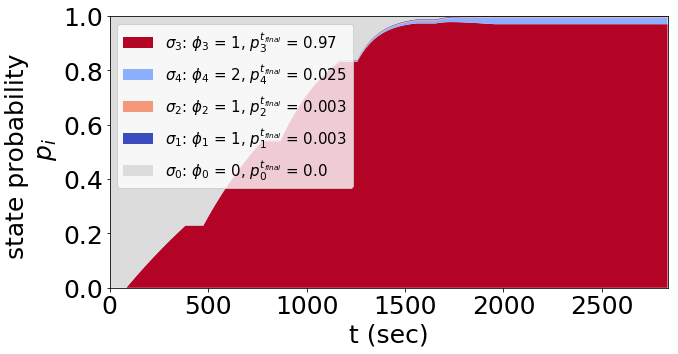

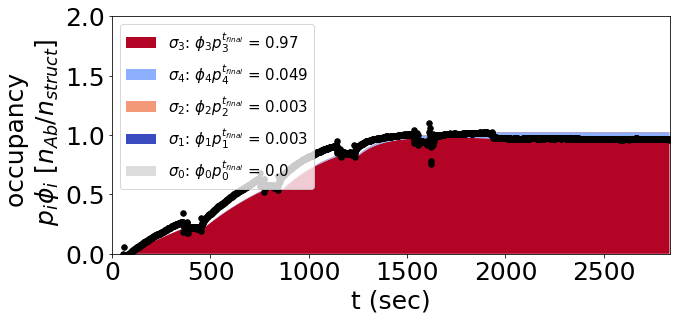

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.49333610e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.17415756]))
basinhopping step 0: f 321.91
basinhopping step 1: f 321.91 trial_f 321.91 accepted 1  lowest_f 321.91
('Dig_Mouse_7nm_repeat2', [-2.5439762996170296, 1.2203778406539187])


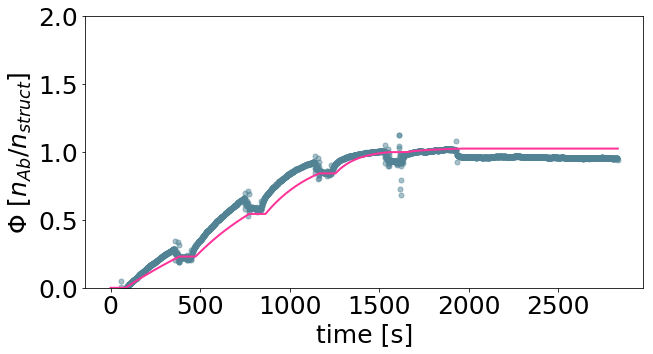

[2.85774649e-03 1.66103139e+01]


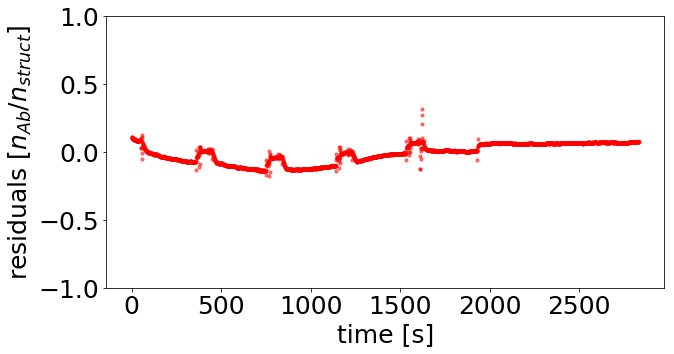

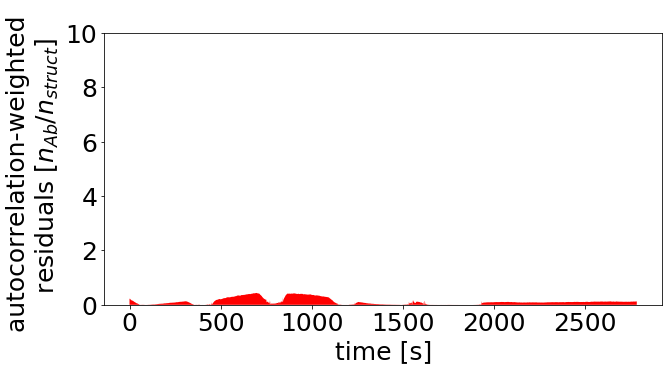

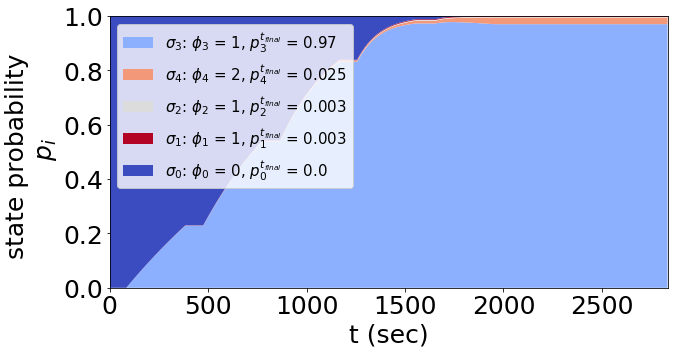

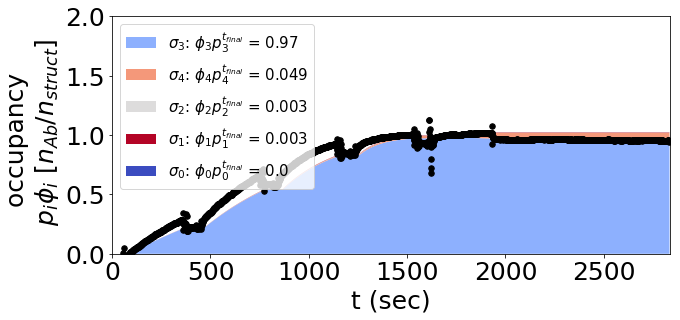

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.37528538e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.13839283]))
basinhopping step 0: f 458.729
basinhopping step 1: f 458.729 trial_f 458.729 accepted 1  lowest_f 458.729
found new global minimum on step 1 with function value 458.729
('Dig_Mouse_14nm_repeat1', [-2.5450592017346776, 1.1628735487560664])


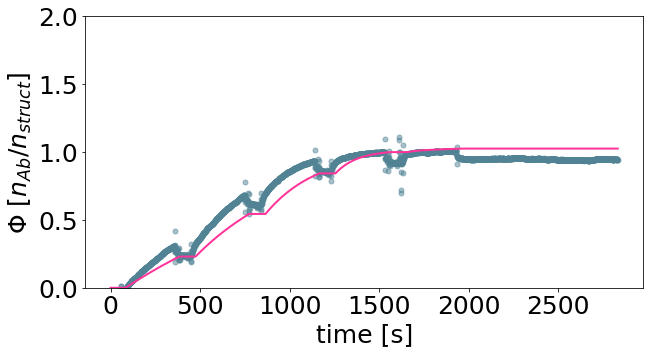

[2.85062965e-03 1.45503536e+01]


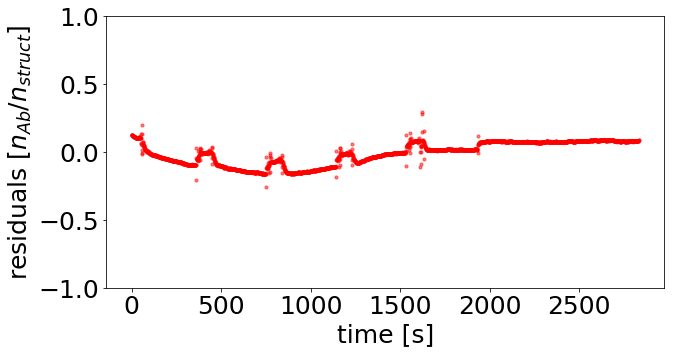

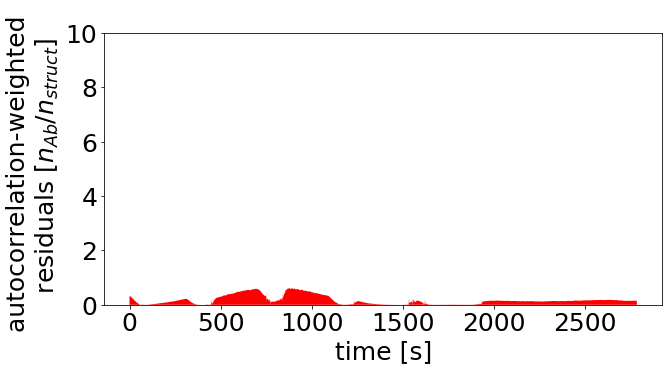

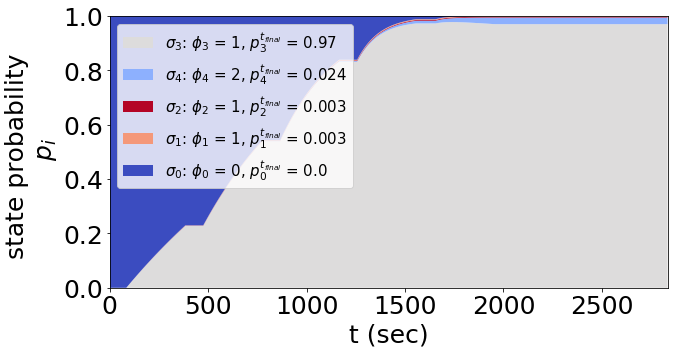

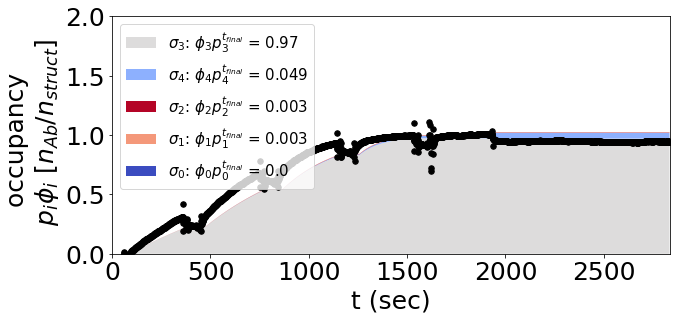

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.38386170e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.14109269]))
basinhopping step 0: f 578.938
basinhopping step 1: f 578.938 trial_f 578.938 accepted 1  lowest_f 578.938
found new global minimum on step 1 with function value 578.938
('Dig_Mouse_14nm_repeat2', [-2.5346609810203504, 1.2452368157289748])


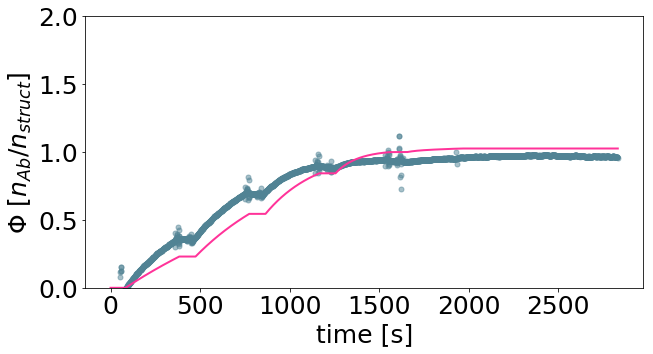

[2.91970531e-03 1.75888245e+01]


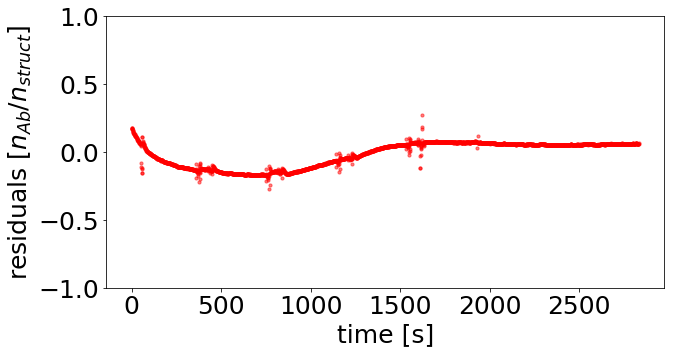

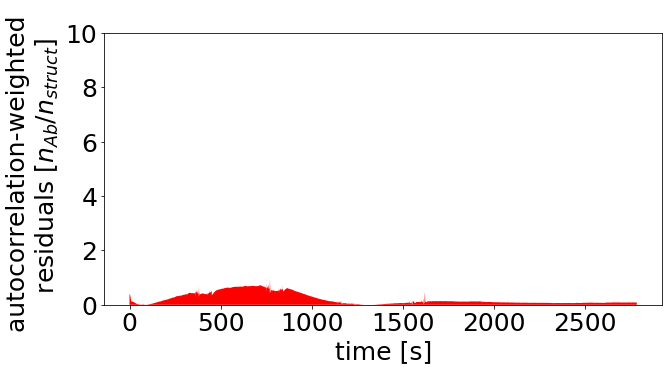

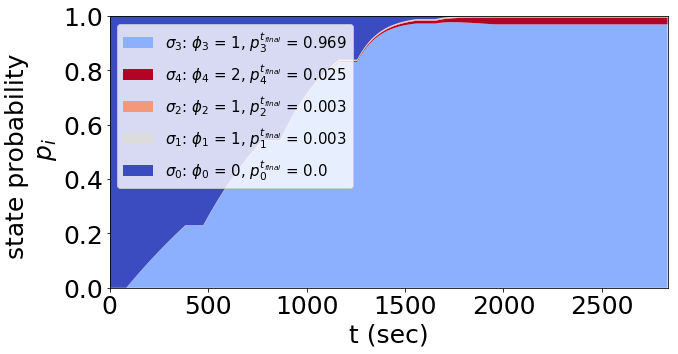

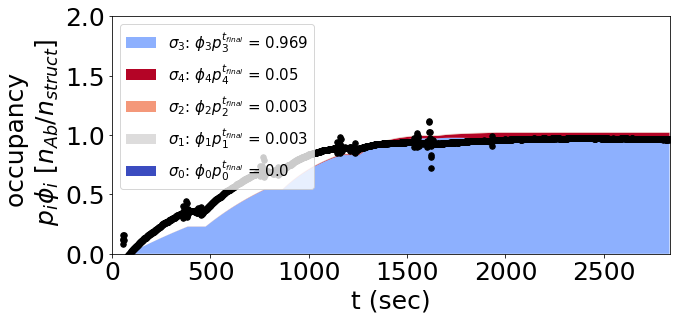

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.34248394e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.1279091 ]))
basinhopping step 0: f 495.275
basinhopping step 1: f 495.275 trial_f 495.275 accepted 1  lowest_f 495.275
('Dig_Mouse_16nm_repeat2', [-2.542911140405693, 1.1560899048215136])


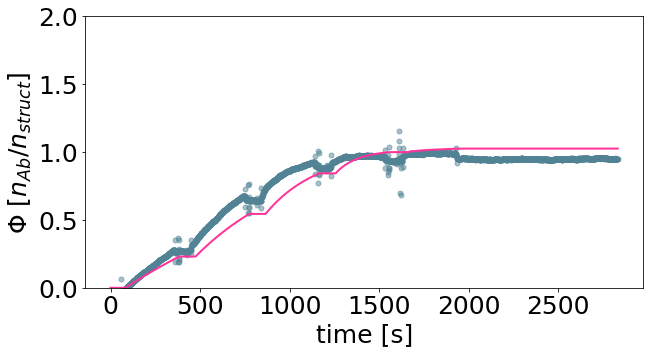

[2.86476406e-03 1.43248441e+01]


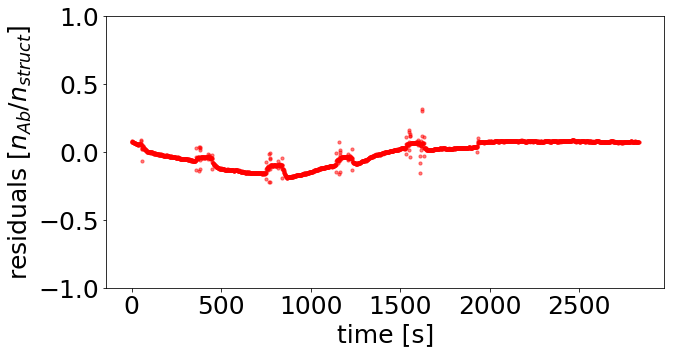

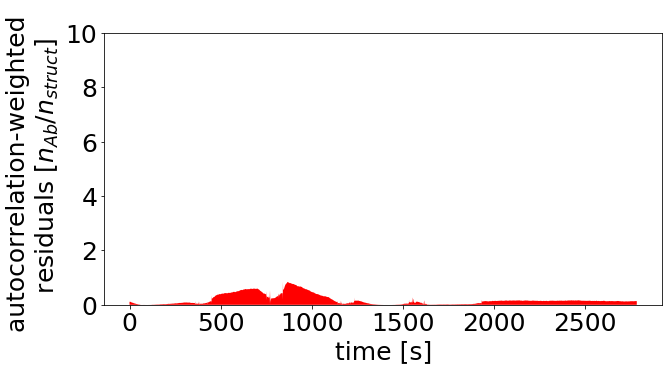

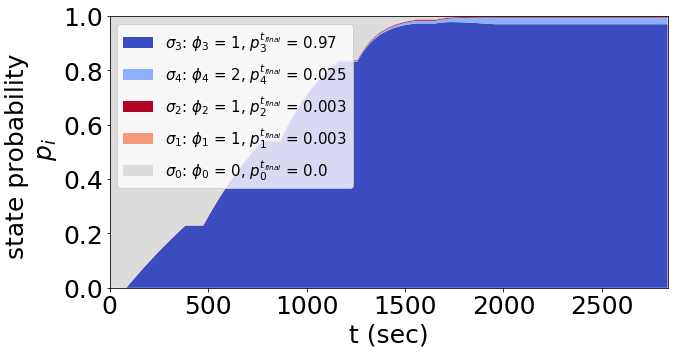

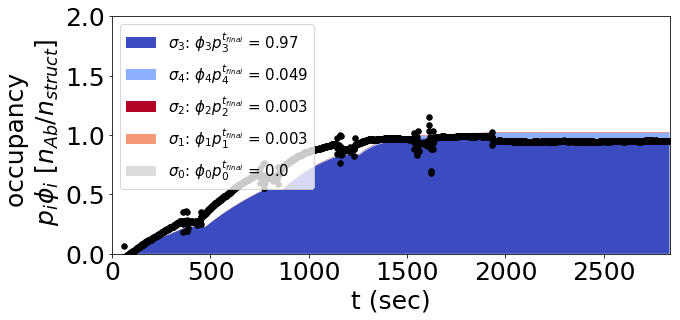

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.48746407e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.17244648]))
basinhopping step 0: f 70.3487
basinhopping step 1: f 70.3487 trial_f 71.7414 accepted 0  lowest_f 70.3487
('Dig_Mouse_17nm_repeat1', [-2.6849408628867213, 1.1012028865270795])


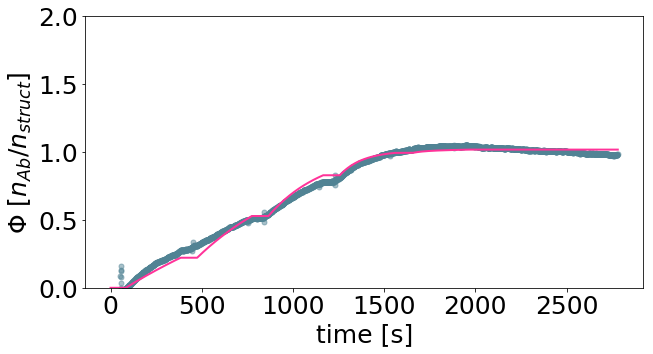

[2.06566141e-03 1.26241715e+01]


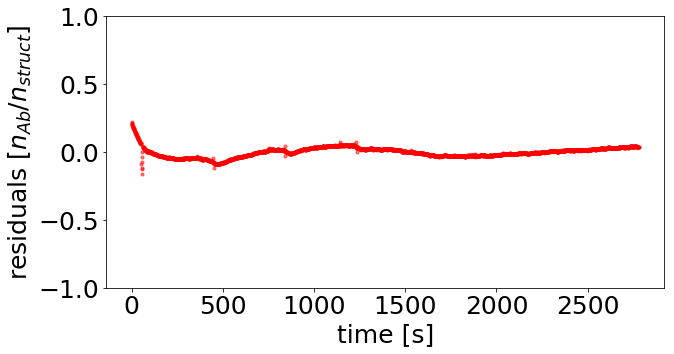

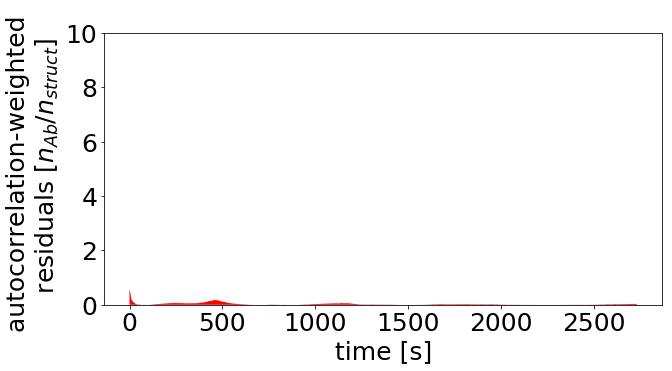

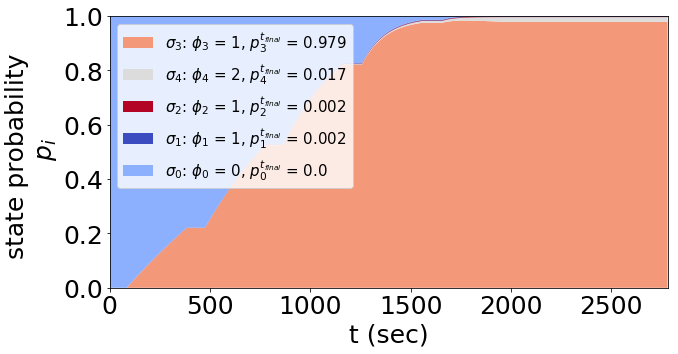

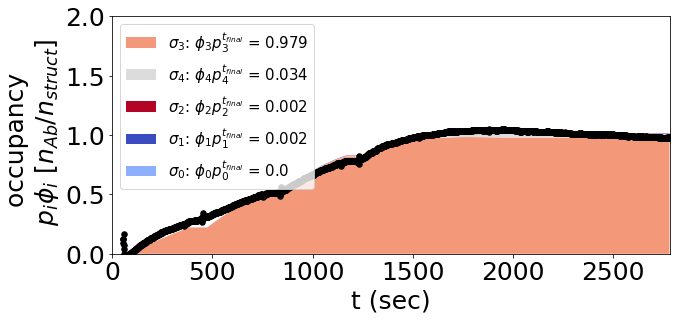

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.45126357e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.16174629]))
basinhopping step 0: f 85.2346
basinhopping step 1: f 85.2346 trial_f 85.2346 accepted 1  lowest_f 85.2346
('Dig_Mouse_17nm_repeat2', [-2.551083600016199, 1.0942706725426494])


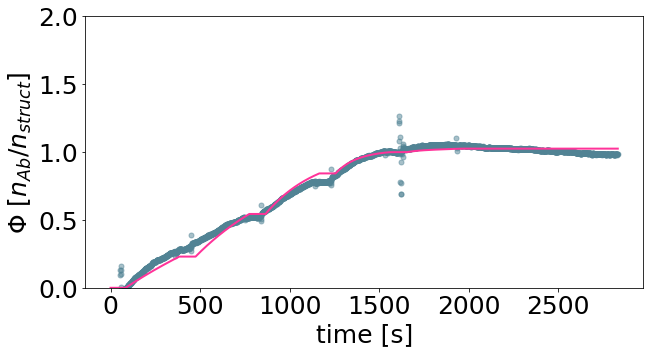

[2.8113596e-03 1.2424264e+01]


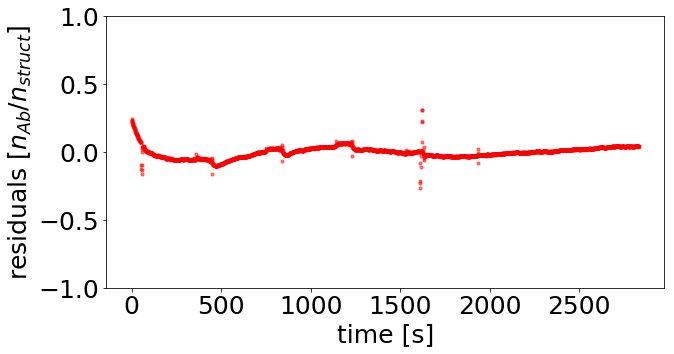

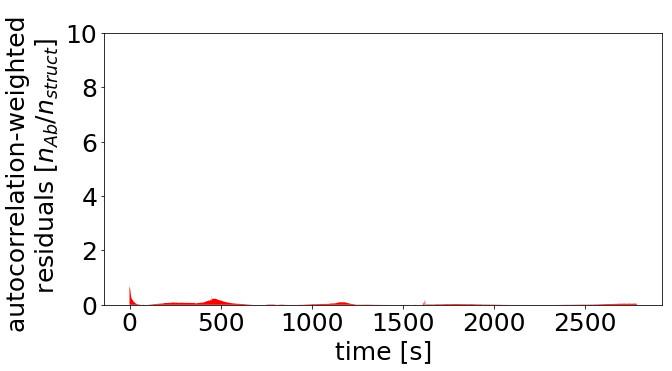

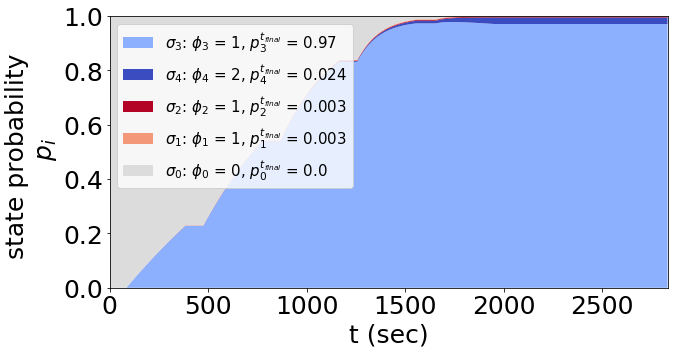

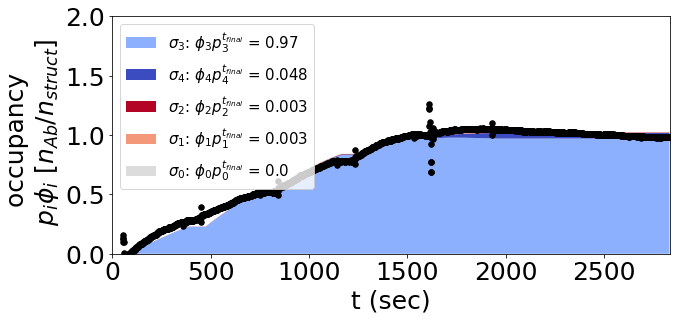

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.75956961e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.24540645]))
basinhopping step 0: f 151.927
basinhopping step 1: f 151.927 trial_f 151.927 accepted 1  lowest_f 151.927
found new global minimum on step 1 with function value 151.927
('Dig_Mouse_21nm_repeat1', [-1.5708726805825581, 1.3197019029441528])


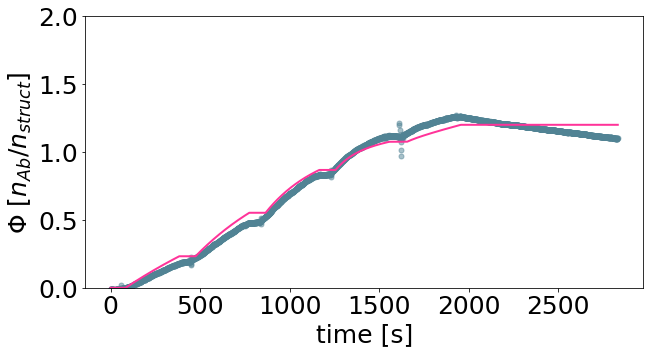

[ 0.02686132 20.87862543]


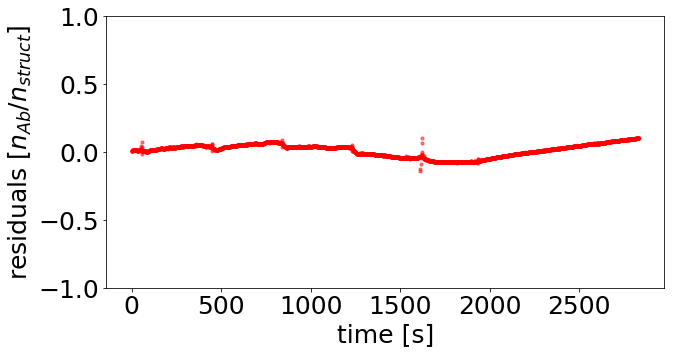

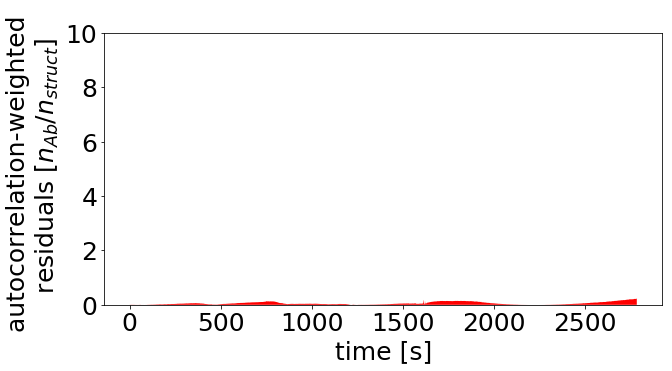

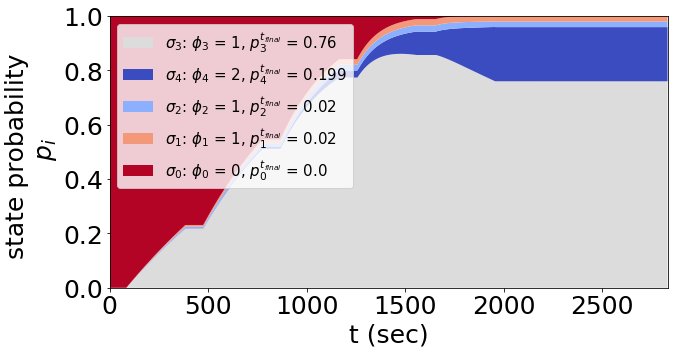

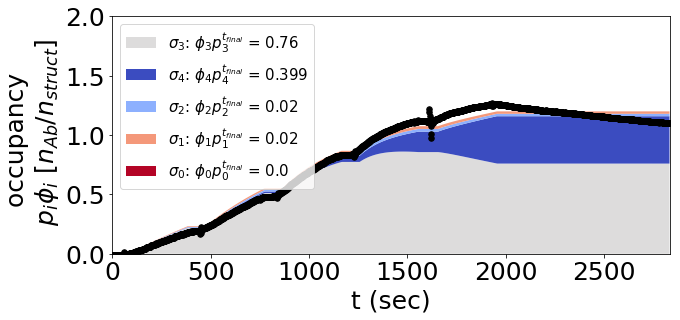

('(fit_annealing) variable parameter: ', array([2.78933584e-07, 1.43169679e+01]), 'log10 variable parameter: ', array([-6.55449919,  1.15585105]))
basinhopping step 0: f 105.72
basinhopping step 1: f 105.72 trial_f 105.72 accepted 1  lowest_f 105.72
('Dig_Mouse_21nm_repeat2', [-1.4711696091197446, 1.323040437639952])


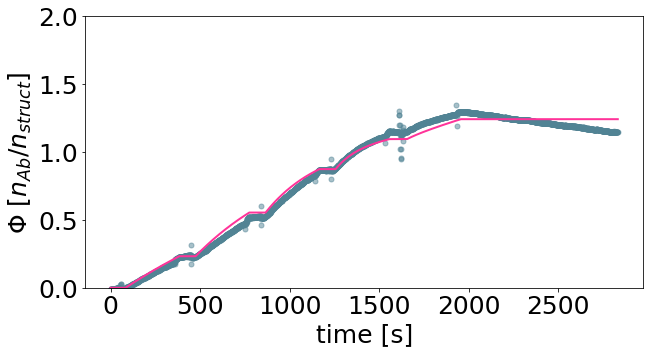

[ 0.03379328 21.03974334]


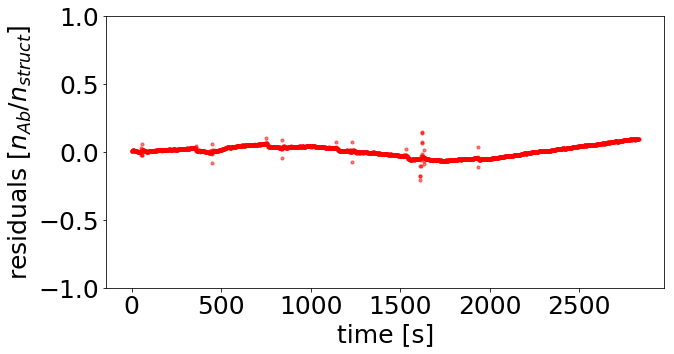

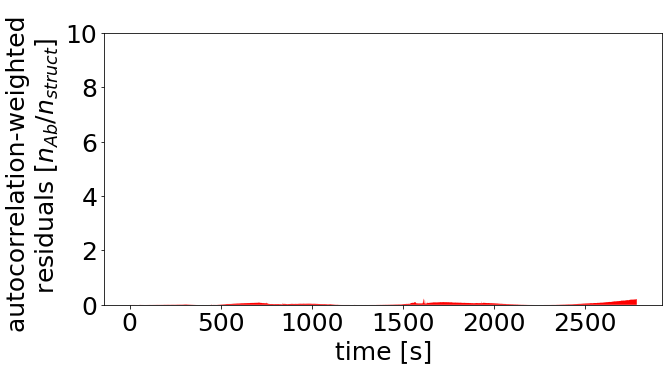

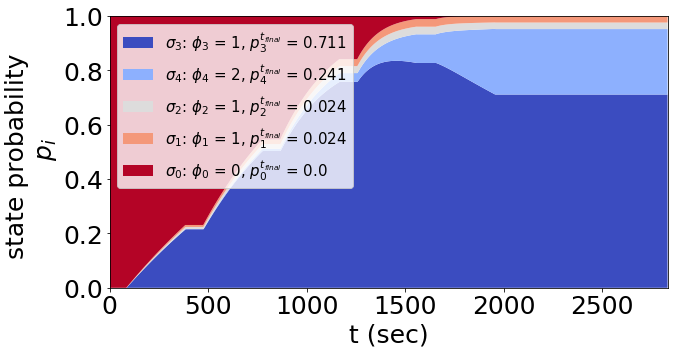

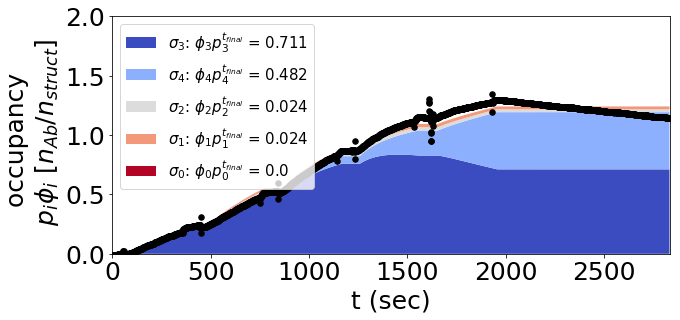

[array([-2.73576203,  1.15956665]), array([-2.54356291,  1.23882476]), array([-2.5439763 ,  1.22037784]), array([-2.5450592 ,  1.16287355]), array([-2.53466098,  1.24523682]), array([-2.54291114,  1.1560899 ]), array([-2.68494086,  1.10120289]), array([-2.5510836 ,  1.09427067]), array([-1.57087268,  1.3197019 ]), array([-1.47116961,  1.32304044])]
xopt_compilation for monobiv, bivmono, norm_const is:
[array([-2.73576203,  1.15956665]), array([-2.54356291,  1.23882476]), array([-2.5439763 ,  1.22037784]), array([-2.5450592 ,  1.16287355]), array([-2.53466098,  1.24523682]), array([-2.54291114,  1.1560899 ]), array([-2.68494086,  1.10120289]), array([-2.5510836 ,  1.09427067]), array([-1.57087268,  1.3197019 ]), array([-1.47116961,  1.32304044])]


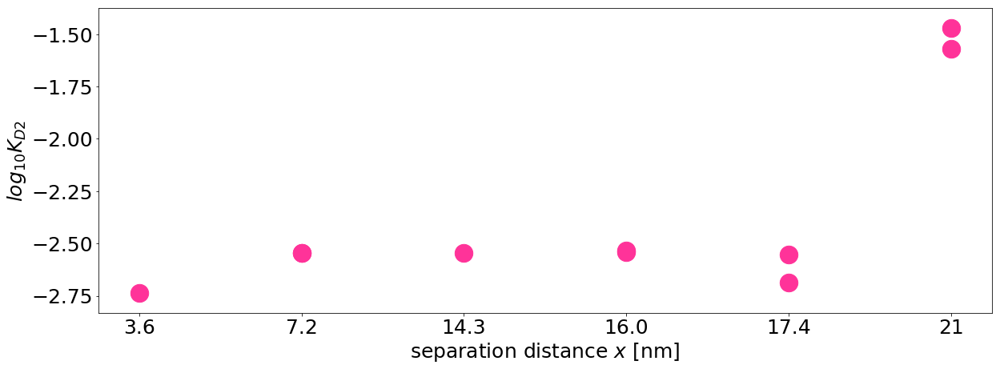

In [29]:

imp.reload(mk)

output_directory = master_name+"/output_spat_tol_function_fitting_lower68"
if not os.path.exists(output_directory):
            os.makedirs(output_directory)

origami_alpha = mk.Fitting(
    run_list = run_list_biv, 
    run_type = "biv", 
    mono_rates =  np.array([k_on_glower68, k_off_glower68]),
    KD_biv = KD_biv,
    concentrations = concentrations, 
    time_points = time_points, 
    scaling_constant = None, #18.31222
    output_dir = output_directory,
      struct_params = ['data_directory/Dig_distances_Mouse/',RstrRmax_slope, RstrRmax_interc],
      data_dir ='data_directory/Dig_distances_Mouse/' )
origami_alpha.set_bounds(((-3,3),(np.log10(18.31222-10),np.log10(18.31222+10))))
xopt_compilation_lower68 = origami_alpha.fit_annealing(fitting_number = len(run_list_biv))
print("xopt_compilation for monobiv, bivmono, norm_const is:")
print(xopt_compilation_lower68)


plt.rc('xtick', labelsize=25) 
plt.rc('ytick', labelsize=25) 
plt.rcParams.update({'font.size': 25})
plt.figure(figsize=(20,7))
plt.scatter(run_list_biv.T[2], np.array(xopt_compilation_lower68).T[0], alpha = 1, s = 500,c="#ff3399")
plt.ylabel("$log_{10}K_{D2}$")
plt.xlabel("separation distance $x$ [nm]")
plt.savefig(output_directory+"/ spat_tol_function_fitting.svg")
plt.show()
plt.close()


# pkl.dump([origami_alpha,  xopt_compilation_lower68,output_directory
#          ], open(master_name+'/pickle_directory/spat_tol_function_fitting.pickle', 'wb'))

## apparent binding constants - using analytical conversion from the markov KD2 - upper 95 KD1 input

8.97
[21.25205541  0.426       1.42        0.426       0.426     ]


$${\huge K_{D2} = \frac{K_{D2}^{max}}{1+e^{-\alpha_t (x - \ell_t)}} + K_{D2}^{max}e^{-\alpha_c (x- \ell_c)}  \huge}$$

$${\huge K_{D2} = \frac{0.3}{1+e^{-0.4 (x - 21.3 nm)}} + 0.3e^{-0.4 (x- 1.4 nm)}  \huge}$$

0.43669704644092056


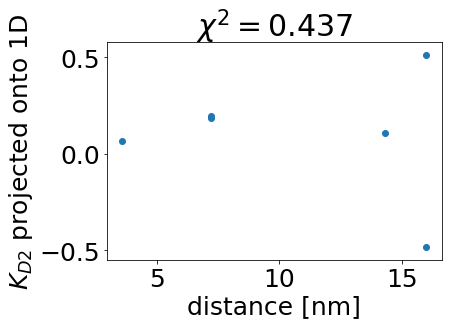

In [32]:
import scipy.optimize as opt
# 24.31276091  0.3         0.4         0.8437887
l_t = 24
alpha_t = .3
l_c = 1
alpha_c= .3
KD2max = .3
global distances
global data
distances = (run_list_biv.T[2]).astype(np.float)[0:]
data = np.array(xopt_compilation_upper95).T[0][0:]
data_upper95 = data

if not os.path.exists("spatol_models"):
            os.makedirs("spatol_models")

variables = [l_t,alpha_t,l_c,alpha_c, KD2max]

def spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances):
    compression = KD2max*np.exp(-1*alpha_c*distances-l_c)
    tension = KD2max/(1+np.exp(-1*alpha_t*(distances-l_t)))
    
    combine = (compression+tension)
    return combine

def compare_alpha_to_data(variables):
    l_t = variables[0]
    alpha_t = variables[1]   
    l_c = variables[2]
    alpha_c= variables[3]
    KD2max= variables[4]
    combine = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances[0:])

    residuals = np.sum(np.abs(combine - np.power(10,data))/(origami_alpha.master_error[:]**0))**2
    
    return residuals
dev = .42
bounds = ((l_t-dev*l_t, l_t+dev*l_t),
          (alpha_t-dev*alpha_t,alpha_t+dev*alpha_t), 
          (l_c-dev*l_c,l_c+dev*l_c),
          (alpha_c-dev*alpha_c, alpha_c+dev*alpha_c), 
         (KD2max-dev*KD2max,KD2max+dev*KD2max))
xopt_dist_function = opt.minimize(compare_alpha_to_data, variables, method="Nelder-Mead")
xopt_dist_function = opt.basinhopping(compare_alpha_to_data, xopt_dist_function.x, 
                        T=.01, stepsize=100, disp=False, niter=400,interval=10,
                       minimizer_kwargs = {"bounds": bounds, "method": "L-BFGS-B"})
# variables = xopt_dist_function.x            
l_t = xopt_dist_function.x[0]
alpha_t = xopt_dist_function.x[1]
l_c = xopt_dist_function.x[2]
alpha_c= xopt_dist_function.x[3]
KD2max= variables[4]


# compression = (compa*(distances/length_scale)**compb)
# stretch = (stretcha*(distances/length_scale)**stretchb)
combine = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances)
residuals = np.abs(combine - data)


distances_fine = np.arange(0,99,.01)
compression_fine = KD2max*np.exp(-1*alpha_c*distances_fine-l_c)
tension_fine = KD2max/(1+np.exp(-1*alpha_t*(distances_fine-l_t)))
combine_fine_upper95 = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances_fine)

# pkl.dump([l_t,alpha_t,l_c,alpha_c,KD2max, distances, data, 
#           bounds, xopt_dist_function, combine, residuals, distances_fine,
#            compression_fine, tension_fine, combine_fine,
#          ], open(master_name+'/pickle_directory/alpha_function_result.pickle', 'wb'))
np.savetxt("spatol_models/spatol"+master_name+".txt",variables)


KD1_upper95 = k_off_upper95/(k_on_upper95*10**9)
KD2 = combine_fine_upper95
KD2_data = np.power(10,data)
# K_Dapp = ((k_on**2)/(k_off**2.) + k_on/(k_off*np.power(10,combine_fine))  + 2.*(k_on/k_off))**-1
# K_Dapp_data = ((k_on**2)/(k_off**2.) + k_on/(k_off*np.power(10,data))  + 2.*(k_on/k_off))**-1

K_Dapp = apparent_KD(KD1_upper95*0.1,KD1_upper95, KD2)
K_Dapp_data = apparent_KD(KD1_upper95*0.1,KD1_upper95, KD2_data)

# plt.rc('xtick', labelsize=25) 
# plt.rc('ytick', labelsize=25) 
# plt.rcParams.update({'font.size': 25})

# plt.figure(figsize=(20,7))
# plt.subplot(131)
# plt.tight_layout()

# plt.plot(distances_fine,compression_fine,c="cyan", linewidth=5)
# plt.title("compress")
# plt.ylabel("contribution to $K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.subplot(132)
# plt.title("tension")
# plt.plot(distances_fine,tension_fine,c="cyan", linewidth=5)
# plt.xlabel("distance [nm]")

# plt.savefig(output_directory+"/ compression_stretch_curves.svg")
# plt.show()
# plt.close()




# plt.figure(figsize=(10,10))
# # plt.plot(distances,combine,c="red")
# plt.title("$K_{D2} = f(x_{biv})$")
# plt.ylabel("$log_{10} K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.scatter(distances,data, alpha = 1, s = 250, c = "#ff3399")
# plt.plot(distances_fine,np.log10(combine_fine),c="cyan", linewidth=5)
# plt.savefig(output_directory+"/ final_alpha_curve_modellogKD2.svg")
# plt.ylim(-3,1)
# plt.show()
# plt.close()

# plt.figure(figsize=(10,10))
# # plt.plot(distances,combine,c="red")
# plt.title("$K_{D2} = f(x_{biv})$")
# plt.ylabel("$K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.scatter(distances,np.power(10,data), alpha = 1, s = 250, c = "#ff3399")
# plt.plot(distances_fine,combine_fine,c="cyan", linewidth=5)
# plt.ylim(0,2)
# plt.savefig(output_directory+"/ final_alpha_curve_modelKD2.svg")
# plt.show()
# plt.close()

# plt.figure(figsize=(10,10))
# # plt.plot(distances,combine,c="red")
# plt.title("$K_{Dapp} = f(x_{biv})$")
# plt.ylabel("$K_{Dapp}$")
# plt.xlabel("distance [nm]")
# plt.plot(distances_fine,K_Dapp,c="cyan", linewidth=5)
# plt.scatter(distances,K_Dapp_data, alpha = 1, s = 250, c = "#ff3399")
# plt.savefig(output_directory+"/ final_alpha_curve_modelapp.svg")
# plt.show()
# plt.close()


# plt.figure(figsize=(20,7))
# plt.ylabel("residual $log_{10} K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.stackplot(distances,residuals, alpha = 1, colors = ["r"])
# plt.savefig(output_directory+"/ alpha_curve_model_.svg")
# plt.show()
# plt.close()
print(distances_fine[np.argmin(combine_fine_upper95)])
print(xopt_dist_function.x )
"+str(np.round(compa,1))+"
# display(Markdown("$${\huge K_{D2} = f(x) = \\left( \\frac{x}{\\ell_{stretch}} \\right)^\\alpha - \\left( \\frac{x}{\\ell_{compress}} \\right)^\\beta = \\left( \\frac{x}{"+str(np.round(l_t,1))+"} \\right)^{"+str(np.round(alpha_t,1))+"} - \\left( \\frac{x}{"+str(np.round(l_c,1))+"} \\right)^{"+str(np.round(alpha_c,1))+"}  \huge}$$"))
display(Markdown("$${\huge K_{D2} = \\frac{K_{D2}^{max}}{1+e^{-\\alpha_t (x - \\ell_t)}} + K_{D2}^{max}e^{-\\alpha_c (x- \\ell_c)}  \huge}$$"))
display(Markdown("$${\huge K_{D2} = \\frac{"+str(np.round(KD2max,1))+"}{1+e^{-"+str(np.round(alpha_t,1))+" (x - "+str(np.round(l_t,1))+" nm)}} + "+str(np.round(KD2max,1))+"e^{-"+str(np.round(alpha_c,1))+" (x- "+str(np.round(l_c,1))+" nm)}  \huge}$$"))

sliding_window = 4
moving_average_y = np.zeros(len(combine)-sliding_window)
moving_std_y = np.zeros(len(combine)-sliding_window)
for i in range(0, len(combine)-sliding_window):
    moving_average_y[i] = np.mean([j for j in data[i:i+sliding_window]])
    for j in range(i,i+sliding_window):
        moving_std_y[i] += ((data[j]-0)**2)**.5
    moving_std_y[i] = moving_std_y[i]/(sliding_window - 1)
projection_1D = moving_average_y-data[0:-sliding_window]
stdev_1D = np.std(projection_1D)
chisquared = 0
for i in range(len(combine)-sliding_window):
    chisquared += (np.log10(combine[i]) - data[i])**2/(moving_std_y[i]**2)
print(chisquared) 
plt.scatter(distances[0:-sliding_window], projection_1D)
plt.title("$\chi ^2 = $"+str(np.round(chisquared,3)))
plt.ylabel("$K_{D2}$ projected onto 1D")
plt.xlabel("distance [nm]")
plt.show()

   

## apparent binding constants - using analytical conversion from the markov KD2 - upper 68 KD1 input

8.97
[21.25205485  0.426       1.42        0.426       0.426     ]


$${\huge K_{D2} = \frac{K_{D2}^{max}}{1+e^{-\alpha_t (x - \ell_t)}} + K_{D2}^{max}e^{-\alpha_c (x- \ell_c)}  \huge}$$

$${\huge K_{D2} = \frac{0.3}{1+e^{-0.4 (x - 21.3 nm)}} + 0.3e^{-0.4 (x- 1.4 nm)}  \huge}$$

0.39488888085343066


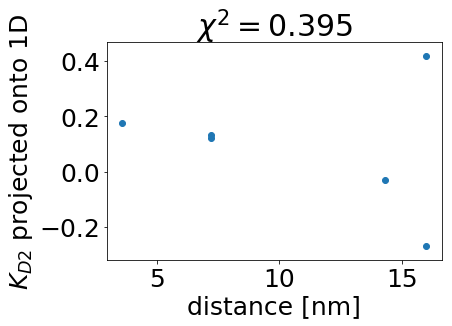

In [33]:
import scipy.optimize as opt
# 24.31276091  0.3         0.4         0.8437887
l_t = 24
alpha_t = .3
l_c = 1
alpha_c= .3
KD2max = .3
global distances
global data
distances = (run_list_biv.T[2]).astype(np.float)[0:]
data = np.array(xopt_compilation_upper68).T[0][0:]
data_upper68 = data

if not os.path.exists("spatol_models"):
            os.makedirs("spatol_models")

variables = [l_t,alpha_t,l_c,alpha_c, KD2max]

def spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances):
    compression = KD2max*np.exp(-1*alpha_c*distances-l_c)
    tension = KD2max/(1+np.exp(-1*alpha_t*(distances-l_t)))
    
    combine = (compression+tension)
    return combine

def compare_alpha_to_data(variables):
    l_t = variables[0]
    alpha_t = variables[1]   
    l_c = variables[2]
    alpha_c= variables[3]
    KD2max= variables[4]
    combine = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances[0:])

    residuals = np.sum(np.abs(combine - np.power(10,data))/(origami_alpha.master_error[:]**0))**2
    
    return residuals
dev = .42
bounds = ((l_t-dev*l_t, l_t+dev*l_t),
          (alpha_t-dev*alpha_t,alpha_t+dev*alpha_t), 
          (l_c-dev*l_c,l_c+dev*l_c),
          (alpha_c-dev*alpha_c, alpha_c+dev*alpha_c), 
         (KD2max-dev*KD2max,KD2max+dev*KD2max))
xopt_dist_function = opt.minimize(compare_alpha_to_data, variables, method="Nelder-Mead")
xopt_dist_function = opt.basinhopping(compare_alpha_to_data, xopt_dist_function.x, 
                        T=.01, stepsize=100, disp=False, niter=400,interval=10,
                       minimizer_kwargs = {"bounds": bounds, "method": "L-BFGS-B"})
# variables = xopt_dist_function.x            
l_t = xopt_dist_function.x[0]
alpha_t = xopt_dist_function.x[1]
l_c = xopt_dist_function.x[2]
alpha_c= xopt_dist_function.x[3]
KD2max= variables[4]


# compression = (compa*(distances/length_scale)**compb)
# stretch = (stretcha*(distances/length_scale)**stretchb)
combine = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances)
residuals = np.abs(combine - data)


distances_fine = np.arange(0,99,.01)
compression_fine = KD2max*np.exp(-1*alpha_c*distances_fine-l_c)
tension_fine = KD2max/(1+np.exp(-1*alpha_t*(distances_fine-l_t)))
combine_fine_upper68 = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances_fine)

# pkl.dump([l_t,alpha_t,l_c,alpha_c,KD2max, distances, data, 
#           bounds, xopt_dist_function, combine, residuals, distances_fine,
#            compression_fine, tension_fine, combine_fine,
#          ], open(master_name+'/pickle_directory/alpha_function_result.pickle', 'wb'))
np.savetxt("spatol_models/spatol"+master_name+".txt",variables)


KD1_upper68 = k_off_upper68/(k_on_upper68*10**9)
KD2 = combine_fine_upper68
KD2_data = np.power(10,data)
# K_Dapp = ((k_on**2)/(k_off**2.) + k_on/(k_off*np.power(10,combine_fine))  + 2.*(k_on/k_off))**-1
# K_Dapp_data = ((k_on**2)/(k_off**2.) + k_on/(k_off*np.power(10,data))  + 2.*(k_on/k_off))**-1

K_Dapp = apparent_KD(KD1_upper68*0.1,KD1_upper68, KD2)
K_Dapp_data = apparent_KD(KD1_upper68*0.1,KD1_upper68, KD2_data)

# plt.rc('xtick', labelsize=25) 
# plt.rc('ytick', labelsize=25) 
# plt.rcParams.update({'font.size': 25})

# plt.figure(figsize=(20,7))
# plt.subplot(131)
# plt.tight_layout()

# plt.plot(distances_fine,compression_fine,c="cyan", linewidth=5)
# plt.title("compress")
# plt.ylabel("contribution to $K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.subplot(132)
# plt.title("tension")
# plt.plot(distances_fine,tension_fine,c="cyan", linewidth=5)
# plt.xlabel("distance [nm]")

# plt.savefig(output_directory+"/ compression_stretch_curves.svg")
# plt.show()
# plt.close()




# plt.figure(figsize=(10,10))
# # plt.plot(distances,combine,c="red")
# plt.title("$K_{D2} = f(x_{biv})$")
# plt.ylabel("$log_{10} K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.scatter(distances,data, alpha = 1, s = 250, c = "#ff3399")
# plt.plot(distances_fine,np.log10(combine_fine),c="cyan", linewidth=5)
# plt.savefig(output_directory+"/ final_alpha_curve_modellogKD2.svg")
# plt.ylim(-3,1)
# plt.show()
# plt.close()

# plt.figure(figsize=(10,10))
# # plt.plot(distances,combine,c="red")
# plt.title("$K_{D2} = f(x_{biv})$")
# plt.ylabel("$K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.scatter(distances,np.power(10,data), alpha = 1, s = 250, c = "#ff3399")
# plt.plot(distances_fine,combine_fine,c="cyan", linewidth=5)
# plt.ylim(0,2)
# plt.savefig(output_directory+"/ final_alpha_curve_modelKD2.svg")
# plt.show()
# plt.close()

# plt.figure(figsize=(10,10))
# # plt.plot(distances,combine,c="red")
# plt.title("$K_{Dapp} = f(x_{biv})$")
# plt.ylabel("$K_{Dapp}$")
# plt.xlabel("distance [nm]")
# plt.plot(distances_fine,K_Dapp,c="cyan", linewidth=5)
# plt.scatter(distances,K_Dapp_data, alpha = 1, s = 250, c = "#ff3399")
# plt.savefig(output_directory+"/ final_alpha_curve_modelapp.svg")
# plt.show()
# plt.close()


# plt.figure(figsize=(20,7))
# plt.ylabel("residual $log_{10} K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.stackplot(distances,residuals, alpha = 1, colors = ["r"])
# plt.savefig(output_directory+"/ alpha_curve_model_.svg")
# plt.show()
# plt.close()
print(distances_fine[np.argmin(combine_fine_upper68)])
print(xopt_dist_function.x )
"+str(np.round(compa,1))+"
# display(Markdown("$${\huge K_{D2} = f(x) = \\left( \\frac{x}{\\ell_{stretch}} \\right)^\\alpha - \\left( \\frac{x}{\\ell_{compress}} \\right)^\\beta = \\left( \\frac{x}{"+str(np.round(l_t,1))+"} \\right)^{"+str(np.round(alpha_t,1))+"} - \\left( \\frac{x}{"+str(np.round(l_c,1))+"} \\right)^{"+str(np.round(alpha_c,1))+"}  \huge}$$"))
display(Markdown("$${\huge K_{D2} = \\frac{K_{D2}^{max}}{1+e^{-\\alpha_t (x - \\ell_t)}} + K_{D2}^{max}e^{-\\alpha_c (x- \\ell_c)}  \huge}$$"))
display(Markdown("$${\huge K_{D2} = \\frac{"+str(np.round(KD2max,1))+"}{1+e^{-"+str(np.round(alpha_t,1))+" (x - "+str(np.round(l_t,1))+" nm)}} + "+str(np.round(KD2max,1))+"e^{-"+str(np.round(alpha_c,1))+" (x- "+str(np.round(l_c,1))+" nm)}  \huge}$$"))

sliding_window = 4
moving_average_y = np.zeros(len(combine)-sliding_window)
moving_std_y = np.zeros(len(combine)-sliding_window)
for i in range(0, len(combine)-sliding_window):
    moving_average_y[i] = np.mean([j for j in data[i:i+sliding_window]])
    for j in range(i,i+sliding_window):
        moving_std_y[i] += ((data[j]-0)**2)**.5
    moving_std_y[i] = moving_std_y[i]/(sliding_window - 1)
projection_1D = moving_average_y-data[0:-sliding_window]
stdev_1D = np.std(projection_1D)
chisquared = 0
for i in range(len(combine)-sliding_window):
    chisquared += (np.log10(combine[i]) - data[i])**2/(moving_std_y[i]**2)
print(chisquared) 
plt.scatter(distances[0:-sliding_window], projection_1D)
plt.title("$\chi ^2 = $"+str(np.round(chisquared,3)))
plt.ylabel("$K_{D2}$ projected onto 1D")
plt.xlabel("distance [nm]")
plt.show()

   

## apparent binding constants - using analytical conversion from the markov KD2 - lower 95 KD1 input

11.07
[34.08        0.24156392  1.42        0.426       0.174     ]


$${\huge K_{D2} = \frac{K_{D2}^{max}}{1+e^{-\alpha_t (x - \ell_t)}} + K_{D2}^{max}e^{-\alpha_c (x- \ell_c)}  \huge}$$

$${\huge K_{D2} = \frac{0.3}{1+e^{-0.2 (x - 34.1 nm)}} + 0.3e^{-0.4 (x- 1.4 nm)}  \huge}$$

0.049410162543970154


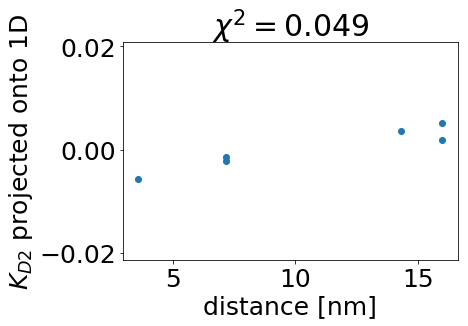

In [34]:
import scipy.optimize as opt
# 24.31276091  0.3         0.4         0.8437887
l_t = 24
alpha_t = .3
l_c = 1
alpha_c= .3
KD2max = .3
global distances
global data
distances = (run_list_biv.T[2]).astype(np.float)[0:]
data = np.array(xopt_compilation_lower95).T[0][0:]
data_lower95 = data

if not os.path.exists("spatol_models"):
            os.makedirs("spatol_models")

variables = [l_t,alpha_t,l_c,alpha_c, KD2max]

def spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances):
    compression = KD2max*np.exp(-1*alpha_c*distances-l_c)
    tension = KD2max/(1+np.exp(-1*alpha_t*(distances-l_t)))
    
    combine = (compression+tension)
    return combine

def compare_alpha_to_data(variables):
    l_t = variables[0]
    alpha_t = variables[1]   
    l_c = variables[2]
    alpha_c= variables[3]
    KD2max= variables[4]
    combine = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances[0:])

    residuals = np.sum(np.abs(combine - np.power(10,data))/(origami_alpha.master_error[:]**0))**2
    
    return residuals
dev = .42
bounds = ((l_t-dev*l_t, l_t+dev*l_t),
          (alpha_t-dev*alpha_t,alpha_t+dev*alpha_t), 
          (l_c-dev*l_c,l_c+dev*l_c),
          (alpha_c-dev*alpha_c, alpha_c+dev*alpha_c), 
         (KD2max-dev*KD2max,KD2max+dev*KD2max))
xopt_dist_function = opt.minimize(compare_alpha_to_data, variables, method="Nelder-Mead")
xopt_dist_function = opt.basinhopping(compare_alpha_to_data, xopt_dist_function.x, 
                        T=.01, stepsize=100, disp=False, niter=400,interval=10,
                       minimizer_kwargs = {"bounds": bounds, "method": "L-BFGS-B"})
# variables = xopt_dist_function.x            
l_t = xopt_dist_function.x[0]
alpha_t = xopt_dist_function.x[1]
l_c = xopt_dist_function.x[2]
alpha_c= xopt_dist_function.x[3]
KD2max= variables[4]


# compression = (compa*(distances/length_scale)**compb)
# stretch = (stretcha*(distances/length_scale)**stretchb)
combine = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances)
residuals = np.abs(combine - data)


distances_fine = np.arange(0,99,.01)
compression_fine = KD2max*np.exp(-1*alpha_c*distances_fine-l_c)
tension_fine = KD2max/(1+np.exp(-1*alpha_t*(distances_fine-l_t)))
combine_fine_lower95 = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances_fine)

# pkl.dump([l_t,alpha_t,l_c,alpha_c,KD2max, distances, data, 
#           bounds, xopt_dist_function, combine, residuals, distances_fine,
#            compression_fine, tension_fine, combine_fine,
#          ], open(master_name+'/pickle_directory/alpha_function_result.pickle', 'wb'))
np.savetxt("spatol_models/spatol"+master_name+".txt",variables)


KD1_lower95 = k_off_lower95/(k_on_lower95*10**9)
KD2 = combine_fine_lower95
KD2_data_lower95 = np.power(10,data)
# K_Dapp = ((k_on**2)/(k_off**2.) + k_on/(k_off*np.power(10,combine_fine))  + 2.*(k_on/k_off))**-1
# K_Dapp_data = ((k_on**2)/(k_off**2.) + k_on/(k_off*np.power(10,data))  + 2.*(k_on/k_off))**-1

K_Dapp = apparent_KD(KD1_lower95*0.1,KD1_lower95, KD2)
K_Dapp_data = apparent_KD(KD1_lower95*0.1,KD1_lower95, KD2_data)

# plt.rc('xtick', labelsize=25) 
# plt.rc('ytick', labelsize=25) 
# plt.rcParams.update({'font.size': 25})

# plt.figure(figsize=(20,7))
# plt.subplot(131)
# plt.tight_layout()

# plt.plot(distances_fine,compression_fine,c="cyan", linewidth=5)
# plt.title("compress")
# plt.ylabel("contribution to $K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.subplot(132)
# plt.title("tension")
# plt.plot(distances_fine,tension_fine,c="cyan", linewidth=5)
# plt.xlabel("distance [nm]")

# plt.savefig(output_directory+"/ compression_stretch_curves.svg")
# plt.show()
# plt.close()




# plt.figure(figsize=(10,10))
# # plt.plot(distances,combine,c="red")
# plt.title("$K_{D2} = f(x_{biv})$")
# plt.ylabel("$log_{10} K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.scatter(distances,data, alpha = 1, s = 250, c = "#ff3399")
# plt.plot(distances_fine,np.log10(combine_fine),c="cyan", linewidth=5)
# plt.savefig(output_directory+"/ final_alpha_curve_modellogKD2.svg")
# plt.ylim(-3,1)
# plt.show()
# plt.close()

# plt.figure(figsize=(10,10))
# # plt.plot(distances,combine,c="red")
# plt.title("$K_{D2} = f(x_{biv})$")
# plt.ylabel("$K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.scatter(distances,np.power(10,data), alpha = 1, s = 250, c = "#ff3399")
# plt.plot(distances_fine,combine_fine,c="cyan", linewidth=5)
# plt.ylim(0,2)
# plt.savefig(output_directory+"/ final_alpha_curve_modelKD2.svg")
# plt.show()
# plt.close()

# plt.figure(figsize=(10,10))
# # plt.plot(distances,combine,c="red")
# plt.title("$K_{Dapp} = f(x_{biv})$")
# plt.ylabel("$K_{Dapp}$")
# plt.xlabel("distance [nm]")
# plt.plot(distances_fine,K_Dapp,c="cyan", linewidth=5)
# plt.scatter(distances,K_Dapp_data, alpha = 1, s = 250, c = "#ff3399")
# plt.savefig(output_directory+"/ final_alpha_curve_modelapp.svg")
# plt.show()
# plt.close()


# plt.figure(figsize=(20,7))
# plt.ylabel("residual $log_{10} K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.stackplot(distances,residuals, alpha = 1, colors = ["r"])
# plt.savefig(output_directory+"/ alpha_curve_model_.svg")
# plt.show()
# plt.close()
print(distances_fine[np.argmin(combine_fine_lower95)])
print(xopt_dist_function.x )
"+str(np.round(compa,1))+"
# display(Markdown("$${\huge K_{D2} = f(x) = \\left( \\frac{x}{\\ell_{stretch}} \\right)^\\alpha - \\left( \\frac{x}{\\ell_{compress}} \\right)^\\beta = \\left( \\frac{x}{"+str(np.round(l_t,1))+"} \\right)^{"+str(np.round(alpha_t,1))+"} - \\left( \\frac{x}{"+str(np.round(l_c,1))+"} \\right)^{"+str(np.round(alpha_c,1))+"}  \huge}$$"))
display(Markdown("$${\huge K_{D2} = \\frac{K_{D2}^{max}}{1+e^{-\\alpha_t (x - \\ell_t)}} + K_{D2}^{max}e^{-\\alpha_c (x- \\ell_c)}  \huge}$$"))
display(Markdown("$${\huge K_{D2} = \\frac{"+str(np.round(KD2max,1))+"}{1+e^{-"+str(np.round(alpha_t,1))+" (x - "+str(np.round(l_t,1))+" nm)}} + "+str(np.round(KD2max,1))+"e^{-"+str(np.round(alpha_c,1))+" (x- "+str(np.round(l_c,1))+" nm)}  \huge}$$"))

sliding_window = 4
moving_average_y = np.zeros(len(combine)-sliding_window)
moving_std_y = np.zeros(len(combine)-sliding_window)
for i in range(0, len(combine)-sliding_window):
    moving_average_y[i] = np.mean([j for j in data[i:i+sliding_window]])
    for j in range(i,i+sliding_window):
        moving_std_y[i] += ((data[j]-0)**2)**.5
    moving_std_y[i] = moving_std_y[i]/(sliding_window - 1)
projection_1D = moving_average_y-data[0:-sliding_window]
stdev_1D = np.std(projection_1D)
chisquared = 0
for i in range(len(combine)-sliding_window):
    chisquared += (np.log10(combine[i]) - data[i])**2/(moving_std_y[i]**2)
print(chisquared) 
plt.scatter(distances[0:-sliding_window], projection_1D)
plt.title("$\chi ^2 = $"+str(np.round(chisquared,3)))
plt.ylabel("$K_{D2}$ projected onto 1D")
plt.xlabel("distance [nm]")
plt.show()

   

## apparent binding constants - using analytical conversion from the markov KD2 - lower 68 KD1 input

10.84
[24.99279225  0.426       1.42        0.426       0.174     ]


$${\huge K_{D2} = \frac{K_{D2}^{max}}{1+e^{-\alpha_t (x - \ell_t)}} + K_{D2}^{max}e^{-\alpha_c (x- \ell_c)}  \huge}$$

$${\huge K_{D2} = \frac{0.3}{1+e^{-0.4 (x - 25.0 nm)}} + 0.3e^{-0.4 (x- 1.4 nm)}  \huge}$$

0.09715029137542566


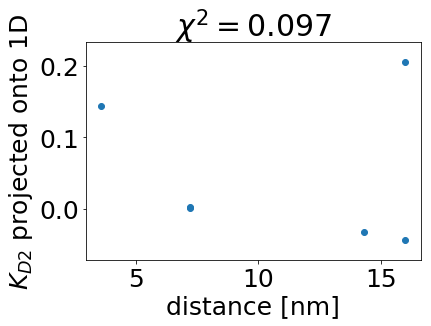

In [35]:
import scipy.optimize as opt
# 24.31276091  0.3         0.4         0.8437887
l_t = 24
alpha_t = .3
l_c = 1
alpha_c= .3
KD2max = .3
global distances
global data
distances = (run_list_biv.T[2]).astype(np.float)[0:]
data = np.array(xopt_compilation_lower68).T[0][0:]
data_lower68 = data

if not os.path.exists("spatol_models"):
            os.makedirs("spatol_models")

variables = [l_t,alpha_t,l_c,alpha_c, KD2max]

def spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances):
    compression = KD2max*np.exp(-1*alpha_c*distances-l_c)
    tension = KD2max/(1+np.exp(-1*alpha_t*(distances-l_t)))
    
    combine = (compression+tension)
    return combine

def compare_alpha_to_data(variables):
    l_t = variables[0]
    alpha_t = variables[1]   
    l_c = variables[2]
    alpha_c= variables[3]
    KD2max= variables[4]
    combine = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances[0:])

    residuals = np.sum(np.abs(combine - np.power(10,data))/(origami_alpha.master_error[:]**0))**2
    
    return residuals
dev = .42
bounds = ((l_t-dev*l_t, l_t+dev*l_t),
          (alpha_t-dev*alpha_t,alpha_t+dev*alpha_t), 
          (l_c-dev*l_c,l_c+dev*l_c),
          (alpha_c-dev*alpha_c, alpha_c+dev*alpha_c), 
         (KD2max-dev*KD2max,KD2max+dev*KD2max))
xopt_dist_function = opt.minimize(compare_alpha_to_data, variables, method="Nelder-Mead")
xopt_dist_function = opt.basinhopping(compare_alpha_to_data, xopt_dist_function.x, 
                        T=.01, stepsize=100, disp=False, niter=400,interval=10,
                       minimizer_kwargs = {"bounds": bounds, "method": "L-BFGS-B"})
# variables = xopt_dist_function.x            
l_t = xopt_dist_function.x[0]
alpha_t = xopt_dist_function.x[1]
l_c = xopt_dist_function.x[2]
alpha_c= xopt_dist_function.x[3]
KD2max= variables[4]


# compression = (compa*(distances/length_scale)**compb)
# stretch = (stretcha*(distances/length_scale)**stretchb)
combine = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances)
residuals = np.abs(combine - data)


distances_fine = np.arange(0,99,.01)
compression_fine = KD2max*np.exp(-1*alpha_c*distances_fine-l_c)
tension_fine = KD2max/(1+np.exp(-1*alpha_t*(distances_fine-l_t)))
combine_fine_lower68 = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances_fine)

# pkl.dump([l_t,alpha_t,l_c,alpha_c,KD2max, distances, data, 
#           bounds, xopt_dist_function, combine, residuals, distances_fine,
#            compression_fine, tension_fine, combine_fine,
#          ], open(master_name+'/pickle_directory/alpha_function_result.pickle', 'wb'))
np.savetxt("spatol_models/spatol"+master_name+".txt",variables)


KD1_lower68 = k_off_lower68/(k_on_lower68*10**9)
KD2 = combine_fine_lower68
KD2_data_lower68 = np.power(10,data)
# K_Dapp = ((k_on**2)/(k_off**2.) + k_on/(k_off*np.power(10,combine_fine))  + 2.*(k_on/k_off))**-1
# K_Dapp_data = ((k_on**2)/(k_off**2.) + k_on/(k_off*np.power(10,data))  + 2.*(k_on/k_off))**-1

K_Dapp = apparent_KD(KD1_lower68*0.1,KD1_lower68, KD2)
K_Dapp_data = apparent_KD(KD1_lower68*0.1,KD1_lower68, KD2_data)

# plt.rc('xtick', labelsize=25) 
# plt.rc('ytick', labelsize=25) 
# plt.rcParams.update({'font.size': 25})

# plt.figure(figsize=(20,7))
# plt.subplot(131)
# plt.tight_layout()

# plt.plot(distances_fine,compression_fine,c="cyan", linewidth=5)
# plt.title("compress")
# plt.ylabel("contribution to $K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.subplot(132)
# plt.title("tension")
# plt.plot(distances_fine,tension_fine,c="cyan", linewidth=5)
# plt.xlabel("distance [nm]")

# plt.savefig(output_directory+"/ compression_stretch_curves.svg")
# plt.show()
# plt.close()




# plt.figure(figsize=(10,10))
# # plt.plot(distances,combine,c="red")
# plt.title("$K_{D2} = f(x_{biv})$")
# plt.ylabel("$log_{10} K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.scatter(distances,data, alpha = 1, s = 250, c = "#ff3399")
# plt.plot(distances_fine,np.log10(combine_fine),c="cyan", linewidth=5)
# plt.savefig(output_directory+"/ final_alpha_curve_modellogKD2.svg")
# plt.ylim(-3,1)
# plt.show()
# plt.close()

# plt.figure(figsize=(10,10))
# # plt.plot(distances,combine,c="red")
# plt.title("$K_{D2} = f(x_{biv})$")
# plt.ylabel("$K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.scatter(distances,np.power(10,data), alpha = 1, s = 250, c = "#ff3399")
# plt.plot(distances_fine,combine_fine,c="cyan", linewidth=5)
# plt.ylim(0,2)
# plt.savefig(output_directory+"/ final_alpha_curve_modelKD2.svg")
# plt.show()
# plt.close()

# plt.figure(figsize=(10,10))
# # plt.plot(distances,combine,c="red")
# plt.title("$K_{Dapp} = f(x_{biv})$")
# plt.ylabel("$K_{Dapp}$")
# plt.xlabel("distance [nm]")
# plt.plot(distances_fine,K_Dapp,c="cyan", linewidth=5)
# plt.scatter(distances,K_Dapp_data, alpha = 1, s = 250, c = "#ff3399")
# plt.savefig(output_directory+"/ final_alpha_curve_modelapp.svg")
# plt.show()
# plt.close()


# plt.figure(figsize=(20,7))
# plt.ylabel("residual $log_{10} K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.stackplot(distances,residuals, alpha = 1, colors = ["r"])
# plt.savefig(output_directory+"/ alpha_curve_model_.svg")
# plt.show()
# plt.close()
print(distances_fine[np.argmin(combine_fine_lower68)])
print(xopt_dist_function.x )
"+str(np.round(compa,1))+"
# display(Markdown("$${\huge K_{D2} = f(x) = \\left( \\frac{x}{\\ell_{stretch}} \\right)^\\alpha - \\left( \\frac{x}{\\ell_{compress}} \\right)^\\beta = \\left( \\frac{x}{"+str(np.round(l_t,1))+"} \\right)^{"+str(np.round(alpha_t,1))+"} - \\left( \\frac{x}{"+str(np.round(l_c,1))+"} \\right)^{"+str(np.round(alpha_c,1))+"}  \huge}$$"))
display(Markdown("$${\huge K_{D2} = \\frac{K_{D2}^{max}}{1+e^{-\\alpha_t (x - \\ell_t)}} + K_{D2}^{max}e^{-\\alpha_c (x- \\ell_c)}  \huge}$$"))
display(Markdown("$${\huge K_{D2} = \\frac{"+str(np.round(KD2max,1))+"}{1+e^{-"+str(np.round(alpha_t,1))+" (x - "+str(np.round(l_t,1))+" nm)}} + "+str(np.round(KD2max,1))+"e^{-"+str(np.round(alpha_c,1))+" (x- "+str(np.round(l_c,1))+" nm)}  \huge}$$"))

sliding_window = 4
moving_average_y = np.zeros(len(combine)-sliding_window)
moving_std_y = np.zeros(len(combine)-sliding_window)
for i in range(0, len(combine)-sliding_window):
    moving_average_y[i] = np.mean([j for j in data[i:i+sliding_window]])
    for j in range(i,i+sliding_window):
        moving_std_y[i] += ((data[j]-0)**2)**.5
    moving_std_y[i] = moving_std_y[i]/(sliding_window - 1)
projection_1D = moving_average_y-data[0:-sliding_window]
stdev_1D = np.std(projection_1D)
chisquared = 0
for i in range(len(combine)-sliding_window):
    chisquared += (np.log10(combine[i]) - data[i])**2/(moving_std_y[i]**2)
print(chisquared) 
plt.scatter(distances[0:-sliding_window], projection_1D)
plt.title("$\chi ^2 = $"+str(np.round(chisquared,3)))
plt.ylabel("$K_{D2}$ projected onto 1D")
plt.xlabel("distance [nm]")
plt.show()

   

## apparent binding constants - using analytical conversion from the markov KD2 - MEAN KD1 input

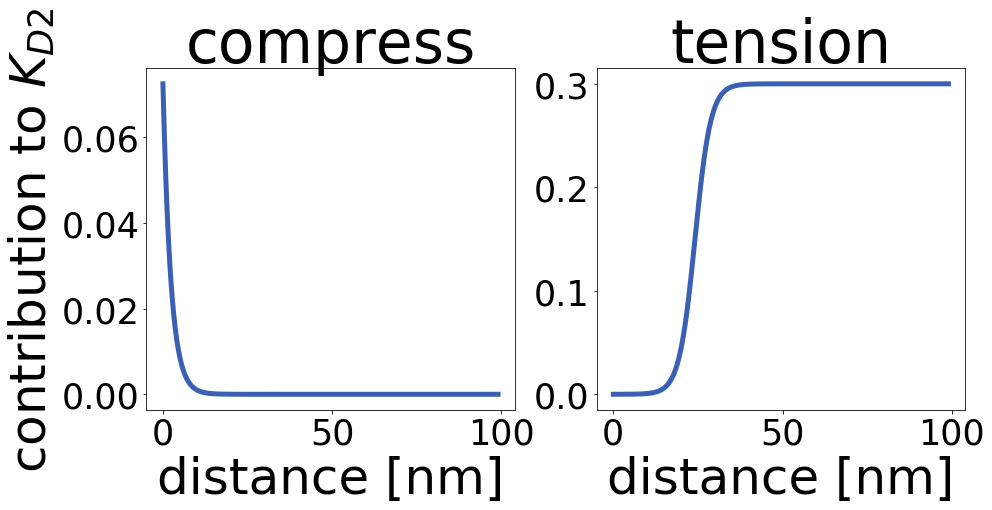

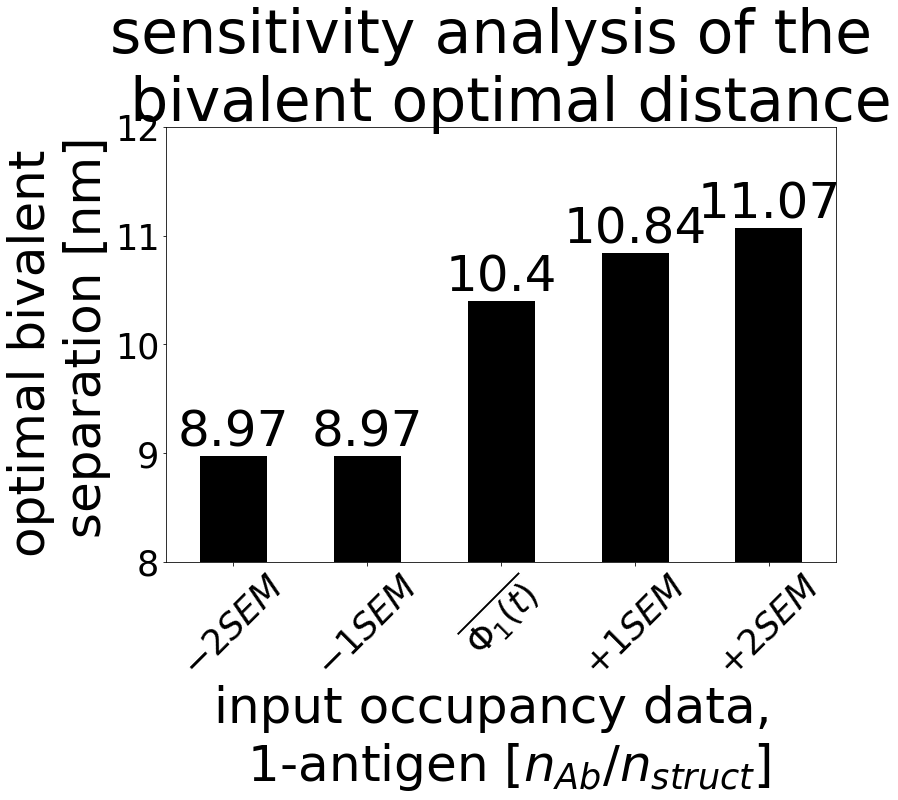

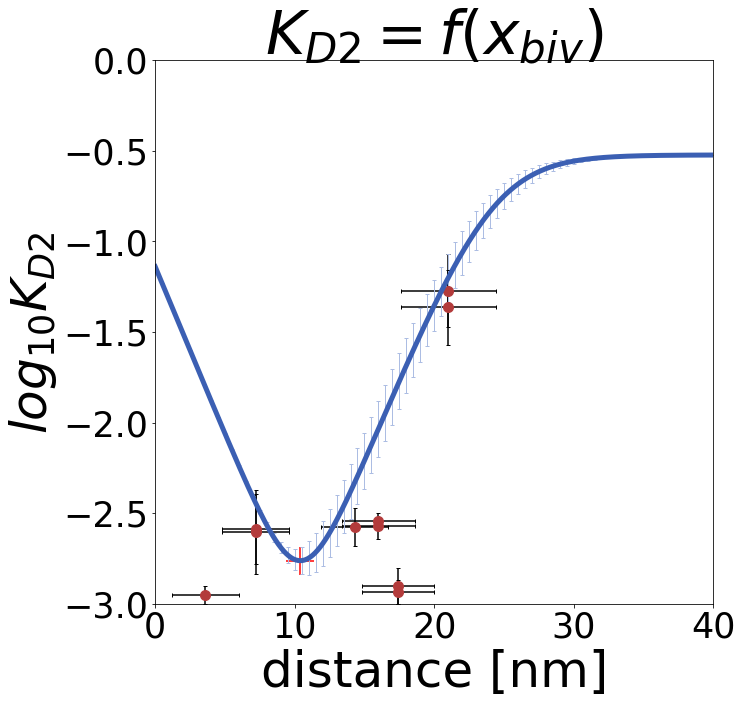

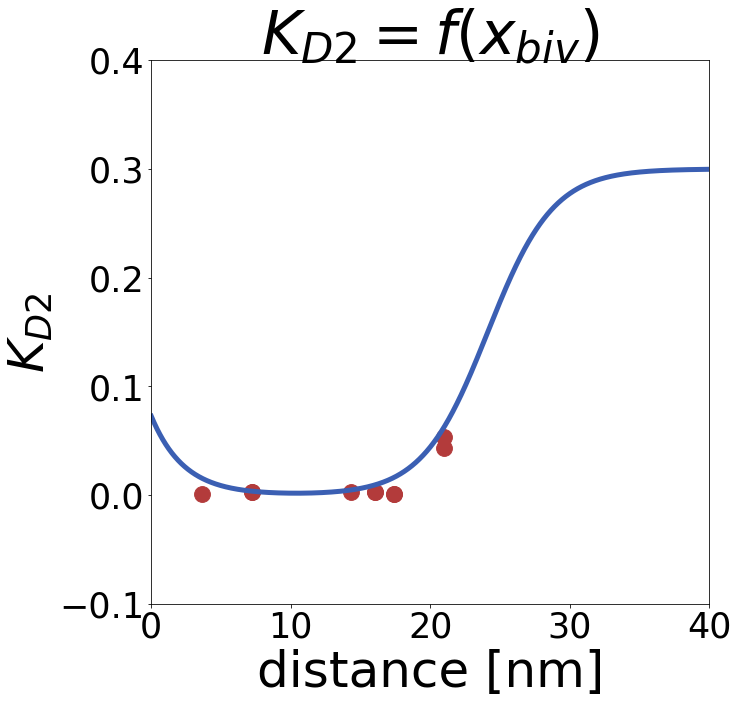

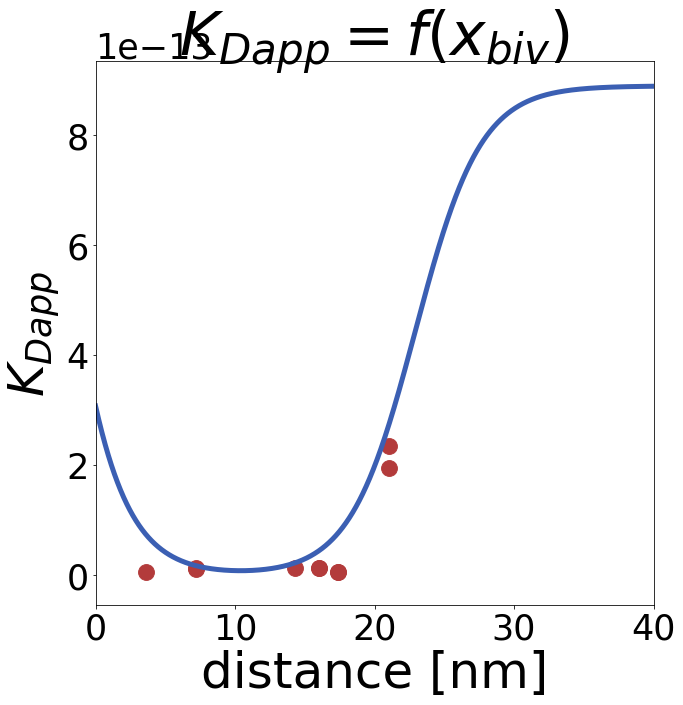

10.4
[24.11875625  0.426       1.42        0.426       0.20665868]


$${\huge K_{D2} = \frac{K_{D2}^{max}}{1+e^{-\alpha_t (x - \ell_t)}} + K_{D2}^{max}e^{-\alpha_c (x- \ell_c)}  \huge}$$

$${\huge K_{D2} = \frac{0.3}{1+e^{-0.4 (x - 24.1 nm)}} + 0.3e^{-0.4 (x- 1.4 nm)}  \huge}$$

0.948363259644873


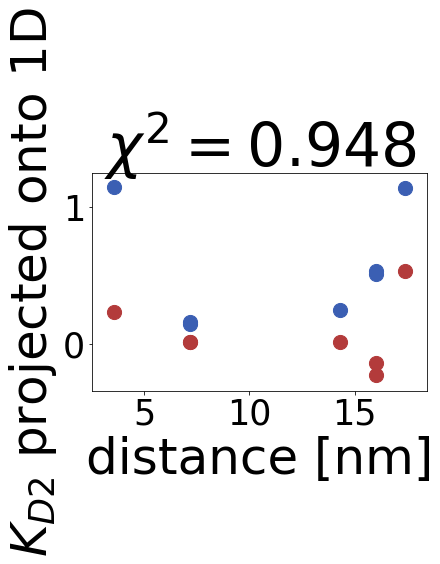

In [64]:
output_directory = master_name+"/output_SPATOL_model_figures"        
if not os.path.exists(output_directory):
            os.makedirs(output_directory)
plt.rc('xtick', labelsize=35) 
plt.rc('ytick', labelsize=35) 
plt.rcParams.update({'font.size': 50})

import scipy.optimize as opt
# 24.31276091  0.3         0.4         0.8437887
l_t = 24
alpha_t = .3
l_c = 1
alpha_c= .3
KD2max = .3
global distances
global data
distances = (run_list_biv.T[2]).astype(np.float)[0:]
data = np.array(xopt_compilation_mean).T[0][0:]


if not os.path.exists("spatol_models"):
            os.makedirs("spatol_models")

variables = [l_t,alpha_t,l_c,alpha_c, KD2max]

def spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances):
    compression = KD2max*np.exp(-1*alpha_c*distances-l_c)
    tension = KD2max/(1+np.exp(-1*alpha_t*(distances-l_t)))
    
    combine = (compression+tension)
    return combine

def compare_alpha_to_data(variables):
    l_t = variables[0]
    alpha_t = variables[1]   
    l_c = variables[2]
    alpha_c= variables[3]
    KD2max= variables[4]
    combine = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances[0:])

    residuals = np.sum(np.abs(combine - np.power(10,data))/(origami_alpha.master_error[:]**0))**2
    
    return residuals
dev = .42
bounds = ((l_t-dev*l_t, l_t+dev*l_t),
          (alpha_t-dev*alpha_t,alpha_t+dev*alpha_t), 
          (l_c-dev*l_c,l_c+dev*l_c),
          (alpha_c-dev*alpha_c, alpha_c+dev*alpha_c), 
         (KD2max-dev*KD2max,KD2max+dev*KD2max))
xopt_dist_function = opt.minimize(compare_alpha_to_data, variables, method="Nelder-Mead")
xopt_dist_function = opt.basinhopping(compare_alpha_to_data, xopt_dist_function.x, 
                        T=.01, stepsize=100, disp=False, niter=400,interval=10,
                       minimizer_kwargs = {"bounds": bounds, "method": "L-BFGS-B"})
# variables = xopt_dist_function.x            
l_t = xopt_dist_function.x[0]
alpha_t = xopt_dist_function.x[1]
l_c = xopt_dist_function.x[2]
alpha_c= xopt_dist_function.x[3]
KD2max= variables[4]


# compression = (compa*(distances/length_scale)**compb)
# stretch = (stretcha*(distances/length_scale)**stretchb)
combine = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances)
residuals = np.abs(combine - data)


distances_fine = np.arange(0,99,.01)
compression_fine = KD2max*np.exp(-1*alpha_c*distances_fine-l_c)
tension_fine = KD2max/(1+np.exp(-1*alpha_t*(distances_fine-l_t)))
combine_fine = spatial_tolerance(l_t,alpha_t,l_c,alpha_c,KD2max,distances_fine)

# pkl.dump([l_t,alpha_t,l_c,alpha_c,KD2max, distances, data, 
#           bounds, xopt_dist_function, combine, residuals, distances_fine,
#            compression_fine, tension_fine, combine_fine,
#          ], open(master_name+'/pickle_directory/alpha_function_result.pickle', 'wb'))
np.savetxt("spatol_models/spatol"+master_name+".txt",variables)


KD1 = k_off_mean/(k_on_mean*10**9)
KD2 = combine_fine
KD2_data = np.power(10,data)
# K_Dapp = ((k_on**2)/(k_off**2.) + k_on/(k_off*np.power(10,combine_fine))  + 2.*(k_on/k_off))**-1
# K_Dapp_data = ((k_on**2)/(k_off**2.) + k_on/(k_off*np.power(10,data))  + 2.*(k_on/k_off))**-1

K_Dapp = apparent_KD(KD1*0.1,KD1, KD2)
K_Dapp_data = apparent_KD(KD1*0.1,KD1, KD2_data)

mindists = [distances_fine[np.argmin(combine_fine_upper95)],
            distances_fine[np.argmin(combine_fine_upper68)],
            distances_fine[np.argmin(combine_fine)],
            distances_fine[np.argmin(combine_fine_lower68)],
            distances_fine[np.argmin(combine_fine_lower95)],]
input_intervals = ["$-2SEM$","$-1SEM$","$\\overline{\\Phi_1 (t)}}$","$+1SEM$","$+2SEM$"]




plt.figure(figsize=(20,7))
plt.subplot(131)
plt.tight_layout()

plt.plot(distances_fine,compression_fine,c="#3b5fb3", linewidth=5)
plt.title("compress")
plt.ylabel("contribution to $K_{D2}$")
plt.xlabel("distance [nm]")
plt.subplot(132)
plt.title("tension")
plt.plot(distances_fine,tension_fine,c="#3b5fb3", linewidth=5)
plt.xlabel("distance [nm]")

plt.savefig(output_directory+"/ compression_stretch_curves.svg")
plt.show()
plt.close()

# plt.bar(input_intervals,mindists)
# plt.bar_label(np.round(mindists,1), rotation = 45)
# plt.ylim(8,12)
# plt.ylabel("optimal bivalent \n separation [nm]")
# plt.title("input occupancy data, \n 1-antigen [$n_{Ab}/n_{struct}$]")
# plt.savefig(output_directory+"/ sensitivity_of_minima.svg")
# plt.show()
# plt.close()


import pandas as pd
freq_series = pd.Series(mindists)
plt.figure(figsize=(12, 8))
ax = freq_series.plot(kind="bar", colormap="Greys_r", ylim = (8,12))
ax.set_title("sensitivity analysis of the \n bivalent optimal distance")
ax.set_xlabel("input occupancy data, \n 1-antigen [$n_{Ab}/n_{struct}$]")
ax.set_ylabel("optimal bivalent \n separation [nm]")
ax.set_xticklabels(input_intervals, rotation=45)

rects = ax.patches

labels = mindists

for rect, label in zip(rects, labels):
    height = rect.get_height()
    ax.text(
        rect.get_x() + rect.get_width() / 2, height, label, ha="center", va="bottom"
    )

plt.savefig(output_directory+"/ sensitivity_of_minima.svg")
plt.show()
plt.close()












plt.figure(figsize=(10,10))
# plt.plot(distances,combine,c="red")
plt.title("$K_{D2} = f(x_{biv})$")
plt.ylabel("$log_{10} K_{D2}$")
plt.xlabel("distance [nm]")
plt.errorbar(distances,data, 
             yerr=np.abs(np.max([data-data_upper68,data-data_lower68],0)),
             xerr=(dist_errors*2),
             alpha = 1,marker="o", ms = 10, c = "#b33b3b",ls="none",ecolor="k",capsize=2.0)
plt.errorbar(distances_fine,np.log10(combine_fine),
             yerr = (np.max([np.log10(combine_fine)-np.log10(combine_fine_upper68),np.log10(combine_fine)-np.log10(combine_fine_lower68)],0) ),
             c="#3b5fb3",
             linewidth=5,
             ecolor="#acbde3",
            errorevery=50,
            elinewidth=1,capsize=2.0)
plt.scatter([distances_fine[np.argmin(combine_fine)]],[np.min(np.log10(combine_fine))],s=800, c="red", marker="+")
plt.savefig(output_directory+"/ final_alpha_curve_modellogKD2.svg")
plt.ylim(-3,0)
plt.xlim(0,40)
plt.show()
plt.close()

plt.figure(figsize=(10,10))
# plt.plot(distances,combine,c="red")
plt.title("$K_{D2} = f(x_{biv})$")
plt.ylabel("$K_{D2}$")
plt.xlabel("distance [nm]")
plt.scatter(distances,np.power(10,data), alpha = 1, s = 250, c = "#b33b3b")

plt.plot(distances_fine,combine_fine,c="#3b5fb3", linewidth=5)
plt.ylim(-0.1,0.4)
plt.xlim(0,40)
plt.savefig(output_directory+"/ final_alpha_curve_modelKD2.svg")
plt.show()
plt.close()

plt.figure(figsize=(10,10))
# plt.plot(distances,combine,c="red")
plt.title("$K_{Dapp} = f(x_{biv})$")
plt.ylabel("$K_{Dapp}$")
plt.xlabel("distance [nm]")
plt.xlim(0,40)
plt.plot(distances_fine,K_Dapp,c="#3b5fb3", linewidth=5)
plt.scatter(distances,K_Dapp_data, alpha = 1, s = 250, c = "#b33b3b")
plt.savefig(output_directory+"/ final_alpha_curve_modelapp.svg")
plt.show()
plt.close()


# plt.figure(figsize=(20,7))
# plt.ylabel("residual $log_{10} K_{D2}$")
# plt.xlabel("distance [nm]")
# plt.stackplot(distances,residuals, alpha = 1, colors = ["r"])
# plt.savefig(output_directory+"/ alpha_curve_model_.svg")
# plt.show()
# plt.close()
print(distances_fine[np.argmin(combine_fine)])
print(xopt_dist_function.x )
"+str(np.round(compa,1))+"
# display(Markdown("$${\huge K_{D2} = f(x) = \\left( \\frac{x}{\\ell_{stretch}} \\right)^\\alpha - \\left( \\frac{x}{\\ell_{compress}} \\right)^\\beta = \\left( \\frac{x}{"+str(np.round(l_t,1))+"} \\right)^{"+str(np.round(alpha_t,1))+"} - \\left( \\frac{x}{"+str(np.round(l_c,1))+"} \\right)^{"+str(np.round(alpha_c,1))+"}  \huge}$$"))
display(Markdown("$${\huge K_{D2} = \\frac{K_{D2}^{max}}{1+e^{-\\alpha_t (x - \\ell_t)}} + K_{D2}^{max}e^{-\\alpha_c (x- \\ell_c)}  \huge}$$"))
display(Markdown("$${\huge K_{D2} = \\frac{"+str(np.round(KD2max,1))+"}{1+e^{-"+str(np.round(alpha_t,1))+" (x - "+str(np.round(l_t,1))+" nm)}} + "+str(np.round(KD2max,1))+"e^{-"+str(np.round(alpha_c,1))+" (x- "+str(np.round(l_c,1))+" nm)}  \huge}$$"))


sliding_window = 3
moving_average_y = np.zeros(len(combine)-sliding_window)
moving_std_y = np.zeros(len(combine)-sliding_window)
for i in range(0, len(combine)-sliding_window):
    moving_average_y[i] = np.mean([j for j in data[i:i+sliding_window]])
    for j in range(i,i+sliding_window):
        moving_std_y[i] += ((data[j]-0)**2)
    moving_std_y[i] = np.sqrt(moving_std_y[i]/(sliding_window - 1))/sliding_window**.5
projection_1D = moving_average_y-data[0:-sliding_window]

def find_nearest(array, value):
    array = np.asarray(array)
    idx = (np.abs(array - value)).argmin()
    return idx




model_project_1D = [np.log10(combine_fine)[j] for j in [find_nearest(distances_fine, i) for i in distances]][0:-sliding_window] - data[0:-sliding_window]
stdev_1D = np.std(projection_1D)
chisquared = 0
for i in range(len(combine)-sliding_window):
    chisquared += (np.log10(combine[i]) - data[i])**2/(moving_std_y[i]**2)
print(chisquared) 
plt.scatter(distances[0:-sliding_window], model_project_1D, s=200, c="#3b5fb3" )
plt.scatter(distances[0:-sliding_window], projection_1D, s=200, c="#b33b3b" )
plt.title("$\chi ^2 = $"+str(np.round(chisquared,3)))
plt.ylabel("$K_{D2}$ projected onto 1D")
plt.xlabel("distance [nm]")
plt.savefig(output_directory+"/chisquared.svg")
plt.show()

   

In [48]:
yerr=np.abs(np.max([data-data_upper68,data-data_lower68],0))
xerr=(dist_errors*2)

In [52]:
len(yerr)

10